In [1]:
import os
import xarray as xr
import numpy as np
import scipy
import matplotlib.pyplot as plt
import matplotlib as mpl
from windrose import WindroseAxes

repertoire_courant=os.getcwd()
repertoire_figures=repertoire_courant+r"\\"+r"figures"+r"\\"
print(repertoire_courant)
repertoire_fichiers=repertoire_courant+r"\Outputs_EddyPro"+r"\\"
print("chargement des données")
T2_1_2min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_1_2min-new_full_output.nc")
T2_2_2min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_2_2min-new_full_output.nc")
T2_3_2min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_3_2min-new_full_output.nc")


T2_1_30min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_1_30min-new_full_output.nc")
T2_2_30min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_2_30min-new_full_output.nc")
T2_3_30min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_3_30min-new_full_output.nc")

spectres_1_2min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_1_2min-new_spectres.nc")
spectres_2_2min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_2_2min-new_spectres.nc")
spectres_3_2min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_3_2min-new_spectres.nc")

spectres_1_30min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_1_30min-new_spectres.nc")
spectres_2_30min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_2_30min-new_spectres.nc")
spectres_3_30min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_3_30min-new_spectres.nc")

#ogives_1_2min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_1_2min_ogives.nc")
#ogives_2_2min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_2_2min_ogives.nc")
#ogives_3_2min=xr.open_dataset(repertoire_fichiers+r"T2_TO5_3_2min_ogives.nc")

#print(T2_1_2min['instrument_height'].values)
#print(T2_2_2min['instrument_height'].values)
#print(T2_3_2min['instrument_height'].values)

#print(T2_1_30min['instrument_height'].values)
#print(T2_2_30min['instrument_height'].values)
#print(T2_3_30min['instrument_height'].values)
#print(T2_2_2min['instrument_height'].values==T2_3_2min['instrument_height'].values)

T2_1_2min=T2_1_2min.assign(wind_dir=(T2_1_2min.wind_dir+180)%360)
T2_2_2min=T2_2_2min.assign(wind_dir=(T2_2_2min.wind_dir+180)%360)
T2_3_2min=T2_3_2min.assign(wind_dir=(T2_3_2min.wind_dir+180)%360)

T2_1_30min=T2_1_30min.assign(wind_dir=(T2_1_30min.wind_dir+180)%360)
T2_2_30min=T2_2_30min.assign(wind_dir=(T2_2_30min.wind_dir+180)%360)
T2_3_30min=T2_3_30min.assign(wind_dir=(T2_3_30min.wind_dir+180)%360)

def Ri_B(U,V,T_z,T_s,z):
    "retourne le nombre de Richardson Bulk, avec T_z et T_s les températures à la hauteur z et en surface (en K)"
    return (9.81*(T_z-T_s)*z)/(T_s*(U**2+V**2))


Ri_1=Ri_B(T2_1_30min['u_mean'].values,T2_1_30min['v_mean'].values,T2_1_30min['ts_mean'].values,
          273.15,T2_1_30min['instrument_height'].values)
Ri_2=Ri_B(T2_2_30min['u_mean'].values,T2_2_30min['v_mean'].values,T2_2_30min['ts_mean'].values,
          273.15,T2_2_30min['instrument_height'].values)
Ri_3=Ri_B(T2_3_30min['u_mean'].values,T2_3_30min['v_mean'].values,T2_3_30min['ts_mean'].values,
          273.15,T2_3_30min['instrument_height'].values)
T2_1_30min=T2_1_30min.assign(Ri=Ri_B(T2_1_30min['u_mean'],T2_1_30min['v_mean'],
                                     T2_1_30min['ts_mean'],273.15,T2_1_30min['instrument_height']))
T2_2_30min=T2_2_30min.assign(Ri=Ri_B(T2_2_30min['u_mean'],T2_2_30min['v_mean'],
                                     T2_2_30min['ts_mean'],273.15,T2_2_30min['instrument_height']))
T2_3_30min=T2_3_30min.assign(Ri=Ri_B(T2_3_30min['u_mean'],T2_3_30min['v_mean'],
                                     T2_3_30min['ts_mean'],273.15,T2_3_30min['instrument_height']))

T2_1_2min=T2_1_2min.assign(Ri=Ri_B(T2_1_2min['u_mean'],T2_1_2min['v_mean'],
                                     T2_1_2min['ts_mean'],273.15,T2_1_2min['instrument_height']))
T2_2_2min=T2_2_2min.assign(Ri=Ri_B(T2_2_2min['u_mean'],T2_2_2min['v_mean'],
                                     T2_2_2min['ts_mean'],273.15,T2_2_2min['instrument_height']))
T2_3_2min=T2_3_2min.assign(Ri=Ri_B(T2_3_2min['u_mean'],T2_3_2min['v_mean'],
                                     T2_3_2min['ts_mean'],273.15,T2_3_2min['instrument_height']))


T2_1_30min=xr.combine_by_coords([T2_1_30min, spectres_1_30min])
T2_2_30min=xr.combine_by_coords([T2_2_30min, spectres_2_30min])
T2_3_30min=xr.combine_by_coords([T2_3_30min, spectres_3_30min])

T2_1_2min=xr.combine_by_coords([T2_1_2min, spectres_1_2min])
T2_2_2min=xr.combine_by_coords([T2_2_2min, spectres_2_2min])
T2_3_2min=xr.combine_by_coords([T2_3_2min, spectres_3_2min])



print(T2_1_30min)
print(T2_1_30min.data_vars)
print("fait")

C:\Users\evanl\Documents\Stage IGE
chargement des données
<xarray.Dataset>
Dimensions:                  (temps: 360, freq: 50)
Coordinates:
  * temps                    (temps) datetime64[ns] 2023-09-01T00:30:00 ... 2...
  * freq                     (freq) float64 0.0006104 nan nan ... 7.489 9.11
Data variables: (12/96)
    daytime                  (temps) int64 ...
    Tau                      (temps) float64 ...
    qc_Tau                   (temps) int64 ...
    H                        (temps) float64 ...
    qc_H                     (temps) int64 ...
    H_strg                   (temps) float64 ...
    ...                       ...
    f_C_wts_norm             (freq, temps) float64 ...
    f_Su                     (freq, temps) float64 ...
    f_Sv                     (freq, temps) float64 ...
    f_Sw                     (freq, temps) float64 ...
    f_Sts                    (freq, temps) float64 ...
    f_C_wts                  (freq, temps) float64 ...
Data variables:
    daytim

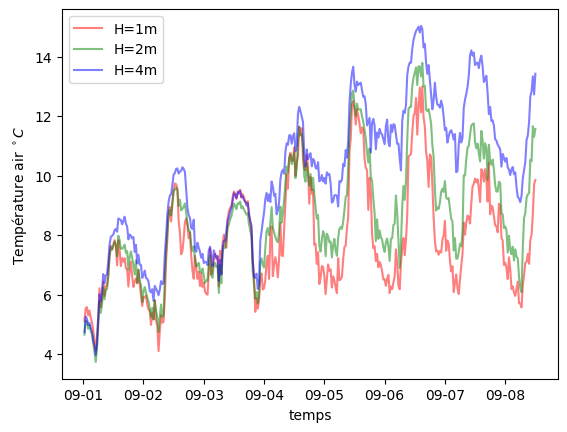

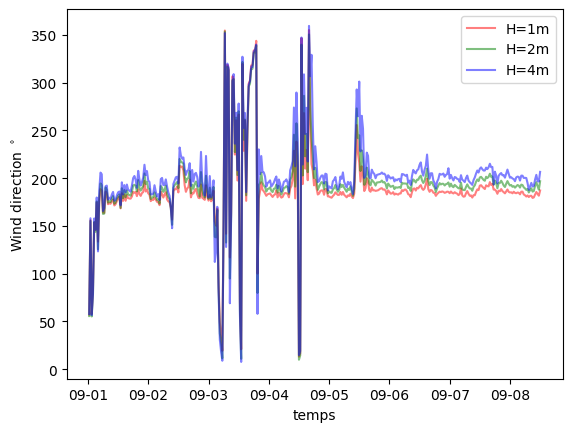

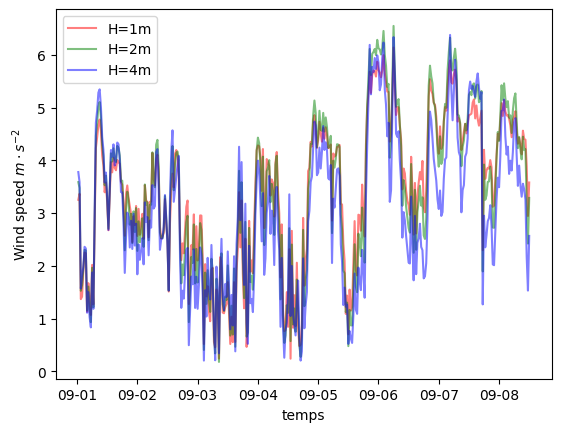

In [2]:
date_format=mpl.dates.DateFormatter("%m-%d")
#date_format=mpl.dates.DateFormatter("%H")
fig=plt.figure()
ax = fig.add_subplot(111)
ax.plot(T2_1_30min.coords['temps'].values,T2_1_30min['air_temperature'].values-273.15,color='r',label="H=1m",alpha=0.5)
ax.plot(T2_2_30min.coords['temps'].values,T2_2_30min['air_temperature'].values-273.15,color='g',label="H=2m",alpha=0.5)
ax.plot(T2_3_30min.coords['temps'].values,T2_3_30min['air_temperature'].values-273.15,color='b',label="H=4m",alpha=0.5)
#plt.axhline(200+30,color='r')
#plt.axhline(200-30,color='r')
ax.legend()
ax.set_xlabel("temps")
ax.set_ylabel(r"Température air $^\circ C$")
#plt.xlim(right=np.datetime64('2023-09-01 18:00:00'),left=np.datetime64('2023-09-02 18:00:00'))
#ax.set_ylim(200-30,200+30)
ax.xaxis.set_major_formatter(date_format)


fig=plt.figure()
ax = fig.add_subplot(111)
ax.plot(T2_1_30min.coords['temps'].values,T2_1_30min['wind_dir'].values,color='r',label="H=1m",alpha=0.5)
ax.plot(T2_2_30min.coords['temps'].values,T2_2_30min['wind_dir'].values,color='g',label="H=2m",alpha=0.5)
ax.plot(T2_3_30min.coords['temps'].values,T2_3_30min['wind_dir'].values,color='b',label="H=4m",alpha=0.5)
#plt.axhline(200+30,color='r')
#plt.axhline(200-30,color='r')
ax.legend()
ax.set_xlabel("temps")
ax.set_ylabel(r"Wind direction $^\circ$")
#plt.xlim(right=np.datetime64('2023-09-01 18:00:00'),left=np.datetime64('2023-09-02 18:00:00'))
#ax.set_ylim(200-30,200+30)
ax.xaxis.set_major_formatter(date_format)
#plt.savefig(repertoire_figures+"T2_TO5_WDir.png")

fig=plt.figure()
ax4 = fig.add_subplot(111)
ax4.plot(T2_1_30min.coords['temps'].values,T2_1_30min['wind_speed'].values,color='r',label="H=1m",alpha=0.5)
ax4.plot(T2_2_30min.coords['temps'].values,T2_2_30min['wind_speed'].values,color='g',label="H=2m",alpha=0.5)
ax4.plot(T2_3_30min.coords['temps'].values,T2_3_30min['wind_speed'].values,color='b',label="H=4m",alpha=0.5)
ax4.legend()
ax4.set_xlabel("temps")
ax4.set_ylabel(r"Wind speed $m\cdot s^{-2}$")
#plt.xlim(right=np.datetime64('2023-09-01 18:00:00'),left=np.datetime64('2023-09-02 18:00:00'))
ax4.xaxis.set_major_formatter(date_format)
#plt.savefig(r"figures\ecart_T2_TO5.png")

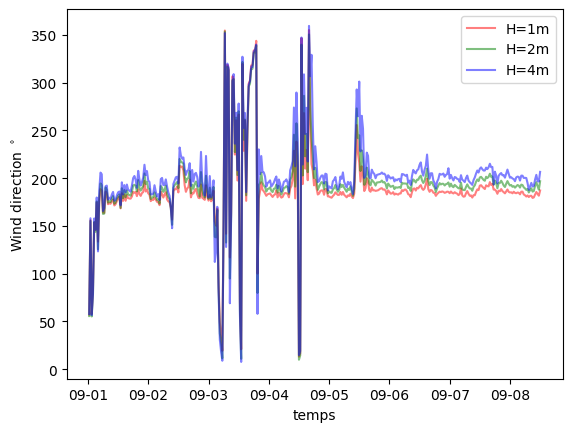

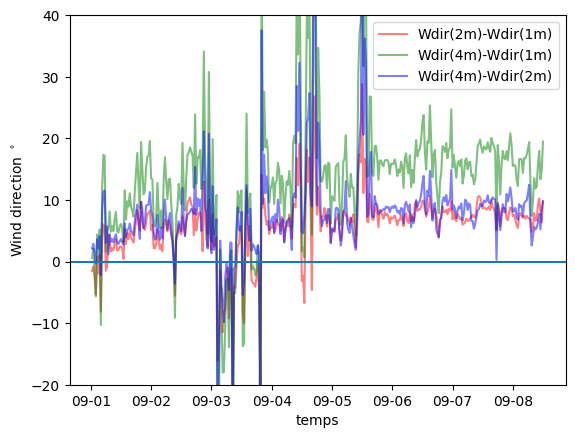

In [3]:
date_format=mpl.dates.DateFormatter("%m-%d")
fig=plt.figure()
ax = fig.add_subplot(111)
ax.plot(T2_1_30min.coords['temps'].values,T2_1_30min['wind_dir'].values,color='r',label="H=1m",alpha=0.5)
ax.plot(T2_2_30min.coords['temps'].values,T2_2_30min['wind_dir'].values,color='g',label="H=2m",alpha=0.5)
ax.plot(T2_3_30min.coords['temps'].values,T2_3_30min['wind_dir'].values,color='b',label="H=4m",alpha=0.5)
#plt.axhline(200+30,color='r')
#plt.axhline(200-30,color='r')
ax.legend()
ax.set_xlabel("temps")
ax.set_ylabel(r"Wind direction $^\circ$")
#plt.xlim(right=np.datetime64('2023-09-01 18:00:00'),left=np.datetime64('2023-09-02 18:00:00'))
#ax.set_ylim(200-30,200+30)
ax.xaxis.set_major_formatter(date_format)



fig=plt.figure()
ax = fig.add_subplot(111)
ax.plot(T2_1_30min.coords['temps'].values,T2_2_30min['wind_dir'].values-T2_1_30min['wind_dir'].values,
        color='r',label="Wdir(2m)-Wdir(1m)",alpha=0.5,)
ax.plot(T2_2_30min.coords['temps'].values,T2_3_30min['wind_dir'].values-T2_1_30min['wind_dir'].values,
        color='g',label="Wdir(4m)-Wdir(1m)",alpha=0.5)
ax.plot(T2_2_30min.coords['temps'].values,T2_3_30min['wind_dir'].values-T2_2_30min['wind_dir'].values,
        color='b',label="Wdir(4m)-Wdir(2m)",alpha=0.5)
#ax.axhline(200+30,color='r')
#ax.axhline(200-30,color='r')
ax.legend()
ax.set_xlabel("temps")
ax.set_ylabel(r"Wind direction $^\circ$")
ax.set_ylim(-20,40)
ax.axhline(0)
#plt.xlim(right=np.datetime64('2023-09-01 18:00:00'),left=np.datetime64('2023-09-02 18:00:00'))
#ax.set_ylim(200-30,200+30)
ax.xaxis.set_major_formatter(date_format)
plt.savefig(repertoire_figures+"T2_TO5_WDir_shift.png")

Text(0.5, 0, '$u^*$ ($m\\cdot s^{-1}$)')

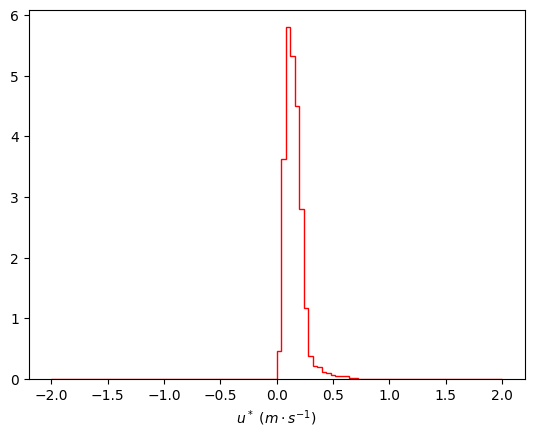

In [4]:
fig=plt.figure()

plt.hist(T2_1_2min['u*'].values,color='r',histtype='step',
        label='H=1m',density=True,bins=100,range=(-2,2))
plt.xlabel(r"$u^*$ ($m\cdot s^{-1}$)")

In [5]:
#calcul de l'épaisseur de la couche d'Ekman
eta=1.85e-5#Pa.s
rho=0.91#kg/m^3
nu=eta/rho#viscosité cinématique
lat=np.deg2rad(45)#latitude en rad
omega=7.92e-5#frequence de rotation de la Terre (rad/s)
f=2.0*omega*np.sin(lat)
print(f"viscosité cinématique: nu = {nu} m^2/s")
print(f"facteur de Coriolis f = {f} rad/s")
delta=np.sqrt((2.0*nu)/f)
print(f"epaisseur couche Ekman visqueuse delta = {delta} m")
#cf Stull page 212
u_t=0.2#m/s, vitesse de friction
h=2.0*0.1*0.41*(np.pi**2)*u_t/f
print(f"epaisseur couche Ekman turbulente h = {h} m")

viscosité cinématique: nu = 2.0329670329670326e-05 m^2/s
facteur de Coriolis f = 0.00011200571413994913 rad/s
epaisseur couche Ekman visqueuse delta = 0.6025041965023568 m
epaisseur couche Ekman turbulente h = 1445.118344369667 m


Text(0.5, 0, 'Temperature air $^\\circ C$')

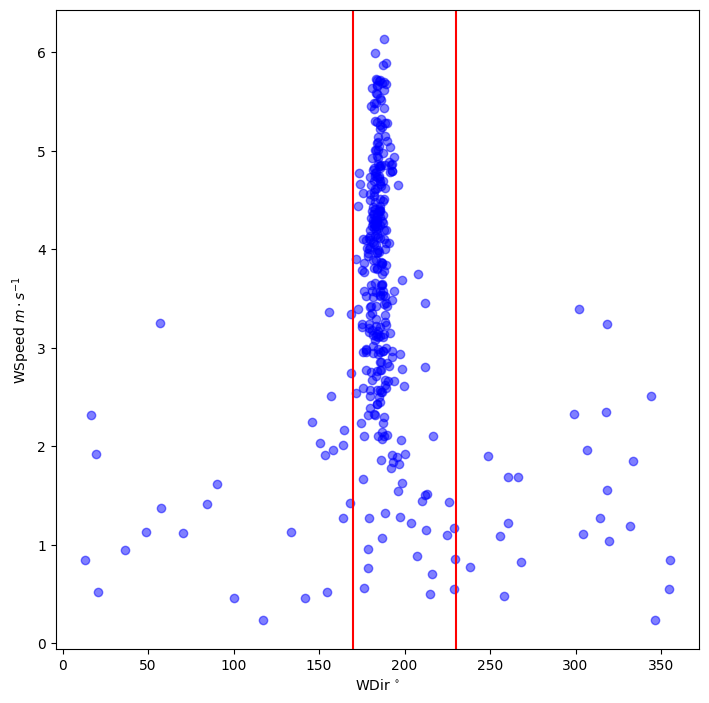

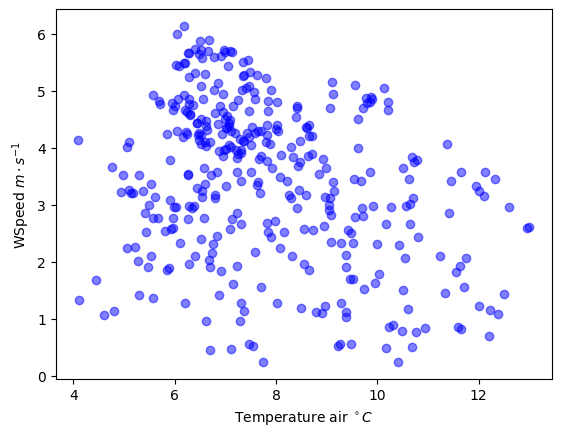

In [62]:
fig=plt.figure(figsize=(8.3,8.3))
plt.scatter(T2_1_30min['wind_dir'].values,T2_1_30min['wind_speed'].values,alpha=0.5,color='b',label='H=1m')
#plt.scatter(T2_2_30min['wind_dir'].values,T2_2_30min['wind_speed'].values,alpha=0.5,color='g',label='H=2m')
#plt.scatter(T2_3_30min['wind_dir'].values,T2_3_30min['wind_speed'].values,alpha=0.5,color='b',label='H=4.14m')
plt.ylabel(r"WSpeed $m\cdot s^{-1}$")
plt.xlabel(r"WDir $^{\circ}$")
plt.axvline(200+30,color='r')
plt.axvline(200-30,color='r')
#plt.legend()
plt.savefig(repertoire_figures+"WDir_vs_WSpeed_T2_TO5_1.png")

fig=plt.figure()
plt.scatter(T2_1_30min['air_temperature'].values-273.15,T2_1_30min['wind_speed'].values,alpha=0.5,color='b',label='H=1m')
#plt.scatter(T2_2_30min['air_temperature'].values-273.15,T2_2_30min['wind_speed'].values,alpha=0.5,color='g',label='H=2m')
#plt.scatter(T2_3_30min['air_temperature'].values-273.15,T2_3_30min['wind_speed'].values,alpha=0.5,color='b',label='H=4.14m')
plt.ylabel(r"WSpeed $m\cdot s^{-1}$")
plt.xlabel(r"Temperature air $^\circ C$")
#plt.legend()
#plt.savefig(repertoire_figures+"Temp_vs_WDSpeed_T2_TO5_1.png")

In [7]:
T2_1_2min_moy_all=T2_1_2min.coarsen(temps=15,side='left').mean()
WDir_1=(T2_1_2min_moy_all['wind_dir'].values >= (200-30)) & (T2_1_2min_moy_all['wind_dir'].values <= (200+30))
NWDir=WDir_1.size
N_K=np.sum(np.where(WDir_1==False, 0, 1))
#print(WDir_1)
print(N_K)
print(f"fraction episodes catabatiques de 30minutes {100.0*N_K/NWDir} %")

312
fraction episodes catabatiques de 30minutes 86.66666666666667 %


<xarray.Dataset>
Dimensions:                  (temps: 97, freq: 50)
Coordinates:
  * temps                    (temps) datetime64[ns] 2023-09-06 ... 2023-09-08
  * freq                     (freq) float64 0.0006104 nan nan ... 7.489 9.11
Data variables: (12/96)
    daytime                  (temps) int64 ...
    Tau                      (temps) float64 ...
    qc_Tau                   (temps) int64 ...
    H                        (temps) float64 ...
    qc_H                     (temps) int64 ...
    H_strg                   (temps) float64 ...
    ...                       ...
    f_C_wts_norm             (freq, temps) float64 ...
    f_Su                     (freq, temps) float64 ...
    f_Sv                     (freq, temps) float64 ...
    f_Sw                     (freq, temps) float64 ...
    f_Sts                    (freq, temps) float64 ...
    f_C_wts                  (freq, temps) float64 ...
<xarray.Dataset>
Dimensions:                  (temps: 96, freq: 50)
Coordinates:
  * tem

C:\Users\evanl\AppData\Local\Temp\ipykernel_34480\745629846.py:395: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


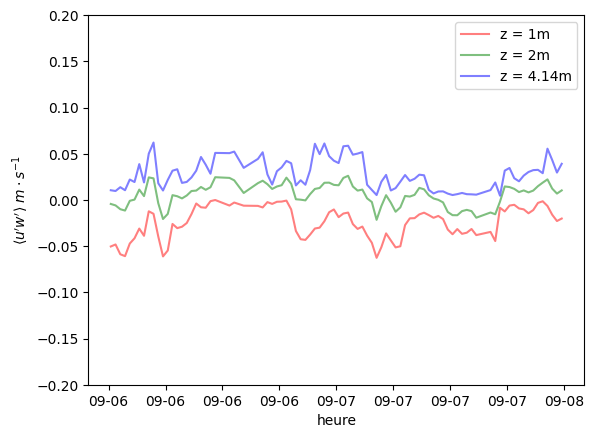

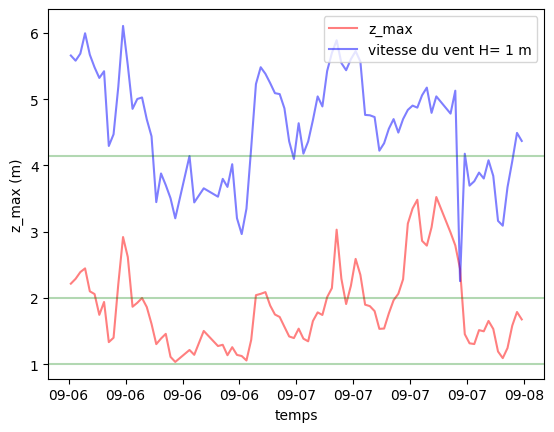

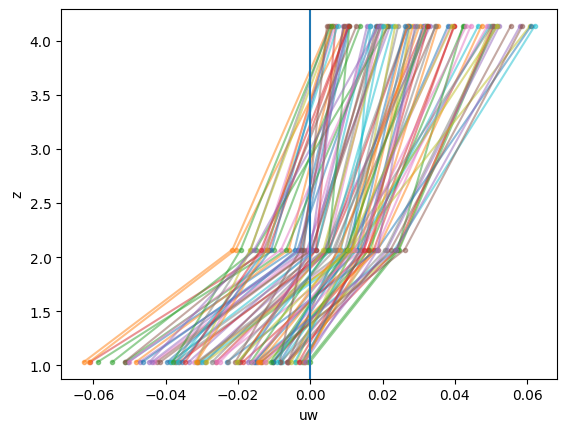

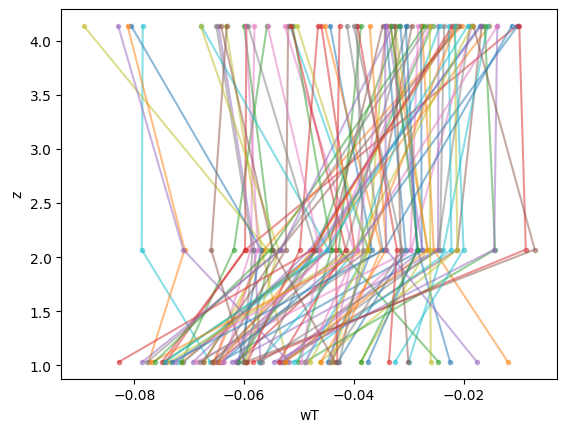

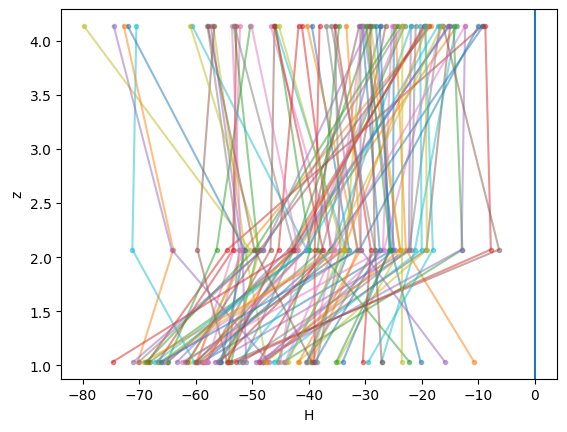

...

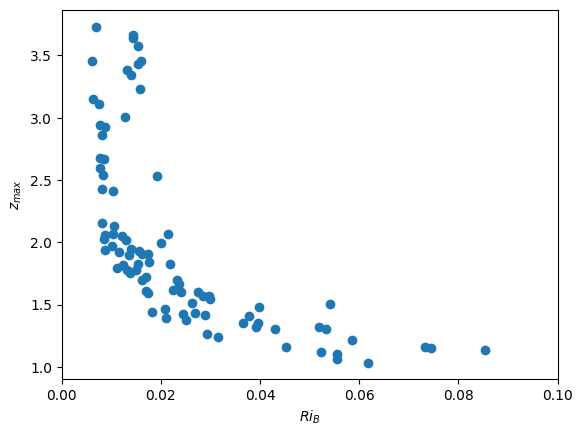

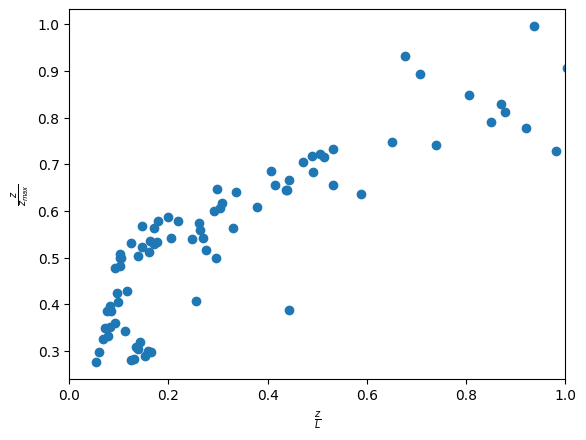

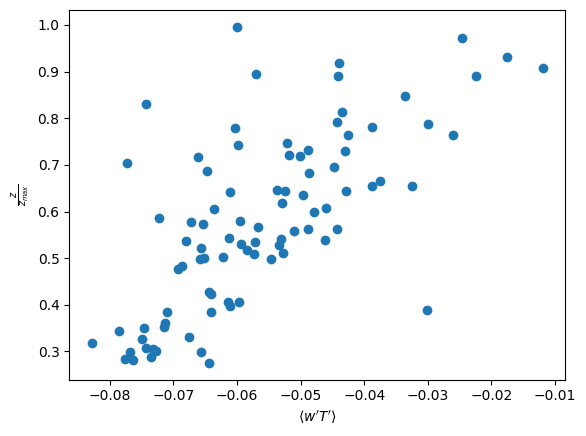

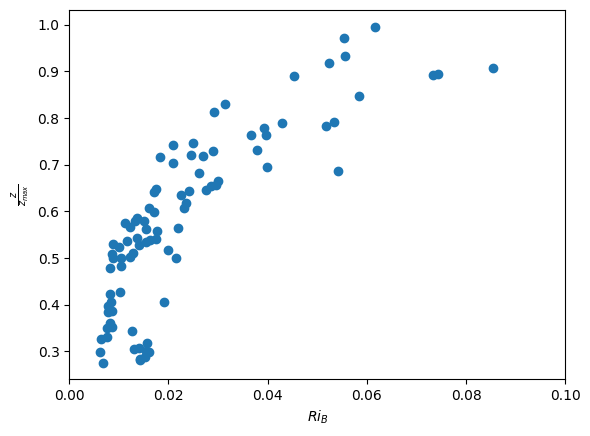

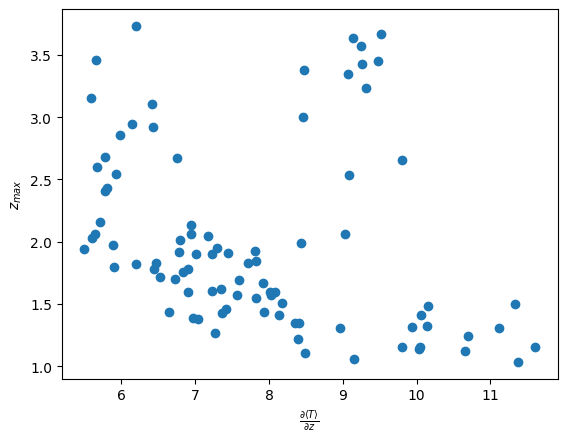

<Figure size 640x480 with 0 Axes>

In [8]:
import numpy.polynomial.polynomial as poly


T2_1_2min_moy=T2_1_2min.coarsen(temps=15,side='left').mean()
T2_2_2min_moy=T2_2_2min.coarsen(temps=15,side='left').mean()
T2_3_2min_moy=T2_3_2min.coarsen(temps=15,side='left').mean()


def detection_catabatique(level_1,level_2,level_3,mode='uw',WDIR_slope=200,sector=30, drop=True):
    "detecte changement de signe de <uw> (Grachev 2016)"
    #marche uniquement pour une hauteur supérieure à celle du niveau 1, et inférieure à celle du niveau 2
    #ne prend pas en compte le changement de signe de <uT>, car on l'a pas
    uw_level_1=level_1['wu_cov']#.values
    uw_level_2=level_2['wu_cov']#.values
    uw_level_3=level_3['wu_cov']#.values
    WDIR_1=level_1['wind_dir']
    #masque_uw= ((np.sign(uw_level_1) != np.sign(uw_level_2)) | (np.sign(uw_level_2) != np.sign(uw_level_3)))
    #masque_signe_uw = (((uw_level_1 < 0) | (uw_level_2 < 0)) & (uw_level_3 > 0)) | (((uw_level_3 > 0)|(uw_level_2 > 0)) & (uw_level_1 < 0))
    masque_signe_uw = (((uw_level_1 < 0) & (uw_level_2 < 0)) & (uw_level_3 > 0)) | (((uw_level_3 > 0)&(uw_level_2 > 0)) & (uw_level_1 < 0))
    masque_variation_uw=(uw_level_1 < uw_level_2) | (uw_level_2 < uw_level_3)
    masque_uw=masque_signe_uw & masque_variation_uw
    masque_wind_dir=(WDIR_1 >= (WDIR_slope-sector)) & (WDIR_1 <= (WDIR_slope+sector))
    if mode=='uw':
        return level_1.where(masque_uw,drop=drop),level_2.where(masque_uw,drop=drop),level_3.where(masque_uw,drop=drop)
    elif mode=='WDIR':
        return level_1.where(masque_wind_dir,drop=drop),level_2.where(masque_wind_dir,drop=drop),level_3.where(masque_wind_dir,drop=drop)
    elif mode =='all':
        masque_all=masque_uw & masque_wind_dir
        return level_1.where(masque_all,drop=drop),level_2.where(masque_all,drop=drop),level_3.where(masque_all,drop=drop)
    else:
        raise ValueError(f"mode={mode}, valeurs possibles 'uw','WDIR',all")

def zero_droite(x1,x2,y1,y2):
    a=(y2-y1)/(x2-x1)
    b1=y1-a*x1
    b2=y2-a*x2
    b_moy=(b1+b2)/2.0
    return -b_moy/a
def max_interp_lin(x1,x2,x3,y1,y2,y3):
    if np.sign(y1) != np.sign(y2):
        return zero_droite(x1,x2,y1,y2)
    elif np.sign(y2) != np.sign(y3):
        return zero_droite(x2,x3,y2,y3)
    else:
        return np.NaN
    
def max_interp_pol(x1,x2,x3,y1,y2,y3):
    poly_interp = poly.polyfit([x1,x2,x3],[y1,y2,y3],deg=2)
    roots=poly.polyroots(poly_interp)
    #print(roots)
    range_roots= lambda x: True if (x >= x1 and x <= x3) else False 
    #print(not (range_roots(roots[0]) and range_roots(roots[1])))
    if  (range_roots(roots[0]) and range_roots(roots[1])):
        return np.NaN
    #print(np.min(roots))
    return np.min(roots)

def max_catabatique(level_1,level_2,level_3,interp='linear'):
    if interp not in ['linear','poly']:
        raise  ValueError(f"argument interp {interp} must be in {['linear','poly']}")
    dic_func={'linear':max_interp_lin,
              'poly':max_interp_pol}
    func_interp=dic_func[interp]
    uw_level_1=level_1['wu_cov'].values
    uw_level_2=level_2['wu_cov'].values
    uw_level_3=level_3['wu_cov'].values
    z_level_1=level_1['instrument_height'].values
    z_level_2=level_2['instrument_height'].values
    z_level_3=level_3['instrument_height'].values
    N_ech=uw_level_1.size
    z_max=np.ones(N_ech)
    for i in range(0,N_ech):
        z_max_i=func_interp(z_level_1[i],
                             z_level_2[i],
                             z_level_3[i],
                             uw_level_1[i],
                             uw_level_2[i],
                             uw_level_3[i])
        if (z_max_i < z_level_1[i]) or (z_max_i > z_level_3[i]):
            z_max_i=np.NaN
        else:
            z_max[i]=z_max_i
    return xr.Dataset({'z_max':('temps',z_max)},coords=level_1.coords)

N_nan=lambda x:np.sum(np.where(np.isnan(x), 1, 0))
#on choisir une période où le vent ne souffle que dans la direction de la vallée
tmin_K=np.datetime64("2023-09-06 00:00:00")
tmax_K=np.datetime64("2023-09-08 00:00:00")


T2_1_2min_trunc=T2_1_2min.sel(temps=slice(tmin_K, tmax_K))
T2_2_2min_trunc=T2_2_2min.sel(temps=slice(tmin_K, tmax_K))
T2_3_2min_trunc=T2_3_2min.sel(temps=slice(tmin_K, tmax_K))
T2_1_30min_trunc=T2_1_30min.sel(temps=slice(tmin_K, tmax_K))
T2_2_30min_trunc=T2_2_30min.sel(temps=slice(tmin_K, tmax_K))
T2_3_30min_trunc=T2_3_30min.sel(temps=slice(tmin_K, tmax_K))

T2_1_2min_moy=T2_1_2min_trunc.coarsen(temps=15,side='left',boundary='trim').mean()
T2_2_2min_moy=T2_2_2min_trunc.coarsen(temps=15,side='left',boundary='trim').mean()
T2_3_2min_moy=T2_3_2min_trunc.coarsen(temps=15,side='left',boundary='trim').mean()

print(T2_1_30min_trunc)

print(T2_1_2min_moy)


T2_1_K,T2_2_K,T2_3_K=detection_catabatique(T2_1_2min_moy,T2_2_2min_moy,T2_3_2min_moy,mode='all')
#T2_1_K,T2_2_K,T2_3_K=detection_catabatique(T2_1_30min,T2_2_30min,T2_3_30min,mode='all')
print(f"nombre épisodes sélectionnés : {T2_1_K.coords['temps'].size} sur {T2_1_2min_moy.coords['temps'].size}")
print(f"soit {np.round(100.0*T2_1_K.coords['temps'].size/T2_1_2min_moy.coords['temps'].size,2)} %")
#print(T2_1_K)
date_format=mpl.dates.DateFormatter("%m-%d")
#date_format=mpl.dates.DateFormatter("%H-%M")
fig=plt.figure()
ax=fig.add_subplot(111)

ax.plot(T2_1_K.coords['temps'].values,T2_1_K['wu_cov'].values,
         color='r',label='z = 1m',alpha=0.5)
ax.plot(T2_2_K.coords['temps'].values,T2_2_K['wu_cov'].values,
         color='g',label='z = 2m',alpha=0.5)
ax.plot(T2_3_K.coords['temps'].values,T2_3_K['wu_cov'].values,
         color='b',label='z = 4.14m',alpha=0.5)
ax.xaxis.set_major_formatter(date_format)
ax.set_xlabel("heure")
ax.set_ylabel(r"$\langle u'w' \rangle$ $m\cdot s^{-1}$")
ax.set_ylim(-0.2,0.2)
ax.legend()
#plt.savefig(repertoire_figures+"evolution_uw_all.png")


Ds_z_max=max_catabatique(T2_1_K,T2_2_K,T2_3_K)
z_max_lin=Ds_z_max['z_max'].values
Ds_z_max_poly=max_catabatique(T2_1_K,T2_2_K,T2_3_K,interp='poly')
z_max_poly=Ds_z_max_poly['z_max'].values
print(f"Nombres d'échantillons rejetés pour le max de vent : {N_nan(Ds_z_max['z_max'].values)} sur {Ds_z_max['z_max'].values.size}")
print(f"soit {100.0*np.round((N_nan(Ds_z_max['z_max'].values)/Ds_z_max['z_max'].values.size),3)} %")
print(f" 1< z_max < 2m {np.round(100.0*Ds_z_max.where(Ds_z_max['z_max'] <= 2,drop=True)['z_max'].values.size/Ds_z_max['z_max'].values.size,2)} %")
#print(Ds_z_max)

fig=plt.figure()
ax=fig.add_subplot(111)
z_max=Ds_z_max_poly['z_max'].values
ax.plot(Ds_z_max.coords['temps'].values,z_max,
         color='r',label='z_max',alpha=0.5)
ax.plot(T2_1_K.coords['temps'].values,T2_1_K['wind_speed'].values,color='b', label='vitesse du vent H= 1 m',alpha=0.5)
ax.xaxis.set_major_formatter(date_format)
ax.set_xlabel("temps")
ax.set_ylabel(r"z_max (m)")
ax.axhline(1.0,color='g',alpha=0.3)
ax.axhline(2.0,color='g',alpha=0.3)
ax.axhline(4.14,color='g',alpha=0.3)
ax.legend()
#plt.savefig(repertoire_figures+"z_max_evolution_all.png")

fig=plt.figure()
for i in range(0,T2_1_K.coords['temps'].size):
    plt.plot([T2_1_K['wu_cov'].values[i],
              T2_2_K['wu_cov'].values[i],
              T2_3_K['wu_cov'].values[i]],
             [T2_1_K['instrument_height'].values[i],
              T2_2_K['instrument_height'].values[i],
              T2_3_K['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('uw')
plt.ylabel('z')
plt.axvline(0)
#plt.savefig(repertoire_figures+"profil_uw.png")


fig=plt.figure()
for i in range(0,T2_1_K.coords['temps'].size):
    plt.plot([T2_1_K['wts_cov'].values[i],
              T2_2_K['wts_cov'].values[i],
              T2_3_K['wts_cov'].values[i]],
             [T2_1_K['instrument_height'].values[i],
              T2_2_K['instrument_height'].values[i],
              T2_3_K['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('wT')
plt.ylabel('z')

fig=plt.figure()
for i in range(0,T2_1_K.coords['temps'].size):
    plt.plot([T2_1_K['H'].values[i],
              T2_2_K['H'].values[i],
              T2_3_K['H'].values[i]],
             [T2_1_K['instrument_height'].values[i],
              T2_2_K['instrument_height'].values[i],
              T2_3_K['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('H')
plt.ylabel('z')
plt.axvline(0)

#plt.axvline(0)
#plt.savefig(repertoire_figures+"profil_wT.png")

fig=plt.figure()
for i in range(0,T2_1_K.coords['temps'].size):
    plt.plot([T2_1_K['zL'].values[i],
              T2_2_K['zL'].values[i],
              T2_3_K['zL'].values[i]],
             [T2_1_K['instrument_height'].values[i],
              T2_2_K['instrument_height'].values[i],
              T2_3_K['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel(r"$\frac{z-d}{L}$")
plt.ylabel('z')
plt.xlim(-2,2)

fig=plt.figure()
for i in range(0,T2_1_K.coords['temps'].size):
    plt.plot([T2_1_K['L'].values[i],
              T2_2_K['L'].values[i],
              T2_3_K['L'].values[i]],
             [T2_1_K['instrument_height'].values[i],
              T2_2_K['instrument_height'].values[i],
              T2_3_K['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel(r"L_{MO}$")
plt.ylabel('z')
plt.xlim(-10,10)


fig=plt.figure()
for i in range(0,T2_1_K.coords['temps'].size):
    #U_i_1=np.sqrt(T2_1_K['u_mean'].values[i]**2+T2_1_K['v_mean'].values[i]**2)
    #U_i_2=np.sqrt(T2_2_K['u_mean'].values[i]**2+T2_2_K['v_mean'].values[i]**2)
    #U_i_3=np.sqrt(T2_3_K['u_mean'].values[i]**2+T2_3_K['v_mean'].values[i]**2)
    U_i_1=T2_1_K['u_rot'].values[i]
    U_i_2=T2_2_K['u_rot'].values[i]
    U_i_3=T2_3_K['u_rot'].values[i]
    plt.plot([U_i_1,
              U_i_2,
              U_i_3],
             [T2_1_K['instrument_height'].values[i],
              T2_2_K['instrument_height'].values[i],
              T2_3_K['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('U')
plt.ylabel('z')
plt.savefig(repertoire_figures+"profil_U.png")
fig=plt.figure()
for i in range(0,T2_1_K.coords['temps'].size):
    plt.plot([T2_1_K['air_temperature'].values[i]-273.15,
              T2_2_K['air_temperature'].values[i]-273.15,
              T2_3_K['air_temperature'].values[i]-273.15],
             [T2_1_K['instrument_height'].values[i],
              T2_2_K['instrument_height'].values[i],
              T2_3_K['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('T (degrés Celsius)')
plt.ylabel('z')
#plt.savefig(repertoire_figures+"profil_T.png")

fig=plt.figure()
for i in range(0,T2_1_K.coords['temps'].size):
    plt.plot([T2_1_K['TKE'].values[i],
              T2_2_K['TKE'].values[i],
              T2_3_K['TKE'].values[i]],
             [T2_1_K['instrument_height'].values[i],
              T2_2_K['instrument_height'].values[i],
              T2_3_K['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('tke')
plt.ylabel('z')
plt.savefig(repertoire_figures+"profil_TKE.png")
#profil de Km
def Km(U_z2,U_z1,z2,z1,uw_z1):
    dU_dz=(U_z2-U_z1)/(z2-z1)
    return -uw_z1/dU_dz
"""
fig=plt.figure()
for i in range(0,T2_1_K.coords['temps'].size):
    Km_1=-Km(T2_2_K['u_rot'].values[i],T2_1_K['u_rot'].values[i],
            T2_2_K['instrument_height'].values[i],T2_1_K['instrument_height'].values[i],
             T2_1_K['wu_cov'].values[i])
    Km_2=Km(T2_3_K['u_rot'].values[i],T2_2_K['u_rot'].values[i],
            T2_3_K['instrument_height'].values[i],T2_2_K['instrument_height'].values[i],
            T2_2_K['wu_cov'].values[i])
    plt.plot([Km_1,
              Km_2],
             [T2_1_K['instrument_height'].values[i],
              T2_2_K['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('Km')
plt.ylabel('z')
plt.xlim(-0.2,0.2)
#plt.savefig(repertoire_figures+"profil_Km.png")
"""

fig=plt.figure()
#plt.scatter(Ds_z_max_poly['z_max'].values,np.sqrt(T2_1_K['u_mean'].values**2+T2_1_K['v_mean'].values**2))
plt.scatter(Ds_z_max['z_max'].values,T2_1_K['u_rot'].values,color='r',label='z= 1m',alpha=0.5)
plt.scatter(Ds_z_max['z_max'].values,T2_2_K['u_rot'].values,color='g',label='z= 2m',alpha=0.5)
plt.scatter(Ds_z_max['z_max'].values,T2_3_K['u_rot'].values,color='b',label='z= 4m',alpha=0.5)
plt.xlabel(r'$z_{max}$ (m)')
plt.ylabel(r'U  ($m\cdot s^{-1}$)')
plt.legend()
plt.savefig(repertoire_figures+"zmax_vs_U.png")
"""
fig=plt.figure()
#plt.scatter(Ds_z_max_poly['z_max'].values,np.sqrt(T2_1_K['u_mean'].values**2+T2_1_K['v_mean'].values**2))
plt.scatter(Ds_z_max['z_max'].values,T2_1_K['u_rot'].values)
plt.xlabel('z_max (m)')
plt.ylabel('U  1m (m/s)')
#plt.savefig(repertoire_figures+"z_max_vs_U1.png")
fig=plt.figure()
#plt.scatter(Ds_z_max_poly['z_max'].values,np.sqrt(T2_2_K['u_mean'].values**2+T2_2_K['v_mean'].values**2))
plt.scatter(Ds_z_max['z_max'].values,T2_2_K['u_rot'].values)
plt.xlabel('z_max (m)')
plt.ylabel('U 2m (m/s)')
fig=plt.figure()
#plt.scatter(Ds_z_max_poly['z_max'].values,np.sqrt(T2_3_K['u_mean'].values**2+T2_3_K['v_mean'].values**2))
plt.scatter(Ds_z_max['z_max'].values,T2_3_K['u_rot'].values)
plt.xlabel('z_max (m)')
plt.ylabel('U 4m (m/s)')
"""
fig=plt.figure()
plt.scatter(T2_1_K['ts_mean']-273.15,T2_1_K['u_rot'].values)
plt.xlabel('T 1 m (degC)')
plt.ylabel('U 1m (m/s)')
plt.savefig(repertoire_figures+"T_vs_Umax.png")

fig=plt.figure()
plt.scatter(T2_1_K['ts_mean']-273.15,Ds_z_max['z_max'].values)
plt.xlabel('T 1 m (deg C)')
plt.ylabel('z_max (m)')

fig=plt.figure()
plt.scatter(T2_1_K['zL'],Ds_z_max['z_max'].values)
plt.xlabel(r"$\frac{z}{L}$")
plt.ylabel(r"$z_{max}$(m)")
plt.xlim(0,1.0)
plt.ylim(0,4.14)
plt.savefig(repertoire_figures+r"zL_vs_z_max.png")

grad_T_1s=(T2_1_K['air_temperature']-
           273.5)/(T2_1_K['instrument_height'])

grad_T_12=(T2_2_K['air_temperature']-
           T2_1_K['air_temperature'])/(T2_2_K['instrument_height']-
                                              T2_1_K['instrument_height'])
grad_T_23=(T2_3_K['air_temperature']-
           T2_2_K['air_temperature'])/(T2_3_K['instrument_height']-
                                              T2_2_K['instrument_height'])
grad_U_1s=(T2_1_K['u_rot'])/(T2_1_K['instrument_height'])

grad_U_12=(T2_2_K['u_rot']-
           T2_1_K['u_rot'])/(T2_2_K['instrument_height']-
                                              T2_1_K['instrument_height'])
grad_U_23=(T2_3_K['u_rot']-
           T2_2_K['u_rot'])/(T2_3_K['instrument_height']-
                                              T2_2_K['instrument_height'])



fig=plt.figure()
plt.scatter(Ds_z_max['z_max'].values,grad_T_1s.values,color='b',label=r'$\frac{\partial T}{\partial z}(1m)$',alpha=0.5)
plt.scatter(Ds_z_max['z_max'].values,grad_T_12.values,color='r',label=r'$\frac{\partial T}{\partial z}(2m)$',alpha=0.5)
plt.scatter(Ds_z_max['z_max'].values,grad_T_23.values,color='g',label=r'$\frac{\partial T}{\partial z}(4m)$',alpha=0.5)
plt.xlabel(r"$z_{max}$")
plt.ylabel(r"$\frac{\partial T}{\partial z}$")
plt.legend()

fig=plt.figure()
#plt.title("niveau 1")
plt.scatter(T2_1_K['Ri'].values,Ds_z_max['z_max'].values)
plt.xlim(0.0,0.1)
plt.xlabel(r"$Ri_B$")
plt.ylabel(r"$z_{max}$")
plt.savefig(repertoire_figures+r"Rb_vs_z_max.png")

fig=plt.figure()
plt.scatter(T2_1_K['zL'],T2_1_K['instrument_height'].values/Ds_z_max['z_max'].values)
plt.xlabel(r"$\frac{z}{L}$")
plt.ylabel(r"$\frac{z}{z_{max}}$")
plt.xlim(0,1.0)
plt.savefig(repertoire_figures+r"zL_vs_z_maxSz.png")

fig=plt.figure()
plt.scatter(T2_1_K['wts_cov'],T2_1_K['instrument_height'].values/Ds_z_max['z_max'].values)
plt.ylabel(r"$\frac{z}{z_{max}}$")
plt.xlabel(r"$\langle w'T' \rangle$")


fig=plt.figure()
#plt.title("niveau 1")
plt.scatter(T2_1_K['Ri'].values,T2_1_K['instrument_height'].values/Ds_z_max['z_max'].values)
plt.xlim(0.0,0.1)
#plt.ylim(0.0,4.2)
plt.xlabel(r"$Ri_B$")
plt.ylabel(r"$\frac{z}{z_{max}}$")
#plt.savefig(repertoire_figures+r"Rb_vs_z_maxSz.png")
fig=plt.figure()
#plt.title("niveau 1")
plt.scatter(grad_T_1s.values,Ds_z_max['z_max'].values)
#plt.ylim(0.0,4.2)
plt.ylabel(r"$z_{max}$")
plt.xlabel(r"$\frac{\partial \langle T \rangle}{\partial z}$")

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()

ax = Axes3D(fig)

ax.scatter(T2_1_K['u_rot'].values,
           T2_1_K['wts_cov'].values,
           T2_1_K['instrument_height'].values/Ds_z_max['z_max'].values,
           zdir='z',s=40,depthshade=True)
ax.set_xlabel(r"$\langle u \rangle$")
ax.set_ylabel(r"$\langle w'T' \rangle$")
ax.set_zlabel(r"$\frac{z}{z_{max}}$")
plt.show()

<xarray.Dataset>
Dimensions:                  (temps: 89, freq: 50)
Coordinates:
  * temps                    (temps) datetime64[ns] 2023-09-06T00:14:00 ... 2...
  * freq                     (freq) float64 nan 0.009766 nan ... 8.105 9.341
Data variables: (12/96)
    daytime                  (temps) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    Tau                      (temps) float64 -0.0471 -0.04498 ... -0.0193
    qc_Tau                   (temps) float64 0.0 0.0 0.0 ... 0.5333 0.0 0.1333
    H                        (temps) float64 -64.9 -65.02 ... -40.41 -43.69
    qc_H                     (temps) float64 0.0 0.0 0.0 ... 0.1333 0.1333
    H_strg                   (temps) float64 0.1248 0.2569 ... -0.1135 -0.2027
    ...                       ...
    f_C_wts_norm             (freq, temps) float64 nan nan ... -0.01983 0.1564
    f_Su                     (freq, temps) float64 nan nan ... 0.01227 0.0113
    f_Sv                     (freq, temps) float64 nan nan ... 0.01627 0.01469
   

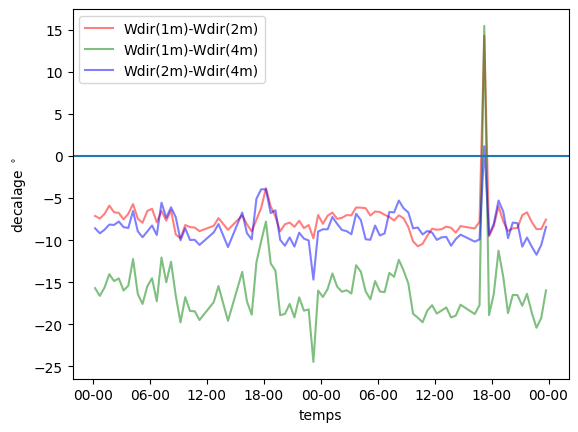

In [9]:
#print(T2_1_K['wind_dir'].values)
WDIR_slope=200
sector=30
masque_wind_dir=(T2_1_2min_moy['wind_dir'] >= (WDIR_slope-sector)) & (T2_1_2min_moy['wind_dir'] <= (WDIR_slope+sector))
T2_dir_K=T2_1_2min_moy.where(masque_wind_dir,drop=True)
print(T2_1_K)
print(T2_dir_K)
#print(T2_dir_K['wind_dir'].values)
date_format=mpl.dates.DateFormatter("%H-%M")
fig=plt.figure()
ax = fig.add_subplot(111)
ax.plot(T2_1_K.coords['temps'].values,T2_1_K['wind_dir'].values-T2_2_K['wind_dir'].values,
        color='r',label="Wdir(1m)-Wdir(2m)",alpha=0.5,)
ax.plot(T2_2_K.coords['temps'].values,T2_1_K['wind_dir'].values-T2_3_K['wind_dir'].values,
        color='g',label="Wdir(1m)-Wdir(4m)",alpha=0.5)
ax.plot(T2_3_K.coords['temps'].values,T2_2_K['wind_dir'].values-T2_3_K['wind_dir'].values,
        color='b',label="Wdir(2m)-Wdir(4m)",alpha=0.5)
#ax.axhline(200+30,color='r')
#ax.axhline(200-30,color='r')
ax.legend()
ax.set_xlabel("temps")
ax.set_ylabel(r"decalage $^\circ$")
#ax.set_ylim(-20,20)
ax.axhline(0)
#plt.xlim(right=np.datetime64('2023-09-01 18:00:00'),left=np.datetime64('2023-09-02 18:00:00'))
#ax.set_ylim(200-30,200+30)
ax.xaxis.set_major_formatter(date_format)

dataset
<xarray.Dataset>
Dimensions:                  (temps: 89, freq: 50)
Coordinates:
  * temps                    (temps) datetime64[ns] 2023-09-06T00:14:00 ... 2...
  * freq                     (freq) float64 nan 0.009766 nan ... 8.105 9.341
Data variables: (12/96)
    daytime                  (temps) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    Tau                      (temps) float64 -0.0471 -0.04498 ... -0.0193
    qc_Tau                   (temps) float64 0.0 0.0 0.0 ... 0.5333 0.0 0.1333
    H                        (temps) float64 -64.9 -65.02 ... -40.41 -43.69
    qc_H                     (temps) float64 0.0 0.0 0.0 ... 0.1333 0.1333
    H_strg                   (temps) float64 0.1248 0.2569 ... -0.1135 -0.2027
    ...                       ...
    f_C_wts_norm             (freq, temps) float64 nan nan ... -0.01983 0.1564
    f_Su                     (freq, temps) float64 nan nan ... 0.01227 0.0113
    f_Sv                     (freq, temps) float64 nan nan ... 0.01627 0.0

C:\Users\evanl\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\evanl\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\evanl\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\evanl\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\evanl\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees

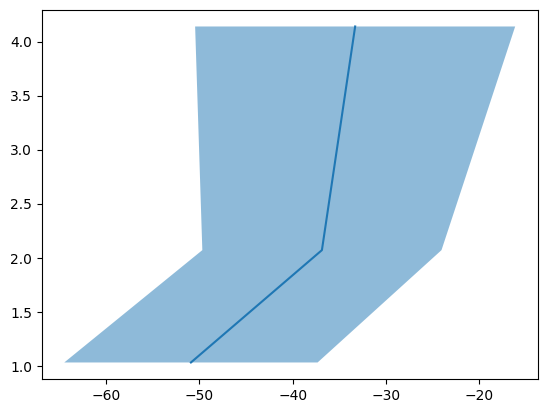

In [10]:
def plot_profil_moy(level_1, level_2,level_3,var=None,**kwargs):
    if (isinstance(level_1, xr.Dataset) and isinstance(level_2, xr.Dataset) and isinstance(level_3, xr.Dataset)):
        print("dataset")
        print(level_1)
        level_1_moy=level_1.mean('temps')
        level_1_std=level_1.std('temps')
        level_2_moy=level_2.mean('temps')
        level_2_std=level_2.std('temps')
        level_3_moy=level_3.mean('temps')
        level_3_std=level_3.std('temps')
    elif (isinstance(level_1, xr.DataArray) and isinstance(level_2, xr.DataArray) and isinstance(level_3, xr.DataArray)):
        level_1_moy=level_1.mean('temps')
        level_1_std=level_1.std('temps')
        level_2_moy=level_2.mean('temps')
        level_2_std=level_2.std('temps')
        level_3_moy=level_3.mean('temps')
        level_3_std=level_3.std('temps')
    else:
        level_1_moy=np.mean(level_1)
        level_1_std=np.std(level_1)
        level_2_moy=np.mean(level_2)
        level_2_std=np.std(level_2)
        level_3_moy=np.mean(level_3)
        level_3_std=np.std(level_3)
    plt.plot([level_1_moy[var],
              level_2_moy[var],
              level_3_moy[var]],
             [level_1_moy['instrument_height'],
              level_2_moy['instrument_height'],
              level_3_moy['instrument_height']], **kwargs)
    plt.fill_betweenx([level_1_moy['instrument_height'],
                       level_2_moy['instrument_height'],
                       level_3_moy['instrument_height']],
                      [level_1_moy[var]+level_1_std[var],
                       level_2_moy[var]+level_2_std[var],
                       level_3_moy[var]+level_3_std[var]],
                      [level_1_moy[var]-level_1_std[var],
                       level_2_moy[var]-level_2_std[var],
                       level_3_moy[var]-level_3_std[var]],
                      alpha=0.5,
                      color=kwargs['color'] if 'color' in kwargs.keys() else None)

plot_profil_moy(T2_1_K, T2_2_K, T2_3_K, 'H')

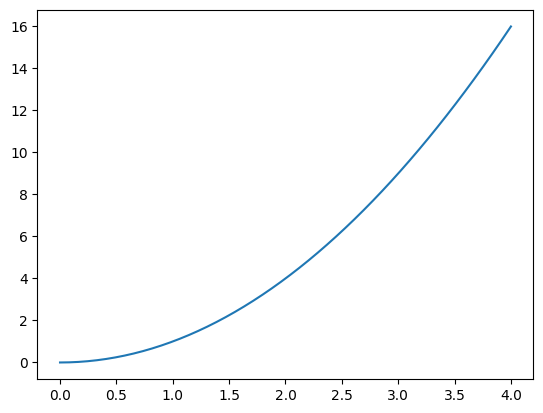

In [11]:
x=np.linspace(0,4)
fig=plt.figure()
plt.plot(x,x**2,color=None)

<xarray.Dataset>
Dimensions:                  (temps: 57, freq: 50)
Coordinates:
  * temps                    (temps) datetime64[ns] 2023-09-06T03:14:00 ... 2...
  * freq                     (freq) float64 nan 0.009766 nan ... 8.105 9.341
Data variables: (12/96)
    daytime                  (temps) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    Tau                      (temps) float64 -0.02896 -0.03652 ... -0.0193
    qc_Tau                   (temps) float64 0.2667 0.1333 1.133 ... 0.0 0.1333
    H                        (temps) float64 -59.6 -60.0 ... -40.41 -43.69
    qc_H                     (temps) float64 0.1333 0.0 0.2667 ... 0.1333 0.1333
    H_strg                   (temps) float64 0.4497 0.2888 ... -0.1135 -0.2027
    ...                       ...
    f_C_wts_norm             (freq, temps) float64 nan nan ... -0.01983 0.1564
    f_Su                     (freq, temps) float64 nan nan ... 0.01227 0.0113
    f_Sv                     (freq, temps) float64 nan nan ... 0.01627 0.01

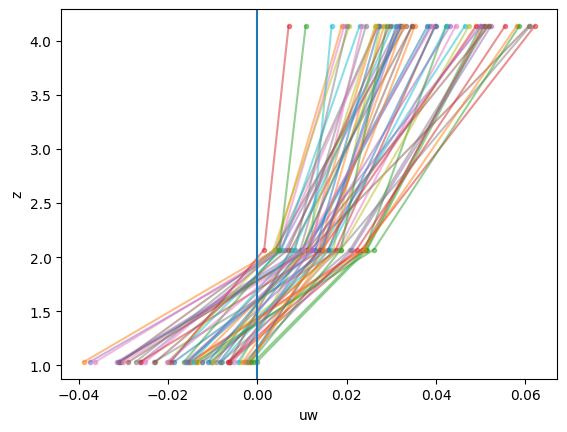

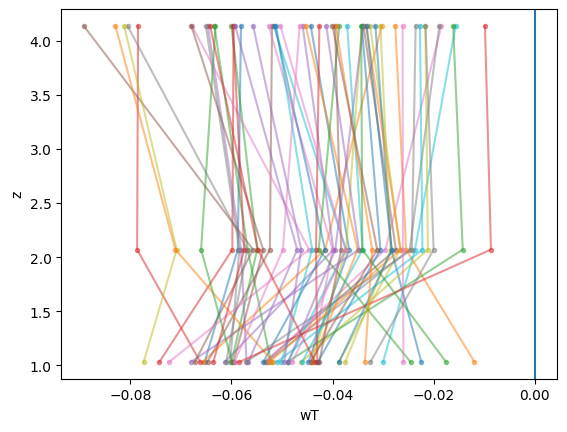

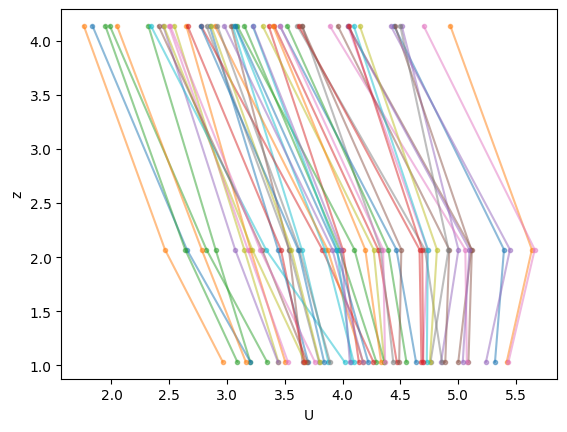

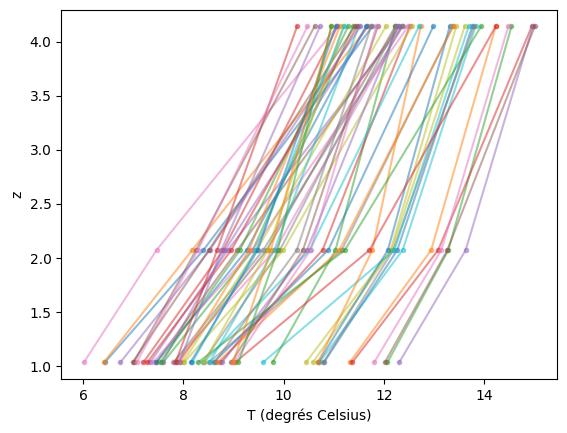

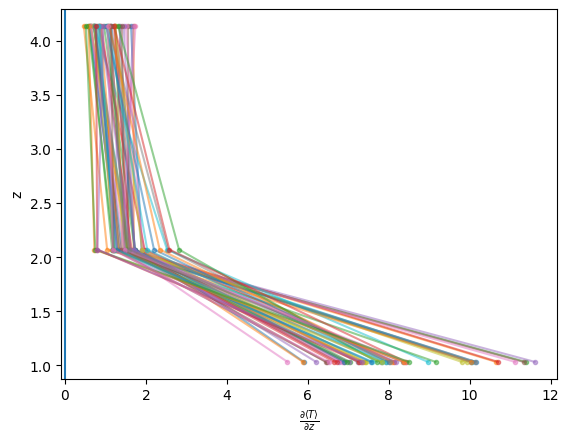

...

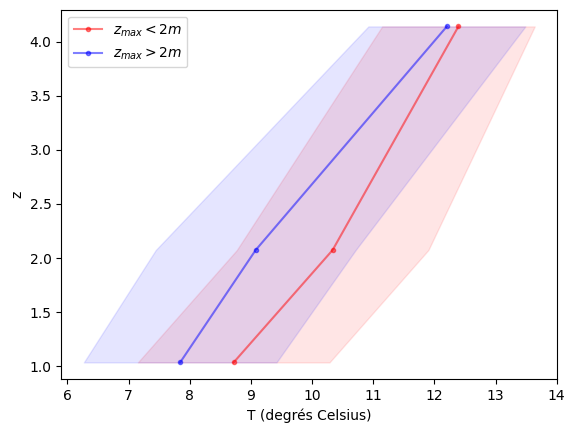

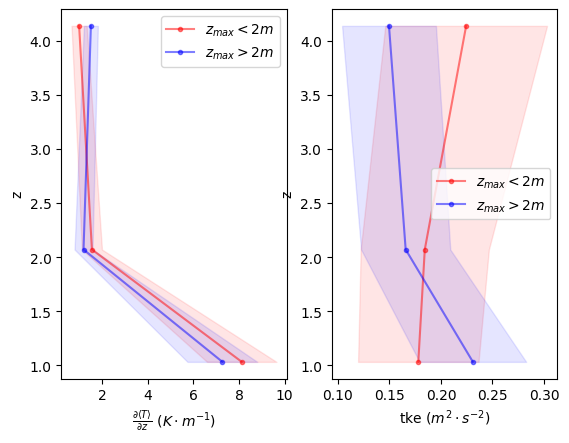

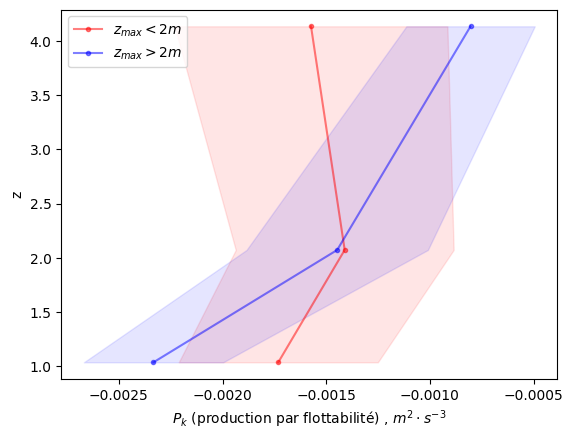

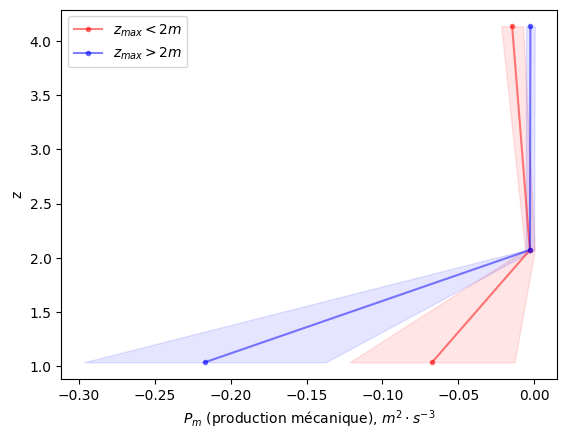

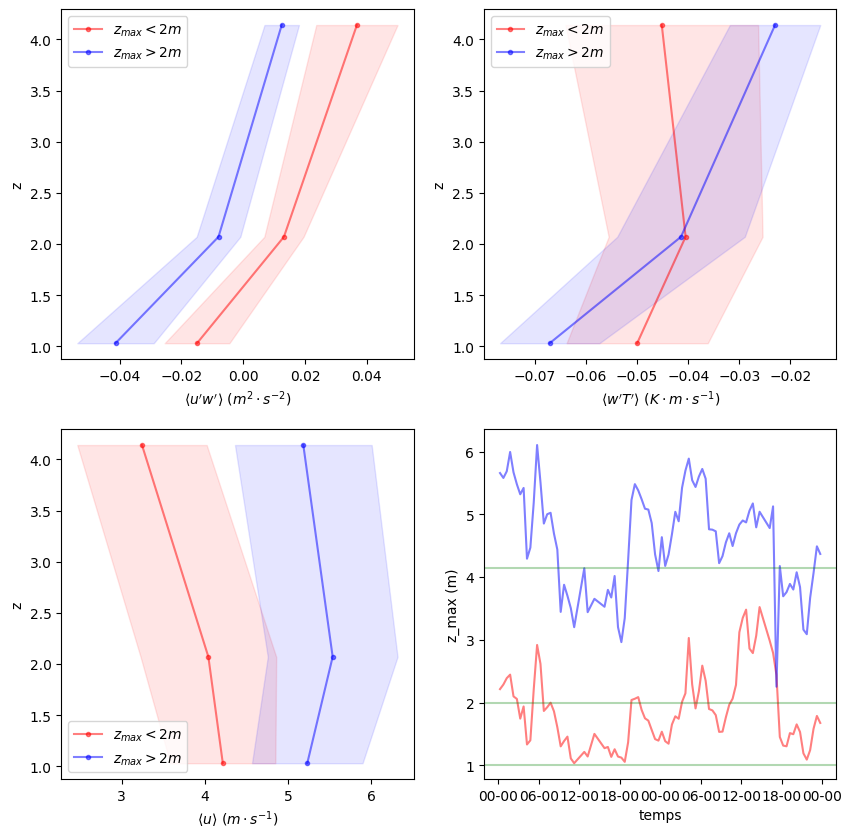

In [12]:
#pour ignorer les warnings (Numpy n'aime pas lorsqu'il y a des NaN !)
import warnings
warnings.filterwarnings('ignore')

g=9.81
#profils pour z_max entre 1 et 2 m
flag_z_max_12=(Ds_z_max['z_max'] <= 2.0) & (Ds_z_max['z_max'] >= 1.0)
T2_1_K_z1=T2_1_K.where(flag_z_max_12,drop=True)
T2_2_K_z1=T2_2_K.where(flag_z_max_12,drop=True)
T2_3_K_z1=T2_3_K.where(flag_z_max_12,drop=True)

#terme de production par flottabilité. On suppose que seul le flux vertical compte
Pk=lambda level:g*level['wts_cov']/level['ts_mean']
#terme de production mécanique
Pm=lambda level,dUdz:level['wu_cov']*dUdz


grad_T_1s_z1=grad_T_1s.where(flag_z_max_12,drop=True)
grad_T_12_z1=grad_T_12.where(flag_z_max_12,drop=True)
grad_T_23_z1=grad_T_23.where(flag_z_max_12,drop=True)

grad_U_1s_z1=grad_U_1s.where(flag_z_max_12,drop=True)
grad_U_12_z1=grad_U_12.where(flag_z_max_12,drop=True)
grad_U_23_z1=grad_U_23.where(flag_z_max_12,drop=True)

Pk_1_z1=Pk(T2_1_K_z1)
Pk_2_z1=Pk(T2_2_K_z1)
Pk_3_z1=Pk(T2_3_K_z1)

Pm_1_z1=Pm(T2_1_K_z1,grad_U_1s_z1)
Pm_2_z1=Pm(T2_2_K_z1,grad_U_12_z1)
Pm_3_z1=Pm(T2_3_K_z1,grad_U_23_z1)

flag_z_max_24=(Ds_z_max['z_max'] <= 4.2) & (Ds_z_max['z_max'] >= 2.0)

T2_1_K_z2=T2_1_K.where(flag_z_max_24,drop=True)
T2_2_K_z2=T2_2_K.where(flag_z_max_24,drop=True)
T2_3_K_z2=T2_3_K.where(flag_z_max_24,drop=True)


grad_T_1s_z2=grad_T_1s.where(flag_z_max_24,drop=True)
grad_T_12_z2=grad_T_12.where(flag_z_max_24,drop=True)
grad_T_23_z2=grad_T_23.where(flag_z_max_24,drop=True)

grad_U_1s_z2=grad_U_1s.where(flag_z_max_24,drop=True)
grad_U_12_z2=grad_U_12.where(flag_z_max_24,drop=True)
grad_U_23_z2=grad_U_23.where(flag_z_max_24,drop=True)

Pk_1_z2=Pk(T2_1_K_z2)
Pk_2_z2=Pk(T2_2_K_z2)
Pk_3_z2=Pk(T2_3_K_z2)

Pm_1_z2=Pm(T2_1_K_z2,grad_U_1s_z2)
Pm_2_z2=Pm(T2_2_K_z2,grad_U_12_z2)
Pm_3_z2=Pm(T2_3_K_z2,grad_U_23_z2)

print(T2_1_K_z1)

fig=plt.figure()
for i in range(0,T2_1_K_z1.coords['temps'].size):
    plt.plot([T2_1_K_z1['wu_cov'].values[i],
              T2_2_K_z1['wu_cov'].values[i],
              T2_3_K_z1['wu_cov'].values[i]],
             [T2_1_K_z1['instrument_height'].values[i],
              T2_2_K_z1['instrument_height'].values[i],
              T2_3_K_z1['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('uw')
plt.ylabel('z')
plt.axvline(0)



fig=plt.figure()
for i in range(0,T2_1_K_z1.coords['temps'].size):
    plt.plot([T2_1_K_z1['wts_cov'].values[i],
              T2_2_K_z1['wts_cov'].values[i],
              T2_3_K_z1['wts_cov'].values[i]],
             [T2_1_K_z1['instrument_height'].values[i],
              T2_2_K_z1['instrument_height'].values[i],
              T2_3_K_z1['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('wT')
plt.ylabel('z')
plt.axvline(0)

fig=plt.figure()
for i in range(0,T2_1_K_z1.coords['temps'].size):
    U_i_1=T2_1_K_z1['u_rot'].values[i]
    U_i_2=T2_2_K_z1['u_rot'].values[i]
    U_i_3=T2_3_K_z1['u_rot'].values[i]
    plt.plot([U_i_1,
              U_i_2,
              U_i_3],
             [T2_1_K_z1['instrument_height'].values[i],
              T2_2_K_z1['instrument_height'].values[i],
              T2_3_K_z1['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('U')
plt.ylabel('z')


fig=plt.figure()
for i in range(0,T2_1_K_z1.coords['temps'].size):
    plt.plot([T2_1_K_z1['air_temperature'].values[i]-273.15,
              T2_2_K_z1['air_temperature'].values[i]-273.15,
              T2_3_K_z1['air_temperature'].values[i]-273.15],
             [T2_1_K_z1['instrument_height'].values[i],
              T2_2_K_z1['instrument_height'].values[i],
              T2_3_K_z1['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('T (degrés Celsius)')
plt.ylabel('z')

fig=plt.figure()
for i in range(0,T2_1_K_z1.coords['temps'].size):
    plt.plot([grad_T_1s_z1.values[i],
              grad_T_12_z1.values[i],
              grad_T_23_z1.values[i]],
             [T2_1_K_z1['instrument_height'].values[i],
              T2_2_K_z1['instrument_height'].values[i],
              T2_3_K_z1['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel(r'$\frac{\partial \langle T\rangle}{\partial z}$')
plt.ylabel('z')
plt.axvline(0)




fig=plt.figure()
for i in range(0,T2_1_K_z1.coords['temps'].size):
    plt.plot([T2_1_K_z1['TKE'].values[i],
              T2_2_K_z1['TKE'].values[i],
              T2_3_K_z1['TKE'].values[i]],
             [T2_1_K_z1['instrument_height'].values[i],
              T2_2_K_z1['instrument_height'].values[i],
              T2_3_K_z1['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('tke')
plt.ylabel('z')

print("PROFILS MOYENS !!!")
T2_1_K_z1_moy=T2_1_K_z1.mean('temps')
T2_2_K_z1_moy=T2_2_K_z1.mean('temps')
T2_3_K_z1_moy=T2_3_K_z1.mean('temps')

T2_1_K_z2_moy=T2_1_K_z2.mean('temps')
T2_2_K_z2_moy=T2_2_K_z2.mean('temps')
T2_3_K_z2_moy=T2_3_K_z2.mean('temps')

grad_T_1s_z1_moy=grad_T_1s_z1.mean('temps')
grad_T_12_z1_moy=grad_T_12_z1.mean('temps')
grad_T_23_z1_moy=grad_T_23_z1.mean('temps')

grad_T_1s_z2_moy=grad_T_1s_z2.mean('temps')
grad_T_12_z2_moy=grad_T_12_z2.mean('temps')
grad_T_23_z2_moy=grad_T_23_z2.mean('temps')

T2_1_K_z1_std=T2_1_K_z1.std('temps')
T2_2_K_z1_std=T2_2_K_z1.std('temps')
T2_3_K_z1_std=T2_3_K_z1.std('temps')

T2_1_K_z2_std=T2_1_K_z2.std('temps')
T2_2_K_z2_std=T2_2_K_z2.std('temps')
T2_3_K_z2_std=T2_3_K_z2.std('temps')

grad_T_1s_z1_std=grad_T_1s_z1.std('temps')
grad_T_12_z1_std=grad_T_12_z1.std('temps')
grad_T_23_z1_std=grad_T_23_z1.std('temps')

grad_T_1s_z2_std=grad_T_1s_z2.std('temps')
grad_T_12_z2_std=grad_T_12_z2.std('temps')
grad_T_23_z2_std=grad_T_23_z2.std('temps')

Pk_1_z1_moy=Pk_1_z1.mean('temps')
Pk_2_z1_moy=Pk_2_z1.mean('temps')
Pk_3_z1_moy=Pk_3_z1.mean('temps')

Pm_1_z1_moy=Pm_1_z1.mean('temps')
Pm_2_z1_moy=Pm_2_z1.mean('temps')
Pm_3_z1_moy=Pm_3_z1.mean('temps')

Pk_1_z1_std=Pk_1_z1.std('temps')
Pk_2_z1_std=Pk_2_z1.std('temps')
Pk_3_z1_std=Pk_3_z1.std('temps')

Pm_1_z1_std=Pm_1_z1.std('temps')
Pm_2_z1_std=Pm_2_z1.std('temps')
Pm_3_z1_std=Pm_3_z1.std('temps')

Pk_1_z2_moy=Pk_1_z2.mean('temps')
Pk_2_z2_moy=Pk_2_z2.mean('temps')
Pk_3_z2_moy=Pk_3_z2.mean('temps')

Pm_1_z2_moy=Pm_1_z2.mean('temps')
Pm_2_z2_moy=Pm_2_z2.mean('temps')
Pm_3_z2_moy=Pm_3_z2.mean('temps')

Pk_1_z2_std=Pk_1_z2.std('temps')
Pk_2_z2_std=Pk_2_z2.std('temps')
Pk_3_z2_std=Pk_3_z2.std('temps')

Pm_1_z2_std=Pm_1_z2.std('temps')
Pm_2_z2_std=Pm_2_z2.std('temps')
Pm_3_z2_std=Pm_3_z2.std('temps')


fig=plt.figure()
plt.plot([T2_1_K_z1_moy['wu_cov'],
          T2_2_K_z1_moy['wu_cov'],
          T2_3_K_z1_moy['wu_cov']],
         [T2_1_K_z1_moy['instrument_height'],
          T2_2_K_z1_moy['instrument_height'],
          T2_3_K_z1_moy['instrument_height']],alpha=0.5,marker='.',label=r"$z_{max} < 2m$",color='r')
plt.fill_betweenx([T2_1_K_z1_moy['instrument_height'],
                  T2_2_K_z1_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z1_moy['wu_cov']+T2_1_K_z1_std['wu_cov'],
                  T2_2_K_z1_moy['wu_cov']+T2_2_K_z1_std['wu_cov'],
                  T2_3_K_z1_moy['wu_cov']+T2_3_K_z1_std['wu_cov']],
                  [T2_1_K_z1_moy['wu_cov']-T2_1_K_z1_std['wu_cov'],
                  T2_2_K_z1_moy['wu_cov']-T2_2_K_z1_std['wu_cov'],
                  T2_3_K_z1_moy['wu_cov']-T2_3_K_z1_std['wu_cov']]
                  ,alpha=0.1,color='r')

plt.plot([T2_1_K_z2_moy['wu_cov'],
          T2_2_K_z2_moy['wu_cov'],
          T2_3_K_z2_moy['wu_cov']],
         [T2_1_K_z2_moy['instrument_height'],
          T2_2_K_z2_moy['instrument_height'],
          T2_3_K_z2_moy['instrument_height']],alpha=0.5,marker='.',label=r"$z_{max} > 2m$",color='b')
plt.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z2_moy['instrument_height']],
                  [T2_1_K_z2_moy['wu_cov']+T2_1_K_z2_std['wu_cov'],
                  T2_2_K_z2_moy['wu_cov']+T2_2_K_z2_std['wu_cov'],
                  T2_3_K_z2_moy['wu_cov']+T2_3_K_z2_std['wu_cov']],
                  [T2_1_K_z2_moy['wu_cov']-T2_1_K_z2_std['wu_cov'],
                  T2_2_K_z2_moy['wu_cov']-T2_2_K_z2_std['wu_cov'],
                  T2_3_K_z2_moy['wu_cov']-T2_3_K_z2_std['wu_cov']]
                  ,alpha=0.1,color='b')

plt.xlabel(r"$\langle u'w' \rangle$ ($m^2\cdot s^{-2}$)")
plt.ylabel('z')
plt.legend()
plt.savefig(repertoire_figures+'profil_wu_moy.png')

fig=plt.figure()
plt.plot([T2_1_K_z1_moy['wts_cov'].values,
          T2_2_K_z1_moy['wts_cov'].values,
          T2_3_K_z1_moy['wts_cov'].values],
         [T2_1_K_z1_moy['instrument_height'].values,
          T2_2_K_z1_moy['instrument_height'].values,
          T2_3_K_z1_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} < 2m$",color='r')
plt.plot([T2_1_K_z2_moy['wts_cov'].values,
          T2_2_K_z2_moy['wts_cov'].values,
          T2_3_K_z2_moy['wts_cov'].values],
         [T2_1_K_z2_moy['instrument_height'].values,
          T2_2_K_z2_moy['instrument_height'].values,
          T2_3_K_z2_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} > 2m$",color='b')

plt.fill_betweenx([T2_1_K_z1_moy['instrument_height'],
                  T2_2_K_z1_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z1_moy['wts_cov']+T2_1_K_z1_std['wts_cov'],
                  T2_2_K_z1_moy['wts_cov']+T2_2_K_z1_std['wts_cov'],
                  T2_3_K_z1_moy['wts_cov']+T2_3_K_z1_std['wts_cov']],
                  [T2_1_K_z1_moy['wts_cov']-T2_1_K_z1_std['wts_cov'],
                  T2_2_K_z1_moy['wts_cov']-T2_2_K_z1_std['wts_cov'],
                  T2_3_K_z1_moy['wts_cov']-T2_3_K_z1_std['wts_cov']]
                  ,alpha=0.1,color='r')

plt.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z2_moy['wts_cov']+T2_1_K_z2_std['wts_cov'],
                  T2_2_K_z2_moy['wts_cov']+T2_2_K_z2_std['wts_cov'],
                  T2_3_K_z2_moy['wts_cov']+T2_3_K_z2_std['wts_cov']],
                  [T2_1_K_z2_moy['wts_cov']-T2_1_K_z2_std['wts_cov'],
                  T2_2_K_z2_moy['wts_cov']-T2_2_K_z2_std['wts_cov'],
                  T2_3_K_z2_moy['wts_cov']-T2_3_K_z2_std['wts_cov']]
                  ,alpha=0.1,color='b')

plt.xlabel(r"$\langle w'T' \rangle$ ($K\cdot m \cdot s^{-1}$)")
plt.ylabel('z')
plt.legend()
plt.savefig(repertoire_figures+'profil_wT_moy.png')

fig=plt.figure()
plt.plot([T2_1_K_z1_moy['H'].values,
          T2_2_K_z1_moy['H'].values,
          T2_3_K_z1_moy['H'].values],
         [T2_1_K_z1_moy['instrument_height'].values,
          T2_2_K_z1_moy['instrument_height'].values,
          T2_3_K_z1_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} < 2m$",color='r')
plt.plot([T2_1_K_z2_moy['H'].values,
          T2_2_K_z2_moy['H'].values,
          T2_3_K_z2_moy['H'].values],
         [T2_1_K_z2_moy['instrument_height'].values,
          T2_2_K_z2_moy['instrument_height'].values,
          T2_3_K_z2_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} > 2m$",color='b')

plt.fill_betweenx([T2_1_K_z1_moy['instrument_height'],
                  T2_2_K_z1_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z1_moy['H']+T2_1_K_z1_std['H'],
                  T2_2_K_z1_moy['H']+T2_2_K_z1_std['H'],
                  T2_3_K_z1_moy['H']+T2_3_K_z1_std['H']],
                  [T2_1_K_z1_moy['H']-T2_1_K_z1_std['H'],
                  T2_2_K_z1_moy['H']-T2_2_K_z1_std['H'],
                  T2_3_K_z1_moy['H']-T2_3_K_z1_std['H']]
                  ,alpha=0.1,color='r')

plt.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z2_moy['H']+T2_1_K_z2_std['H'],
                  T2_2_K_z2_moy['H']+T2_2_K_z2_std['H'],
                  T2_3_K_z2_moy['H']+T2_3_K_z2_std['H']],
                  [T2_1_K_z2_moy['H']-T2_1_K_z2_std['H'],
                  T2_2_K_z2_moy['H']-T2_2_K_z2_std['H'],
                  T2_3_K_z2_moy['H']-T2_3_K_z2_std['H']]
                  ,alpha=0.1,color='b')

plt.xlabel(r"H ($W\cdot m^{-2}$)")
plt.ylabel('z')
plt.legend()
plt.savefig(repertoire_figures+'profil_H_moy.png')


fig=plt.figure()
U_i_1=T2_1_K_z1_moy['u_rot'].values
U_i_2=T2_2_K_z1_moy['u_rot'].values
U_i_3=T2_3_K_z1_moy['u_rot'].values
plt.plot([U_i_1,
          U_i_2,
          U_i_3],
         [T2_1_K_z1_moy['instrument_height'].values,
          T2_2_K_z1_moy['instrument_height'].values,
          T2_3_K_z1_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} < 2m$",color='r')
plt.plot([T2_1_K_z2_moy['u_rot'].values,
          T2_2_K_z2_moy['u_rot'].values,
          T2_3_K_z2_moy['u_rot'].values],
         [T2_1_K_z2_moy['instrument_height'].values,
          T2_2_K_z2_moy['instrument_height'].values,
          T2_3_K_z2_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} > 2m$",color='b')
plt.fill_betweenx([T2_1_K_z1_moy['instrument_height'],
                  T2_2_K_z1_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z1_moy['u_rot']+T2_1_K_z1_std['u_rot'],
                  T2_2_K_z1_moy['u_rot']+T2_2_K_z1_std['u_rot'],
                  T2_3_K_z1_moy['u_rot']+T2_3_K_z1_std['u_rot']],
                  [T2_1_K_z1_moy['u_rot']-T2_1_K_z1_std['u_rot'],
                  T2_2_K_z1_moy['u_rot']-T2_2_K_z1_std['u_rot'],
                  T2_3_K_z1_moy['u_rot']-T2_3_K_z1_std['u_rot']]
                  ,alpha=0.1,color='r')

plt.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z2_moy['u_rot']+T2_1_K_z2_std['u_rot'],
                  T2_2_K_z2_moy['u_rot']+T2_2_K_z2_std['u_rot'],
                  T2_3_K_z2_moy['u_rot']+T2_3_K_z2_std['u_rot']],
                  [T2_1_K_z2_moy['u_rot']-T2_1_K_z2_std['u_rot'],
                  T2_2_K_z2_moy['u_rot']-T2_2_K_z2_std['u_rot'],
                  T2_3_K_z2_moy['u_rot']-T2_3_K_z2_std['u_rot']]
                  ,alpha=0.1,color='b')



plt.xlabel(r'$\langle u \rangle$ ($m\cdot s^{-1}$)')
plt.ylabel('z')
plt.legend()
plt.savefig(repertoire_figures+'profil_U_moy.png')


fig=plt.figure()
plt.plot([T2_1_K_z1_moy['air_temperature'].values-273.15,
          T2_2_K_z1_moy['air_temperature'].values-273.15,
          T2_3_K_z1_moy['air_temperature'].values-273.15],
         [T2_1_K_z1_moy['instrument_height'].values,
          T2_2_K_z1_moy['instrument_height'].values,
          T2_3_K_z1_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} < 2m$",color='r')
plt.plot([T2_1_K_z2_moy['air_temperature'].values-273.15,
          T2_2_K_z2_moy['air_temperature'].values-273.15,
          T2_3_K_z2_moy['air_temperature'].values-273.15],
         [T2_1_K_z2_moy['instrument_height'].values,
          T2_2_K_z2_moy['instrument_height'].values,
          T2_3_K_z2_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} > 2m$",color='b')
plt.fill_betweenx([T2_1_K_z1_moy['instrument_height'],
                  T2_2_K_z1_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z1_moy['air_temperature']+T2_1_K_z1_std['air_temperature']-273.15,
                  T2_2_K_z1_moy['air_temperature']+T2_2_K_z1_std['air_temperature']-273.15,
                  T2_3_K_z1_moy['air_temperature']+T2_3_K_z1_std['air_temperature']-273.15],
                  [T2_1_K_z1_moy['air_temperature']-T2_1_K_z1_std['air_temperature']-273.15,
                  T2_2_K_z1_moy['air_temperature']-T2_2_K_z1_std['air_temperature']-273.15,
                  T2_3_K_z1_moy['air_temperature']-T2_3_K_z1_std['air_temperature']-273.15]
                  ,alpha=0.1,color='r')

plt.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z2_moy['air_temperature']+T2_1_K_z2_std['air_temperature']-273.15,
                  T2_2_K_z2_moy['air_temperature']+T2_2_K_z2_std['air_temperature']-273.15,
                  T2_3_K_z2_moy['air_temperature']+T2_3_K_z2_std['air_temperature']-273.15],
                  [T2_1_K_z2_moy['air_temperature']-T2_1_K_z2_std['air_temperature']-273.15,
                  T2_2_K_z2_moy['air_temperature']-T2_2_K_z2_std['air_temperature']-273.15,
                  T2_3_K_z2_moy['air_temperature']-T2_3_K_z2_std['air_temperature']-273.15]
                  ,alpha=0.1,color='b')

plt.xlabel('T (degrés Celsius)')
plt.ylabel('z')
plt.legend()
plt.savefig(repertoire_figures+'profil_T_moy.png')



fig=plt.figure()
ax=fig.add_subplot(121)
ax.plot([grad_T_1s_z1_moy.values,
          grad_T_12_z1_moy.values,
          grad_T_23_z1_moy.values],
         [T2_1_K_z1_moy['instrument_height'],
          T2_2_K_z1_moy['instrument_height'],
          T2_3_K_z1_moy['instrument_height']],alpha=0.5,marker='.',label=r"$z_{max} < 2m$",color='r')
ax.plot([grad_T_1s_z2_moy.values,
          grad_T_12_z2_moy.values,
          grad_T_23_z2_moy.values],
         [T2_1_K_z2_moy['instrument_height'],
          T2_2_K_z2_moy['instrument_height'],
          T2_3_K_z2_moy['instrument_height']],alpha=0.5,marker='.',label=r"$z_{max} > 2m$",color='b')
ax.fill_betweenx([T2_1_K_z1_moy['instrument_height'],
                  T2_2_K_z1_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [grad_T_1s_z1_moy.values+grad_T_1s_z1_std.values,
                  grad_T_12_z1_moy.values+grad_T_12_z1_std.values,
                  grad_T_23_z1_moy.values+grad_T_23_z1_std.values],
                  [grad_T_1s_z1_moy.values-grad_T_1s_z1_std.values,
                  grad_T_12_z1_moy.values-grad_T_12_z1_std.values,
                  grad_T_23_z1_moy.values-grad_T_23_z1_std.values]
                  ,alpha=0.1,color='r')

ax.fill_betweenx([T2_1_K_z1_moy['instrument_height'],
                  T2_2_K_z1_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [grad_T_1s_z2_moy.values+grad_T_1s_z2_std.values,
                  grad_T_12_z2_moy.values+grad_T_12_z2_std.values,
                  grad_T_23_z2_moy.values+grad_T_23_z2_std.values],
                  [grad_T_1s_z2_moy.values-grad_T_1s_z2_std.values,
                  grad_T_12_z2_moy.values-grad_T_12_z2_std.values,
                  grad_T_23_z2_moy.values-grad_T_23_z2_std.values]
                  ,alpha=0.1,color='b')

ax.set_xlabel(r'$\frac{\partial \langle T\rangle}{\partial z}$ ($K\cdot m^{-1}$)')
ax.set_ylabel('z')
ax.legend()
#plt.savefig(repertoire_figures+'profil_dTdz_moy.png')

ax2=fig.add_subplot(122)

#fig=plt.figure()
ax2.plot([T2_1_K_z1_moy['TKE'].values,
          T2_2_K_z1_moy['TKE'].values,
          T2_3_K_z1_moy['TKE'].values],
         [T2_1_K_z1_moy['instrument_height'].values,
          T2_2_K_z1_moy['instrument_height'].values,
          T2_3_K_z1_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} < 2m$",color='r')
ax2.plot([T2_1_K_z2_moy['TKE'].values,
          T2_2_K_z2_moy['TKE'].values,
          T2_3_K_z2_moy['TKE'].values],
         [T2_1_K_z2_moy['instrument_height'].values,
          T2_2_K_z2_moy['instrument_height'].values,
          T2_3_K_z2_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} > 2m$",color='b')
ax2.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z2_moy['instrument_height']],
                  [T2_1_K_z1_moy['TKE']+T2_1_K_z1_std['TKE'],
                  T2_2_K_z1_moy['TKE']+T2_2_K_z1_std['TKE'],
                  T2_3_K_z1_moy['TKE']+T2_3_K_z1_std['TKE']],
                  [T2_1_K_z1_moy['TKE']-T2_1_K_z1_std['TKE'],
                  T2_2_K_z1_moy['TKE']-T2_2_K_z1_std['TKE'],
                  T2_3_K_z1_moy['TKE']-T2_3_K_z1_std['TKE']]
                  ,alpha=0.1,color='r')
ax2.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z2_moy['instrument_height']],
                  [T2_1_K_z2_moy['TKE']+T2_1_K_z2_std['TKE'],
                  T2_2_K_z2_moy['TKE']+T2_2_K_z2_std['TKE'],
                  T2_3_K_z2_moy['TKE']+T2_3_K_z2_std['TKE']],
                  [T2_1_K_z2_moy['TKE']-T2_1_K_z2_std['TKE'],
                  T2_2_K_z2_moy['TKE']-T2_2_K_z2_std['TKE'],
                  T2_3_K_z2_moy['TKE']-T2_3_K_z2_std['TKE']]
                  ,alpha=0.1,color='b')

ax2.set_xlabel(r'tke ($m^2\cdot s^{-2}$)')
ax2.set_ylabel('z')
ax2.legend()
plt.savefig(repertoire_figures+'profil_TKE_dTdz_moy.png')

fig=plt.figure()
plt.plot([Pk_1_z1_moy,
          Pk_2_z1_moy,
          Pk_3_z1_moy],
         [T2_1_K_z1_moy['instrument_height'].values,
          T2_2_K_z1_moy['instrument_height'].values,
          T2_3_K_z1_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} < 2m$",color='r')
plt.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z2_moy['instrument_height']],
                  [Pk_1_z1_moy+Pk_1_z1_std,
                  Pk_2_z1_moy+Pk_2_z1_std,
                  Pk_3_z1_moy+Pk_3_z1_std],
                  [Pk_1_z1_moy-Pk_1_z1_std,
                  Pk_2_z1_moy-Pk_2_z1_std,
                  Pk_3_z1_moy-Pk_3_z1_std]
                  ,alpha=0.1,color='r')
plt.plot([Pk_1_z2_moy,
          Pk_2_z2_moy,
          Pk_3_z2_moy],
         [T2_1_K_z2_moy['instrument_height'].values,
          T2_2_K_z2_moy['instrument_height'].values,
          T2_3_K_z2_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} > 2m$",color='b')
plt.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z2_moy['instrument_height']],
                  [Pk_1_z2_moy+Pk_1_z2_std,
                  Pk_2_z2_moy+Pk_2_z2_std,
                  Pk_3_z2_moy+Pk_3_z2_std],
                  [Pk_1_z2_moy-Pk_1_z2_std,
                  Pk_2_z2_moy-Pk_2_z2_std,
                  Pk_3_z2_moy-Pk_3_z2_std]
                  ,alpha=0.1,color='b')

plt.xlabel(r'$P_k$ (production par flottabilité) , ${m}^2\cdot s^{-3}$')
plt.ylabel('z')
plt.legend()
plt.savefig(repertoire_figures+'profil_Pk_moy.png')

fig=plt.figure()
plt.plot([Pm_1_z1_moy,
          Pm_2_z1_moy,
          Pm_3_z1_moy],
         [T2_1_K_z1_moy['instrument_height'].values,
          T2_2_K_z1_moy['instrument_height'].values,
          T2_3_K_z1_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} < 2m$",color='r')
plt.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z2_moy['instrument_height']],
                  [Pm_1_z1_moy+Pm_1_z1_std,
                  Pm_2_z1_moy+Pm_2_z1_std,
                  Pm_3_z1_moy+Pm_3_z1_std],
                  [Pm_1_z1_moy-Pm_1_z1_std,
                  Pm_2_z1_moy-Pm_2_z1_std,
                  Pm_3_z1_moy-Pm_3_z1_std]
                  ,alpha=0.1,color='r')

plt.plot([Pm_1_z2_moy,
          Pm_2_z2_moy,
          Pm_3_z2_moy],
         [T2_1_K_z2_moy['instrument_height'].values,
          T2_2_K_z2_moy['instrument_height'].values,
          T2_3_K_z2_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} > 2m$",color='b')
plt.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z2_moy['instrument_height']],
                  [Pm_1_z2_moy+Pm_1_z2_std,
                  Pm_2_z2_moy+Pm_2_z2_std,
                  Pm_3_z2_moy+Pm_3_z2_std],
                  [Pm_1_z2_moy-Pm_1_z2_std,
                  Pm_2_z2_moy-Pm_2_z2_std,
                  Pm_3_z2_moy-Pm_3_z2_std]
                  ,alpha=0.1,color='b')
plt.xlabel(r'$P_m$ (production mécanique), ${m}^2\cdot s^{-3}$')
plt.ylabel('z')
plt.legend()
plt.savefig(repertoire_figures+'profil_Pm_moy.png')


fig=plt.figure(figsize=(10,10))
ax1=fig.add_subplot(221)
plt.plot([T2_1_K_z1_moy['wu_cov'],
          T2_2_K_z1_moy['wu_cov'],
          T2_3_K_z1_moy['wu_cov']],
         [T2_1_K_z1_moy['instrument_height'],
          T2_2_K_z1_moy['instrument_height'],
          T2_3_K_z1_moy['instrument_height']],alpha=0.5,marker='.',label=r"$z_{max} < 2m$",color='r')
plt.fill_betweenx([T2_1_K_z1_moy['instrument_height'],
                  T2_2_K_z1_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z1_moy['wu_cov']+T2_1_K_z1_std['wu_cov'],
                  T2_2_K_z1_moy['wu_cov']+T2_2_K_z1_std['wu_cov'],
                  T2_3_K_z1_moy['wu_cov']+T2_3_K_z1_std['wu_cov']],
                  [T2_1_K_z1_moy['wu_cov']-T2_1_K_z1_std['wu_cov'],
                  T2_2_K_z1_moy['wu_cov']-T2_2_K_z1_std['wu_cov'],
                  T2_3_K_z1_moy['wu_cov']-T2_3_K_z1_std['wu_cov']]
                  ,alpha=0.1,color='r')

plt.plot([T2_1_K_z2_moy['wu_cov'],
          T2_2_K_z2_moy['wu_cov'],
          T2_3_K_z2_moy['wu_cov']],
         [T2_1_K_z2_moy['instrument_height'],
          T2_2_K_z2_moy['instrument_height'],
          T2_3_K_z2_moy['instrument_height']],alpha=0.5,marker='.',label=r"$z_{max} > 2m$",color='b')
plt.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z2_moy['instrument_height']],
                  [T2_1_K_z2_moy['wu_cov']+T2_1_K_z2_std['wu_cov'],
                  T2_2_K_z2_moy['wu_cov']+T2_2_K_z2_std['wu_cov'],
                  T2_3_K_z2_moy['wu_cov']+T2_3_K_z2_std['wu_cov']],
                  [T2_1_K_z2_moy['wu_cov']-T2_1_K_z2_std['wu_cov'],
                  T2_2_K_z2_moy['wu_cov']-T2_2_K_z2_std['wu_cov'],
                  T2_3_K_z2_moy['wu_cov']-T2_3_K_z2_std['wu_cov']]
                  ,alpha=0.1,color='b')

plt.xlabel(r"$\langle u'w' \rangle$ ($m^2\cdot s^{-2}$)")
plt.ylabel('z')
plt.legend()


ax2=fig.add_subplot(222)
plt.plot([T2_1_K_z1_moy['wts_cov'].values,
          T2_2_K_z1_moy['wts_cov'].values,
          T2_3_K_z1_moy['wts_cov'].values],
         [T2_1_K_z1_moy['instrument_height'].values,
          T2_2_K_z1_moy['instrument_height'].values,
          T2_3_K_z1_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} < 2m$",color='r')
plt.plot([T2_1_K_z2_moy['wts_cov'].values,
          T2_2_K_z2_moy['wts_cov'].values,
          T2_3_K_z2_moy['wts_cov'].values],
         [T2_1_K_z2_moy['instrument_height'].values,
          T2_2_K_z2_moy['instrument_height'].values,
          T2_3_K_z2_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} > 2m$",color='b')

plt.fill_betweenx([T2_1_K_z1_moy['instrument_height'],
                  T2_2_K_z1_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z1_moy['wts_cov']+T2_1_K_z1_std['wts_cov'],
                  T2_2_K_z1_moy['wts_cov']+T2_2_K_z1_std['wts_cov'],
                  T2_3_K_z1_moy['wts_cov']+T2_3_K_z1_std['wts_cov']],
                  [T2_1_K_z1_moy['wts_cov']-T2_1_K_z1_std['wts_cov'],
                  T2_2_K_z1_moy['wts_cov']-T2_2_K_z1_std['wts_cov'],
                  T2_3_K_z1_moy['wts_cov']-T2_3_K_z1_std['wts_cov']]
                  ,alpha=0.1,color='r')

plt.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z2_moy['wts_cov']+T2_1_K_z2_std['wts_cov'],
                  T2_2_K_z2_moy['wts_cov']+T2_2_K_z2_std['wts_cov'],
                  T2_3_K_z2_moy['wts_cov']+T2_3_K_z2_std['wts_cov']],
                  [T2_1_K_z2_moy['wts_cov']-T2_1_K_z2_std['wts_cov'],
                  T2_2_K_z2_moy['wts_cov']-T2_2_K_z2_std['wts_cov'],
                  T2_3_K_z2_moy['wts_cov']-T2_3_K_z2_std['wts_cov']]
                  ,alpha=0.1,color='b')

plt.xlabel(r"$\langle w'T' \rangle$ ($K\cdot m \cdot s^{-1}$)")
plt.ylabel('z')
plt.legend()
ax3=fig.add_subplot(223)
plt.plot([T2_1_K_z1_moy['u_rot'].values,
          T2_2_K_z1_moy['u_rot'].values,
          T2_3_K_z1_moy['u_rot'].values],
         [T2_1_K_z1_moy['instrument_height'].values,
          T2_2_K_z1_moy['instrument_height'].values,
          T2_3_K_z1_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} < 2m$",color='r')
plt.plot([T2_1_K_z2_moy['u_rot'].values,
          T2_2_K_z2_moy['u_rot'].values,
          T2_3_K_z2_moy['u_rot'].values],
         [T2_1_K_z2_moy['instrument_height'].values,
          T2_2_K_z2_moy['instrument_height'].values,
          T2_3_K_z2_moy['instrument_height'].values],alpha=0.5,marker='.',label=r"$z_{max} > 2m$",color='b')

plt.fill_betweenx([T2_1_K_z1_moy['instrument_height'],
                  T2_2_K_z1_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z1_moy['u_rot']+T2_1_K_z1_std['u_rot'],
                  T2_2_K_z1_moy['u_rot']+T2_2_K_z1_std['u_rot'],
                  T2_3_K_z1_moy['u_rot']+T2_3_K_z1_std['u_rot']],
                  [T2_1_K_z1_moy['u_rot']-T2_1_K_z1_std['u_rot'],
                  T2_2_K_z1_moy['u_rot']-T2_2_K_z1_std['u_rot'],
                  T2_3_K_z1_moy['u_rot']-T2_3_K_z1_std['u_rot']]
                  ,alpha=0.1,color='r')

plt.fill_betweenx([T2_1_K_z2_moy['instrument_height'],
                  T2_2_K_z2_moy['instrument_height'],
                  T2_3_K_z1_moy['instrument_height']],
                  [T2_1_K_z2_moy['u_rot']+T2_1_K_z2_std['u_rot'],
                  T2_2_K_z2_moy['u_rot']+T2_2_K_z2_std['u_rot'],
                  T2_3_K_z2_moy['u_rot']+T2_3_K_z2_std['u_rot']],
                  [T2_1_K_z2_moy['u_rot']-T2_1_K_z2_std['u_rot'],
                  T2_2_K_z2_moy['u_rot']-T2_2_K_z2_std['u_rot'],
                  T2_3_K_z2_moy['u_rot']-T2_3_K_z2_std['u_rot']]
                  ,alpha=0.1,color='b')

plt.xlabel(r"$\langle u \rangle$ ($ m \cdot s^{-1}$)")
plt.ylabel('z')
plt.legend()
ax4=fig.add_subplot(224)
z_max=Ds_z_max_poly['z_max'].values
ax4.plot(Ds_z_max_poly.coords['temps'].values,z_max,
         color='r',label='z_max',alpha=0.5)
ax4.plot(T2_1_K.coords['temps'].values,T2_1_K['wind_speed'].values,color='b', label='vitesse du vent H= 1 m',alpha=0.5)
ax4.xaxis.set_major_formatter(date_format)
ax4.set_xlabel("temps")
ax4.set_ylabel(r"z_max (m)")
ax4.axhline(1.0,color='g',alpha=0.3)
ax4.axhline(2.0,color='g',alpha=0.3)
ax4.axhline(4.14,color='g',alpha=0.3)
plt.savefig(repertoire_figures+r"profils_moy_grid.png")

In [13]:
print(Pm_1_z1)
print(Pm_1_z2)

<xarray.DataArray (temps: 57)>
array([-0.16014788, -0.20426197, -0.05126964, -0.06522236, -0.12260397,
       -0.14826322, -0.11402354, -0.06598853, -0.01289826, -0.02995012,
       -0.03032494, -0.00455206, -0.00029914, -0.02448295, -0.00943813,
       -0.0221163 , -0.02207172, -0.0300196 , -0.00848919, -0.01675465,
       -0.00621566, -0.00517008, -0.00237227, -0.04231135, -0.19074481,
       -0.15289501, -0.14789868, -0.10885006, -0.05642764, -0.04106792,
       -0.08384785, -0.05972534, -0.05796423, -0.11897558, -0.15356787,
       -0.13687152, -0.19114347, -0.12578022, -0.09203223, -0.09062142,
       -0.06418745, -0.05808284, -0.07263291, -0.08822362, -0.05048636,
       -0.02200329, -0.01927108, -0.03481885, -0.03770485, -0.05718351,
       -0.04100018, -0.00987919, -0.00436343, -0.02337891, -0.06332742,
       -0.09953998, -0.08550955])
Coordinates:
  * temps    (temps) datetime64[ns] 2023-09-06T03:14:00 ... 2023-09-07T23:44:00
<xarray.DataArray (temps: 32)>
array([-0.276794  ,

appel wT
zt 0.0001
appel u_s()
z0 0.001
appel u_s()
z0 0.001


(0.0, 2.0)

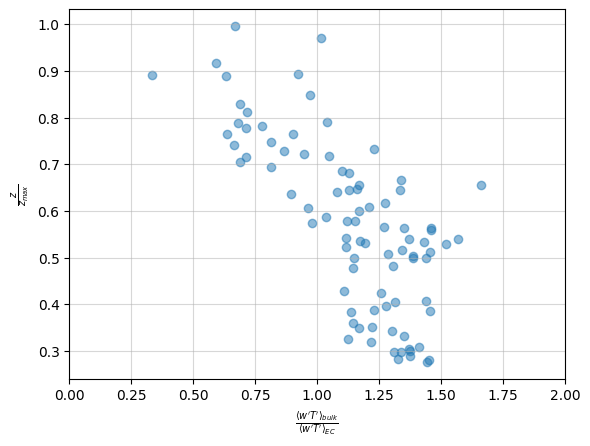

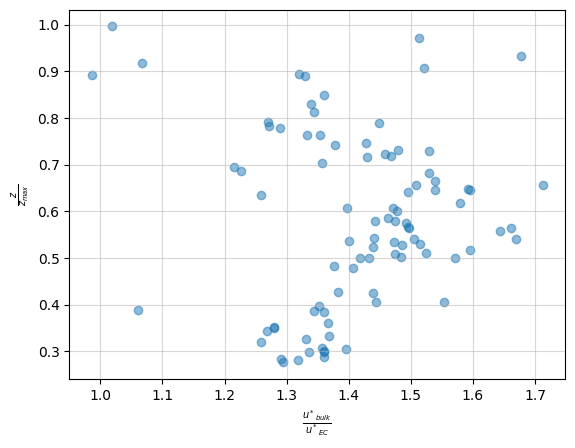

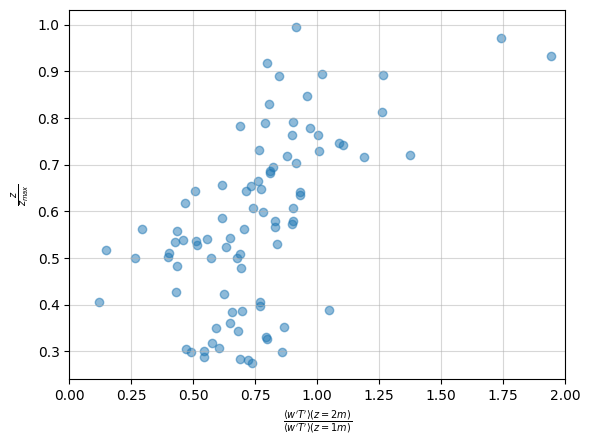

In [14]:
import Bulk
z_0=0.001#m
z_t=z_q=z_0*0.1
wT_Bulk_1_K=Bulk.wT_bulk(T2_1_K,z0=z_0,zt=z_t).values
us_Bulk_1_K=Bulk.us_bulk(T2_1_K,z0=z_0).values
fig=plt.figure()
plt.scatter(wT_Bulk_1_K/T2_1_K['wts_cov'].values,T2_1_K['instrument_height'].values/Ds_z_max['z_max'].values,alpha=0.5)
plt.ylabel(r"$\frac{z}{z_{max}}$")
plt.xlabel(r"$\frac{{\langle w'T' \rangle}_{bulk}}{{\langle w'T' \rangle}_{EC}}$")
#plt.axvline(0.8)
#plt.axvline(1.2)
plt.xlim(right=2)
plt.grid(alpha=0.5)
plt.xlim(0,2)
plt.savefig(repertoire_figures+'wT_Bulk_zmax.png')

fig=plt.figure()
plt.scatter(us_Bulk_1_K/T2_1_K['u*'].values,T2_1_K['instrument_height'].values/Ds_z_max['z_max'].values,alpha=0.5)
plt.ylabel(r"$\frac{z}{z_{max}}$")
plt.xlabel(r"$\frac{{u^*}_{bulk}}{{u^*}_{EC}}$")
plt.grid(alpha=0.5)
plt.savefig(repertoire_figures+'us_Bulk_zmax.png')

fig=plt.figure()
plt.scatter(T2_2_K['wts_cov'].values/T2_1_K['wts_cov'].values,T2_1_K['instrument_height'].values/Ds_z_max['z_max'].values,alpha=0.5)
plt.ylabel(r"$\frac{z}{z_{max}}$")
plt.xlabel(r"$\frac{{\langle w'T' \rangle}(z=2m)}{{\langle w'T' \rangle}(z=1m)}$")
#plt.axvline(0.8)
#plt.axvline(1.2)
plt.xlim(right=2)
plt.grid(alpha=0.5)
plt.xlim(0,2)


rugosités : 
z_0 = 0.001 m
z_t = 0.0001 m
z_q = 0.0001 m
appel wT
zt 2.9999999999999997e-05
appel u_s()
z0 0.0003
appel u_s()
z0 0.0003
appel wT
zt 2.9999999999999997e-05
appel u_s()
z0 0.0003
appel u_s()
z0 0.0003
appel wT
zt 2.9999999999999997e-05
appel u_s()
z0 0.0003
appel u_s()
z0 0.0003
H niveau 1 : 


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


R^2 0.6467504935963112
MBE -0.3794268541277992 W/m^2
MRBE 18.868267370559614 %
MBE_norm 0.007451414183430046
RMSE 10.270941592454783 W/m^2
RMSE_norm 0.7549551870419372 
H niveau  2 : 
R^2 5.978019025695014e-06
MBE 4.276644860620679 W/m^2
MBE_norm -0.11605207215315276
MRBE 57.07158017296763 %
RMSE 19.436176643051468 W/m^2
RMSE_norm 1.5131465314757226 
H niveau  3 : 
R^2 0.004719973133258678
MBE -8.601374210225483 W/m^2
MBE_norm 0.2584458129698643
MRBE 90.75966502499594 %
RMSE 23.395250346650954 W/m^2
RMSE_norm 1.3611411991080764 
us niveau 1 : 
R^2 0.9403571220808393
MBE 0.03539789917719356 m/s
MBE_norm 0.22998189591886367
RMSE 0.0386267198686582 m/s
RMSE_norm 0.7556652837598796
us niveau  2 : 
R^2 0.06143044112411637
MBE 0.014337022147933262 m/s
MBE_norm 0.12550258717253188
RMSE 0.04063654374943436 m/s
RMSE_norm 1.5950408944184638
us niveau  3 : 
R^2 0.10633501597544566
MBE -0.0376093345093813 m/s
MBE_norm -0.23179788027276538
RMSE 0.07523800271982245 m/s
RMSE_norm 1.6767609599525992


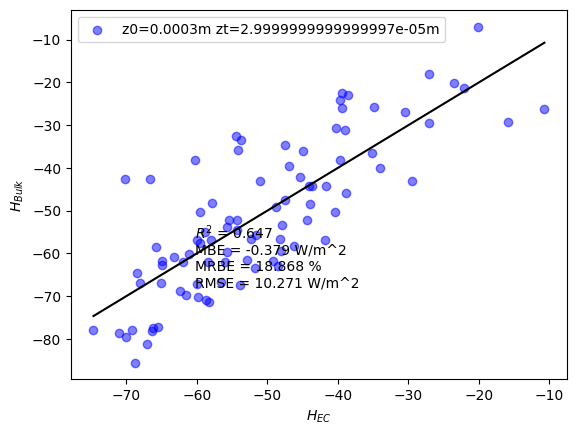

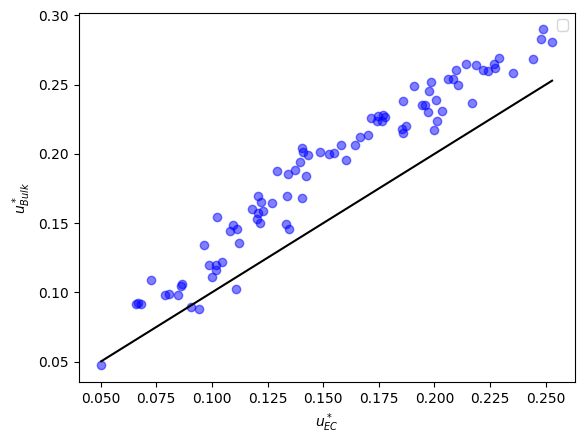

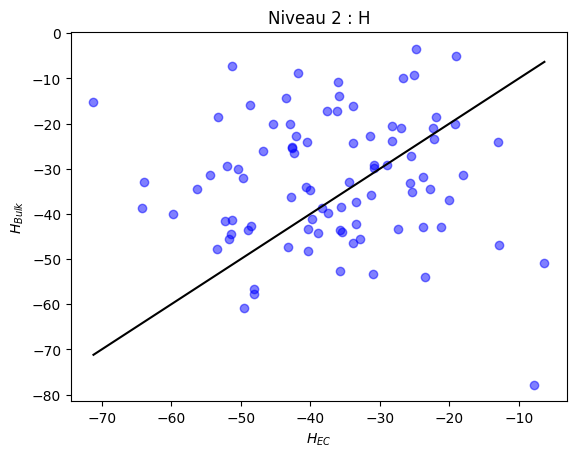

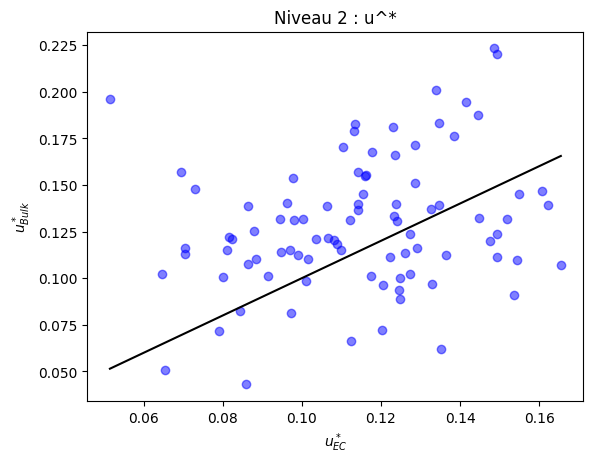

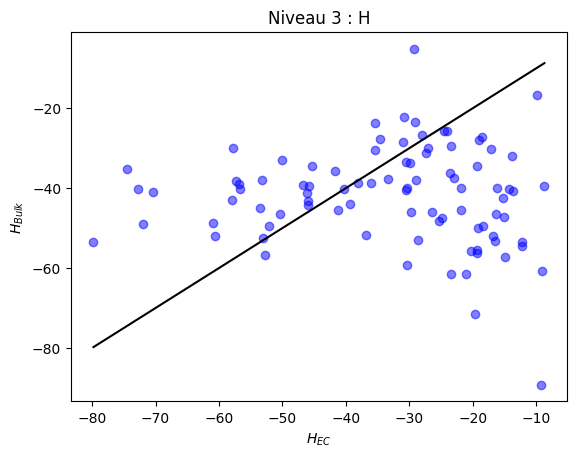

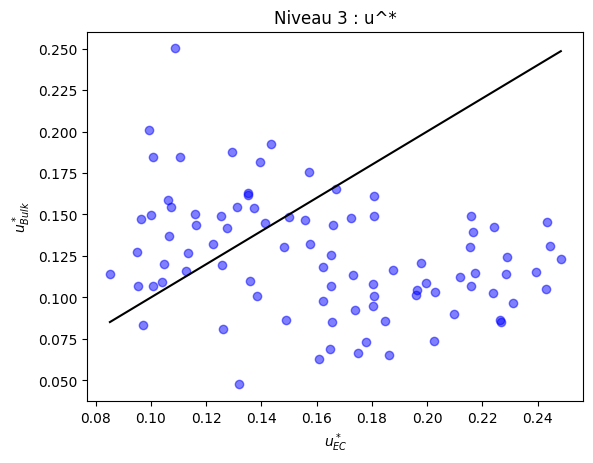

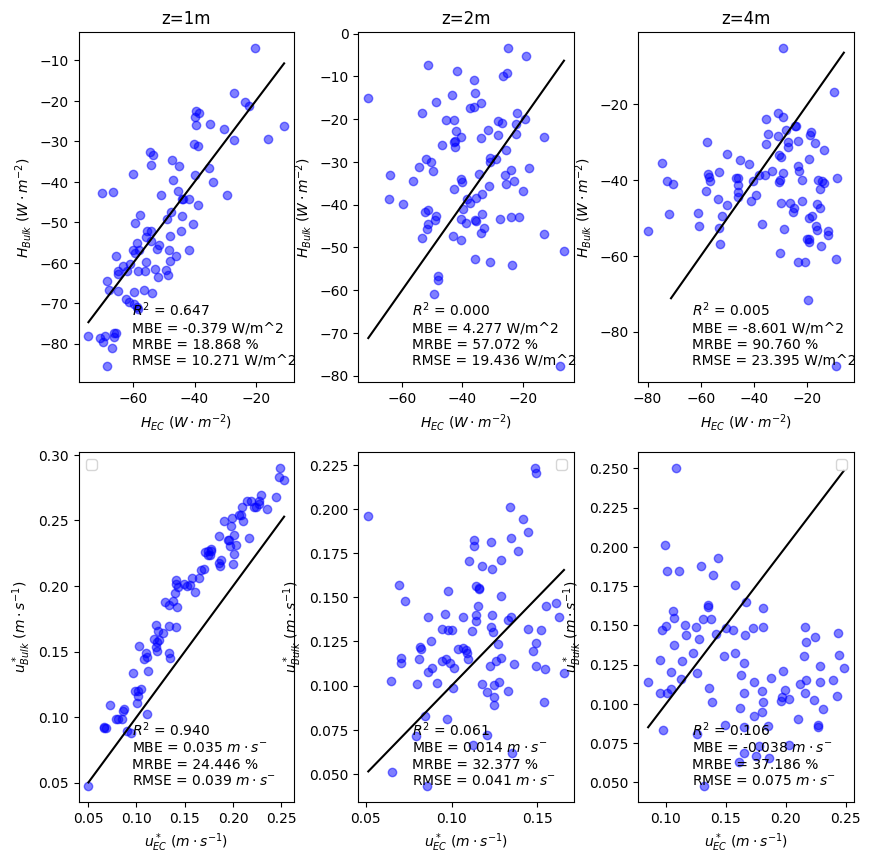

In [15]:
def slope_1(x,offset=0.0,axis=None,**kwargs):
    #offset : tq x=(1+offset)*x
    x_range=np.linspace(np.nanmin(x),np.nanmax(x),x.size)
    if isinstance(x,mpl.axes.Axes):
        axis.plot(x_range,(1.0+offset)*x_range,**kwargs)
    else:
        plt.plot(x_range,(1.0+offset)*x_range,**kwargs)

def MBE(model,data):
    #return np.mean(np.abs(model-data))
    return np.mean(model-data)
def MBE_norm(model,data):
    return MBE(model,data)/np.mean(data)

def MSE(model,data):
    return np.mean((data-model)**2)

def RMSE(model,data):
    return np.sqrt(MSE(data,model))

def RMSE_norm(model,data):
    return np.sqrt(MSE(data,model))/np.std(data)
def MRBE(model, data):
    return np.mean(np.abs((data-model)/data))


z_0=0.001#m
z_t=z_q=z_0*0.1
#z_0=z_t=1.0e-5

#z_0=1.0e-5#m
#z_t=z_0

z_0_1=0.0003#m
z_t_1=z_q_1=1.0e-1*z_0_1

print(f"rugosités : ")
print(f"z_0 = {z_0} m")
print(f"z_t = {z_t} m")
print(f"z_q = {z_q} m")

H_Bulk_1_K=Bulk.H_bulk(T2_1_K,z0=z_0_1,zt=z_t_1).values
us_Bulk_1_K=Bulk.us_bulk(T2_1_K,z0=z_0_1).values

H_Bulk_2_K=Bulk.H_bulk(T2_2_K,z0=z_0_1,zt=z_t_1).values
us_Bulk_2_K=Bulk.us_bulk(T2_2_K,z0=z_0_1).values

H_Bulk_3_K=Bulk.H_bulk(T2_3_K,z0=z_0_1,zt=z_t_1).values
us_Bulk_3_K=Bulk.us_bulk(T2_3_K,z0=z_0_1).values

print("H niveau 1 : ")
print(f"R^2 {Bulk.R_2(H_Bulk_1_K,T2_1_K['H'].values)}")
print(f"MBE {MBE(H_Bulk_1_K,T2_1_K['H'].values)} W/m^2")
print(f"MRBE {100.0*MRBE(H_Bulk_1_K,T2_1_K['H'].values)} %")
print(f"MBE_norm {MBE_norm(H_Bulk_1_K,T2_1_K['H'].values)}")
print(f"RMSE {RMSE(H_Bulk_1_K,T2_1_K['H'].values)} W/m^2")
print(f"RMSE_norm {RMSE_norm(H_Bulk_1_K,T2_1_K['H'].values)} ")


print("H niveau  2 : ")
print(f"R^2 {Bulk.R_2(H_Bulk_2_K,T2_2_K['H'].values)}")
print(f"MBE {MBE(H_Bulk_2_K,T2_2_K['H'].values)} W/m^2")
print(f"MBE_norm {MBE_norm(H_Bulk_2_K,T2_2_K['H'].values)}")
print(f"MRBE {100.0*MRBE(H_Bulk_2_K,T2_2_K['H'].values)} %")
print(f"RMSE {RMSE(H_Bulk_2_K,T2_2_K['H'].values)} W/m^2")
print(f"RMSE_norm {RMSE_norm(H_Bulk_2_K,T2_2_K['H'].values)} ")


print("H niveau  3 : ")
print(f"R^2 {Bulk.R_2(H_Bulk_3_K,T2_3_K['H'].values)}")
print(f"MBE {MBE(H_Bulk_3_K,T2_3_K['H'].values)} W/m^2")
print(f"MBE_norm {MBE_norm(H_Bulk_3_K,T2_3_K['H'].values)}")
print(f"MRBE {100.0*MRBE(H_Bulk_3_K,T2_3_K['H'].values)} %")
print(f"RMSE {RMSE(H_Bulk_3_K,T2_3_K['H'].values)} W/m^2")
print(f"RMSE_norm {RMSE_norm(H_Bulk_3_K,T2_3_K['H'].values)} ")

print("us niveau 1 : ")
print(f"R^2 {Bulk.R_2(us_Bulk_1_K,T2_1_K['u*'].values)}")
print(f"MBE {MBE(us_Bulk_1_K,T2_1_K['u*'].values)} m/s")
print(f"MBE_norm {MBE_norm(us_Bulk_1_K,T2_1_K['u*'].values)}")
print(f"RMSE {RMSE(us_Bulk_1_K,T2_1_K['u*'].values)} m/s")
print(f"RMSE_norm {RMSE_norm(us_Bulk_1_K,T2_1_K['u*'].values)}")

print("us niveau  2 : ")
print(f"R^2 {Bulk.R_2(us_Bulk_2_K,T2_2_K['u*'].values)}")
print(f"MBE {MBE(us_Bulk_2_K,T2_2_K['u*'].values)} m/s")
print(f"MBE_norm {MBE_norm(us_Bulk_2_K,T2_2_K['u*'].values)}")
print(f"RMSE {RMSE(us_Bulk_2_K,T2_2_K['u*'].values)} m/s")
print(f"RMSE_norm {RMSE_norm(us_Bulk_2_K,T2_2_K['u*'].values)}")

print("us niveau  3 : ")
print(f"R^2 {Bulk.R_2(us_Bulk_3_K,T2_3_K['u*'].values)}")
print(f"MBE {MBE(us_Bulk_3_K,T2_3_K['u*'].values)} m/s")
print(f"MBE_norm {MBE_norm(us_Bulk_3_K,T2_3_K['u*'].values)}")
print(f"RMSE {RMSE(us_Bulk_3_K,T2_3_K['u*'].values)} m/s")
print(f"RMSE_norm {RMSE_norm(us_Bulk_3_K,T2_3_K['u*'].values)}")

def texte(model,data,units="W/m^2"):
    R2_texte="$R^2$ = {:.3f}".format(Bulk.R_2(model, data))+"\n"
    MBE_texte="MBE = {:.3f}".format(Bulk.MBE(model, data))+" "+units+"\n"
    MRBE_texte="MRBE = {:.3f} %\n".format(100.0*MRBE(model, data))
    RMSE_texte="RMSE = {:.3f}".format(Bulk.RMSE(model, data))+" "+units
    return R2_texte+MBE_texte+MRBE_texte+RMSE_texte

fig=plt.figure()
ax=fig.add_subplot(111)
#plt.scatter(T2_1_K['H'].values,Bulk.H_bulk(T2_1_K,z0=z_0_1,zt=z_t_1).values,alpha=0.5,color='r',
            #label='z0='+str(z_0_1)+"m zt="+str(z_t_1)+"m")
plt.scatter(T2_1_K['H'].values,H_Bulk_1_K,alpha=0.5,color='b',
            label='z0='+str(z_0_1)+"m zt="+str(z_t_1)+"m")
"""
plt.scatter(T2_1_K['H'].values,
            Bulk.H_bulk(T2_1_K,z0=z_0_1,zt=z_t_1).values,
            color='g',
            alpha=0.5,
            label='z0='+str(z_0_1)+"m zt="+str(z_t_1)+"m")"""
slope_1(T2_1_K['H'].values, color='k')
plt.text(0.25,0.25,texte(H_Bulk_1_K,T2_1_K['H'].values),transform=ax.transAxes)
plt.ylabel(r"$H_{Bulk}$")
plt.xlabel(r"$H_{EC}$")
plt.legend()

fig=plt.figure()
plt.scatter(T2_1_K['u*'].values,us_Bulk_1_K,color='b',alpha=0.5)
"""
plt.scatter(T2_1_K['u*'].values,
            Bulk.us_bulk(T2_1_K,z0=z_0_1).values,
            color='g',
            alpha=0.5,
            label='z0='+str(z_0_1)+"m")"""
slope_1(T2_1_K['u*'].values, color='k')
plt.ylabel(r"$u^*_{Bulk}$")
plt.xlabel(r"$u^*_{EC}$")
plt.legend()



fig=plt.figure()
plt.title("Niveau 2 : H")
plt.scatter(T2_2_K['H'].values,H_Bulk_2_K,color='b',alpha=0.5)
slope_1(T2_2_K['H'].values, color='k')
plt.ylabel(r"$H_{Bulk}$")
plt.xlabel(r"$H_{EC}$")

fig=plt.figure()
plt.title("Niveau 2 : u^*")
plt.scatter(T2_2_K['u*'].values,us_Bulk_2_K,color='b',alpha=0.5)
slope_1(T2_2_K['u*'].values, color='k')
plt.ylabel(r"$u^*_{Bulk}$")
plt.xlabel(r"$u^*_{EC}$")



fig=plt.figure()
plt.title("Niveau 3 : H")
plt.scatter(T2_3_K['H'].values,H_Bulk_3_K,color='b',alpha=0.5)
slope_1(T2_3_K['H'].values, color='k')
plt.ylabel(r"$H_{Bulk}$")
plt.xlabel(r"$H_{EC}$")

fig=plt.figure()
plt.title("Niveau 3 : u^*")
plt.scatter(T2_3_K['u*'].values,us_Bulk_3_K,color='b',alpha=0.5)
slope_1(T2_3_K['u*'].values, color='k')
plt.ylabel(r"$u^*_{Bulk}$")
plt.xlabel(r"$u^*_{EC}$")

fig=plt.figure(figsize=(10,10))
fig.subplots_adjust(wspace=0.3)
ax1=fig.add_subplot(231)
plt.title("z=1m")
plt.scatter(T2_1_K['H'].values,H_Bulk_1_K,alpha=0.5,color='b',
            label='z0='+str(z_0)+"m zt="+str(z_t)+"m")
slope_1(T2_1_K['H'].values, color='k')
plt.text(0.25,0.05,texte(H_Bulk_1_K,T2_1_K['H'].values),transform=ax1.transAxes)
plt.ylabel(r"$H_{Bulk}$ ($W\cdot m^{-2}$)")
plt.xlabel(r"$H_{EC}$ ($W\cdot m^{-2}$)")

ax2=fig.add_subplot(232)
plt.title("z=2m")
plt.scatter(T2_2_K['H'].values,H_Bulk_2_K,color='b',alpha=0.5)
slope_1(T2_2_K['H'].values, color='k')
plt.ylabel(r"$H_{Bulk}$ ($W\cdot m^{-2}$)")
plt.xlabel(r"$H_{EC}$ ($W\cdot m^{-2}$)")
plt.text(0.25,0.05,texte(H_Bulk_2_K,T2_2_K['H'].values),transform=ax2.transAxes)

ax3=fig.add_subplot(233)
plt.title("z=4m")
plt.scatter(T2_3_K['H'].values,H_Bulk_3_K,color='b',alpha=0.5)
slope_1(T2_2_K['H'].values, color='k')
plt.ylabel(r"$H_{Bulk}$ ($W\cdot m^{-2}$)")
plt.xlabel(r"$H_{EC}$ ($W\cdot m^{-2}$)")
plt.text(0.25,0.05,texte(H_Bulk_3_K,T2_3_K['H'].values),transform=ax3.transAxes)


ax4=fig.add_subplot(234)
plt.scatter(T2_1_K['u*'].values,us_Bulk_1_K,color='b',alpha=0.5)
slope_1(T2_1_K['u*'].values, color='k')
plt.ylabel(r"$u^*_{Bulk}$ ($m\cdot s^{-1}$)")
plt.xlabel(r"$u^*_{EC}$ ($m\cdot s^{-1}$)")
plt.legend()
plt.text(0.25,0.05,texte(us_Bulk_1_K,T2_1_K['u*'].values,units='$m\cdot s^{-}$'),transform=ax4.transAxes)

ax5=fig.add_subplot(235)
plt.scatter(T2_2_K['u*'].values,us_Bulk_2_K,color='b',alpha=0.5)
slope_1(T2_2_K['u*'].values, color='k')
plt.ylabel(r"$u^*_{Bulk}$ ($m\cdot s^{-1}$)")
plt.xlabel(r"$u^*_{EC}$ ($m\cdot s^{-1}$)")
plt.legend()
plt.text(0.25,0.05,texte(us_Bulk_2_K,T2_2_K['u*'].values,units='$m\cdot s^{-}$'),transform=ax5.transAxes)


ax6=fig.add_subplot(236)
plt.scatter(T2_3_K['u*'].values,us_Bulk_3_K,color='b',alpha=0.5)
slope_1(T2_3_K['u*'].values, color='k')
plt.ylabel(r"$u^*_{Bulk}$ ($m\cdot s^{-1}$)")
plt.xlabel(r"$u^*_{EC}$ ($m\cdot s^{-1}$)")
plt.legend()
plt.text(0.25,0.05,texte(us_Bulk_3_K,T2_3_K['u*'].values,units='$m\cdot s^{-}$'),transform=ax6.transAxes)

plt.savefig(repertoire_figures+"Bulk_T2TO5.png")

In [16]:
print("{:.3f}".format(2.3))

2.300


appel wT
zt 0.0001
appel u_s()
z0 0.001
appel wT
zt 0.0002
appel u_s()
z0 0.002
appel wT
zt 0.0004
appel u_s()
z0 0.004
appel wT
zt 0.0008
appel u_s()
z0 0.008
appel wT
zt 0.0016
appel u_s()
z0 0.016
appel wT
zt 0.0001
appel u_s()
z0 0.001
appel wT
zt 0.0002
appel u_s()
z0 0.002
appel wT
zt 0.0004
appel u_s()
z0 0.004
appel wT
zt 0.0008
appel u_s()
z0 0.008
appel wT
zt 0.0016
appel u_s()
z0 0.016
[20.843087587140896, 32.14149451292376, 47.55681406003625, 68.49313702824212, 97.57478592459064]
appel wT
zt 0.0001
appel u_s()
z0 0.001
appel wT
zt 0.0002
appel u_s()
z0 0.002
appel wT
zt 0.0004
appel u_s()
z0 0.004
appel wT
zt 0.0008
appel u_s()
z0 0.008
appel wT
zt 0.0016
appel u_s()
z0 0.016


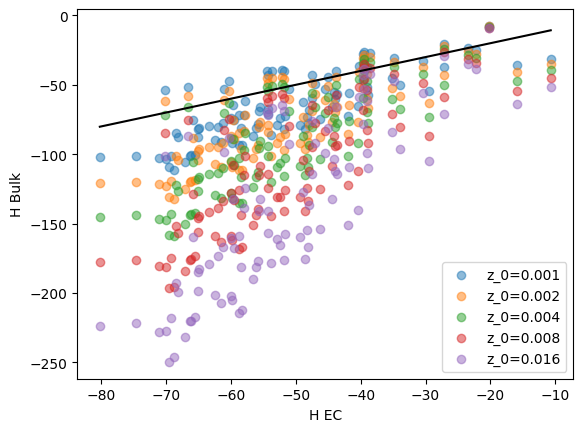

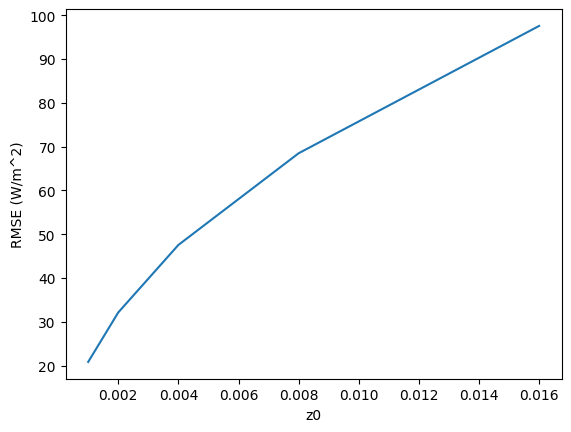

In [17]:
z_0=np.array([0.001,0.002,0.004,0.008,0.016])
z_t=z_0/10
fig=plt.figure()
for i in range(0,z_0.size):
    plt.scatter(T2_1_2min_moy['H'].values,Bulk.H_bulk(T2_1_2min_moy,z0=z_0[i],zt=z_t[i]),
                alpha=0.5, label="z_0={}".format(np.round(z_0[i],3)))
slope_1(T2_1_2min_moy['H'].values,color='k')
plt.xlabel("H EC")
plt.ylabel("H Bulk")
plt.legend()
plt.savefig(repertoire_figures+"sensibilite_z0_T2.png")
print([Bulk.RMSE(T2_1_2min_moy['H'].values,Bulk.H_bulk(T2_1_2min_moy,z0=z_0[i],zt=z_t[i])) for i in range(0,z_0.size)])
fig=plt.figure()
plt.plot(z_0,[Bulk.RMSE(T2_1_2min_moy['H'].values,Bulk.H_bulk(T2_1_2min_moy,z0=z_0[i],zt=z_t[i])) for i in range(0,z_0.size)])
plt.xlabel("z0")
plt.ylabel("RMSE (W/m^2)")
plt.savefig(repertoire_figures+"RMSE_z0_T2.png")


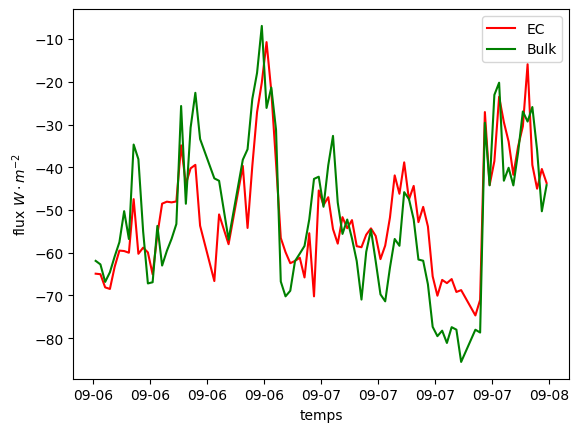

In [18]:
fig=plt.figure()
date_format=mpl.dates.DateFormatter("%m-%d")
ax = fig.add_subplot(111)
plt.plot(T2_1_K.coords['temps'].values,T2_1_K['H'],color='r', label='EC')
plt.plot(T2_1_K.coords['temps'].values,H_Bulk_1_K,color='g', label='Bulk')
ax.xaxis.set_major_formatter(date_format)
plt.xlabel("temps")
plt.ylabel(r"flux $W\cdot m^{-2}$")
plt.legend()

niveau 1:
nombre d'échantillons : 38
<z0> = 1.6767481958804284e-05 m, std=1.7830437724844388e-05 m
median(z0) 1.6575036142587e-05 m, IQR=2.3735561329737028e-05 m
<zt> = 6.920496506746203e-05 m, std=9.585393380456847e-05 m
median(zt) 6.648384250456146e-05 m, IQR=0.00014794536283663318 m
niveau 2:
nombre d'échantillons : 1
<z0> = 1.89037873529716e-05 m, std=0.0 m
median(z0) 1.8903787352971597e-05 m, IQR=0.0 m
<zt> = 3.81592266387458e-10 m, std=0.0 m
median(zt) 3.8159226638745794e-10 m, IQR=0.0 m
niveau 3:
nombre d'échantillons : 1
<z0> = 1.89037873529716e-05 m, std=0.0 m
median(z0) 1.8903787352971597e-05 m, IQR=0.0 m
<zt> = 3.81592266387458e-10 m, std=0.0 m
median(zt) 3.8159226638745794e-10 m, IQR=0.0 m


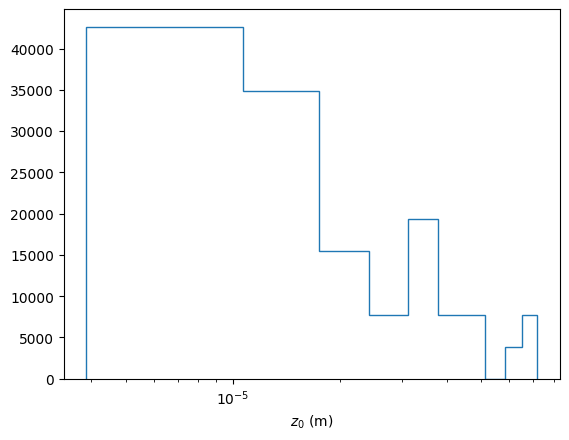

In [19]:
#Calcul des rugosités de surface
U_min=2.0#m/s
zL_min=0.0
zL_max=0.2
u_star_min=0.1#m/s
WDir_min=150.0#deg
WDir_max=200.0#deg
z0_min= 1.0e-7
zt_min=z0_min

flag_zmin=lambda x,zmin,zmax: (x >= zmin) & (x <= zmax) 
flag_U = lambda x: x>= U_min
flag_u_star = lambda x: x>=u_star_min
flag_zL = lambda x: (x >= zL_min) & (x <= zL_max)
flag_WDir = lambda x: (x >= WDir_min) & (x <= WDir_max)
flag_tot = lambda x: (flag_U(x['u_rot']) &
                      flag_u_star(x['u*']) &
                      flag_zL(x['zL']) &
                      flag_WDir(x['wind_dir']))
T2_1_K_sel=T2_1_K.where(flag_tot,drop=True)
T2_2_K_sel=T2_2_K.where(flag_tot,drop=True)
T2_3_K_sel=T2_2_K.where(flag_tot,drop=True)
#print(T2_1_30min_sel)
#print(T2_2_30min_sel)

z0_1=Bulk.z0_EC(T2_1_K_sel).values
z0_1_moy=scipy.stats.mstats.gmean(z0_1)
z0_1_std=np.std(z0_1)
z0_1_IQR=scipy.stats.iqr(z0_1)
z0_1_med=np.median(z0_1)


zt_1=Bulk.zt_EC(T2_1_K_sel).values
zt_1_moy=scipy.stats.mstats.gmean(zt_1)
zt_1_std=np.std(zt_1)
zt_1_IQR=scipy.stats.iqr(zt_1)
zt_1_med=np.median(zt_1)

z0_2=Bulk.z0_EC(T2_2_K_sel).values
z0_2_moy=scipy.stats.mstats.gmean(z0_2)
z0_2_std=np.std(z0_2)
z0_2_IQR=scipy.stats.iqr(z0_2)
z0_2_med=np.median(z0_2)

zt_2=Bulk.zt_EC(T2_2_K_sel).values
zt_2_moy=scipy.stats.mstats.gmean(zt_2)
zt_2_std=np.std(zt_2)
zt_2_IQR=scipy.stats.iqr(zt_2)
zt_2_med=np.median(zt_2)

z0_3=Bulk.z0_EC(T2_3_K_sel).values
z0_3_moy=scipy.stats.mstats.gmean(z0_3)
z0_3_std=np.std(z0_3)
z0_3_IQR=scipy.stats.iqr(z0_3)
z0_3_med=np.median(z0_3)

zt_3=Bulk.zt_EC(T2_3_K_sel).values
zt_3_moy=scipy.stats.mstats.gmean(zt_3)
zt_3_std=np.std(zt_3)
zt_3_IQR=scipy.stats.iqr(zt_3)
zt_3_med=np.median(zt_3)


#print(f"nombre valeurs sélectionnées niveau 1 : {z0_1.size}")
#print(f"liste z0 (m) {z0_1}")
#print(f"liste zt (m) {zt_1}")

print(f"niveau 1:")
print(f"nombre d'échantillons : {z0_1.size}")
print(f"<z0> = {z0_1_moy} m, std={z0_1_std} m")
print(f"median(z0) {z0_1_med} m, IQR={z0_1_IQR} m")
print(f"<zt> = {zt_1_moy} m, std={zt_1_std} m")
print(f"median(zt) {zt_1_med} m, IQR={zt_1_IQR} m")


print(f"niveau 2:")
print(f"nombre d'échantillons : {z0_2.size}")
print(f"<z0> = {z0_2_moy} m, std={z0_2_std} m")
print(f"median(z0) {z0_2_med} m, IQR={z0_2_IQR} m")
print(f"<zt> = {zt_2_moy} m, std={zt_2_std} m")
print(f"median(zt) {zt_2_med} m, IQR={zt_2_IQR} m")

print(f"niveau 3:")
print(f"nombre d'échantillons : {z0_3.size}")
print(f"<z0> = {z0_3_moy} m, std={z0_3_std} m")
print(f"median(z0) {z0_3_med} m, IQR={z0_3_IQR} m")
print(f"<zt> = {zt_3_moy} m, std={zt_3_std} m")
print(f"median(zt) {zt_3_med} m, IQR={zt_3_IQR} m")

fig=plt.figure()
plt.hist(z0_1,density=True ,histtype='step')
plt.xlabel(r"$z_0$ (m)")
plt.xscale('log')

<xarray.Dataset>
Dimensions:                  (temps: 26, freq: 50)
Coordinates:
  * temps                    (temps) datetime64[ns] 2023-09-06T00:14:00 ... 2...
  * freq                     (freq) float64 nan 0.009766 nan ... 8.105 9.341
Data variables: (12/96)
    daytime                  (temps) float64 0.0 0.0 0.0 0.0 ... 1.0 1.0 1.0 1.0
    Tau                      (temps) float64 -0.0471 -0.04498 ... -0.0431
    qc_Tau                   (temps) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.1333
    H                        (temps) float64 -64.9 -65.02 ... -74.67 -71.02
    qc_H                     (temps) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.06667
    H_strg                   (temps) float64 0.1248 0.2569 ... -0.453 -0.01969
    ...                       ...
    f_C_wts_norm             (freq, temps) float64 nan nan nan ... 0.1502 0.1442
    f_Su                     (freq, temps) float64 nan nan ... 0.01713 0.02033
    f_Sv                     (freq, temps) float64 nan nan ... 0.02373 0

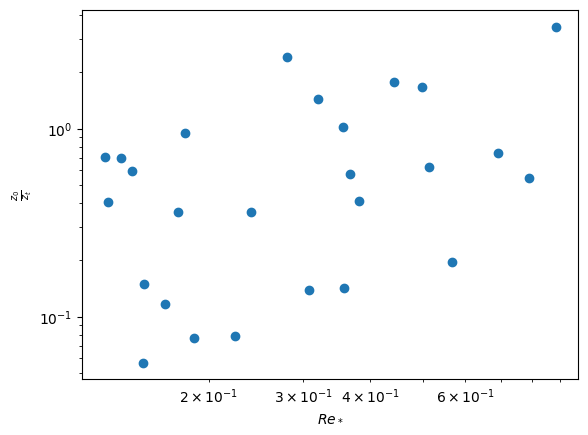

In [20]:
#essai calcul hauteur rugosité en tenant compte de la position de z_max:
#on utilise le niveau 1, avec z/z_max <= 0.6

flag_zmax=(T2_1_K['instrument_height']/Ds_z_max['z_max'] <= 0.5) & flag_tot(T2_1_K)
T2_1_K_sel=T2_1_K.where(flag_zmax,drop=True)
print(T2_1_K_sel)
z0_1=Bulk.z0_EC(T2_1_K_sel).values
z0_1_moy=scipy.stats.mstats.gmean(z0_1)
z0_1_std=np.std(z0_1)
z0_1_IQR=scipy.stats.iqr(z0_1)
z0_1_med=np.median(z0_1)

mu=1.85e-5#Pa.s
nu=mu/np.mean(T2_1_K['air_density'].values)

zt_1=Bulk.zt_EC(T2_1_K_sel).values
zt_1_moy=scipy.stats.mstats.gmean(zt_1)
zt_1_std=np.std(zt_1)
zt_1_IQR=scipy.stats.iqr(zt_1)
zt_1_med=np.median(zt_1)

print(z0_1)
print(f"niveau 1:")
print(f"nombre d'échantillons : {z0_1.size}")
print(f"<z0> = {z0_1_moy} m, std={z0_1_std} m")
print(f"median(z0) {z0_1_med} m, IQR={z0_1_IQR} m")
print(f"<zt> = {zt_1_moy} m, std={zt_1_std} m")
print(f"median(zt) {zt_1_med} m, IQR={zt_1_IQR} m")
Re=T2_1_K_sel['u*'].values*z0_1/nu
fig=plt.figure()
plt.scatter(Re, z0_1/zt_1)
plt.xlabel(r"$Re_*$")
plt.ylabel(r"$\frac{z_0}{z_t}$")
plt.xscale('log')
plt.yscale('log')

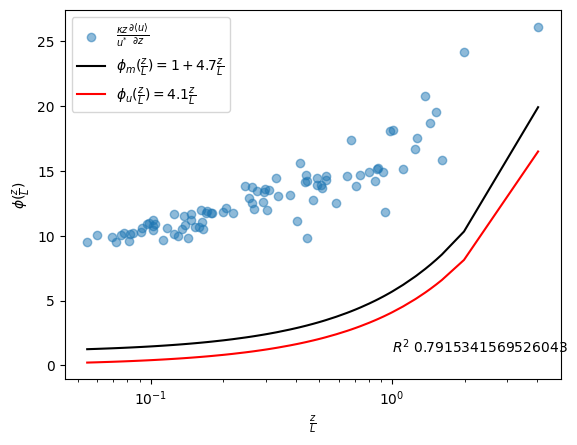

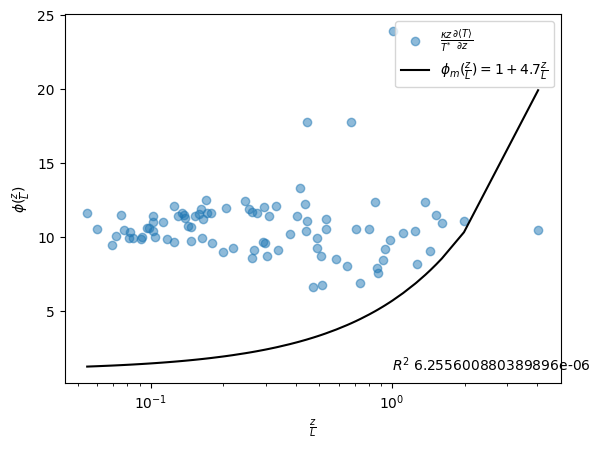

In [21]:
#Test des fonctions de stabilité sur le premier niveau
def phi(zSL,a,b):
    return a*zSL+b
#print(f"z_1 {z_1}")
def derivee_avant(y_sup,y,delta_x):
    return(y_sup - y)/delta_x
kappa=0.41#constante de Prandtl

flag_isnan=lambda x:np.isnan(x)
flag_isinf=lambda x:np.isinf(x)
flag_outliers=lambda x:np.logical_not(flag_isnan(x) | flag_isinf(x))
flag_outliers_vars= lambda x: (flag_outliers(x['u_rot']) & 
                               flag_outliers(x['u*']) &
                               flag_outliers(x['T*']) &
                               flag_outliers(x['zL']) &
                               flag_outliers(x['instrument_height']))
T2_1_K_sim=T2_1_K.where(flag_outliers_vars(T2_1_K),drop=True).sortby('zL')

delta_z=T2_1_K_sim['instrument_height'].values
zL_1=T2_1_K_sim['zL'].values
ts_moy_1=T2_1_K_sim['ts_mean'].values
u_s=T2_1_K_sim['u*'].values
t_s=T2_1_K_sim['T*'].values
U_moy_1=T2_1_K_sim['u_rot'].values

range_zL=np.geomspace(np.min(zL_1),np.max(zL_1),T2_1_K_sim.coords['temps'].size)

dT_dz=(ts_moy_1-273.15)/delta_z
dU_dz=U_moy_1/delta_z

flux_grad_U=(kappa*delta_z/u_s)*dU_dz
flux_grad_T=(kappa*delta_z/t_s)*dT_dz
beta=4.7
alpha=1.0
phi_m=4.7*zL_1+1.0
phi_h=4.7*zL_1+1.0
phi_u=4.1*zL_1
fig=plt.figure()
plt.scatter(zL_1,
            flux_grad_U,
            alpha=0.5,
            label=r'$\frac{\kappa z}{u^{*}}\frac{\partial \langle u \rangle}{\partial z}$')
plt.plot(zL_1,
         phi_m,
         label=r'$\phi_m (\frac{z}{L})=1+4.7\frac{z}{L}$',color='k')
plt.plot(zL_1,
         phi_u,
         label=r'$\phi_u (\frac{z}{L})=4.1\frac{z}{L}$',color='r')
#plt.xlim(0,10)
plt.xlabel(r"$\frac{z}{L}$")
plt.ylabel(r"$\phi(\frac{z}{L})$")
#plt.ylim(-3,10)
plt.xscale('log')
plt.legend()
plt.text(1,1,r"$R^2$ {}".format(Bulk.R_2(phi_m,flux_grad_U)))
#plt.xlim(right=0.2)


fig=plt.figure()
plt.xscale('log')
plt.scatter(zL_1,
            flux_grad_T,
            alpha=0.5,
            label=r'$\frac{\kappa z}{T^{*}}\frac{\partial \langle T \rangle}{\partial z}$')
plt.plot(zL_1,
         phi_h,
         label=r'$\phi_m (\frac{z}{L})=1+4.7\frac{z}{L}$',color='k')
#plt.xlim(0.00001,10)
plt.xlabel(r"$\frac{z}{L}$")
plt.ylabel(r"$\phi(\frac{z}{L})$")
plt.text(1,1,r"$R^2$ {}".format(Bulk.R_2(phi_h,flux_grad_T)))
plt.legend()
#plt.xlim(right=0.2)

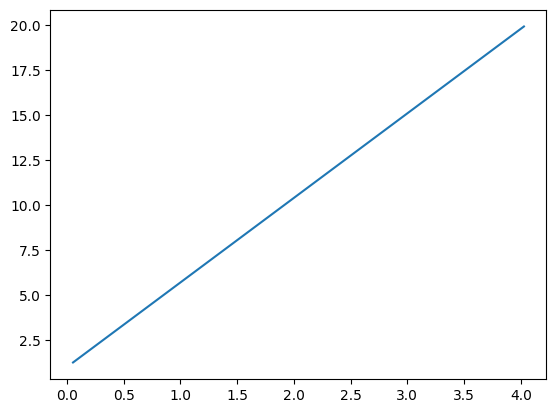

In [22]:
fig=plt.figure()
plt.plot(zL_1,
         phi_m)
#plt.xscale('log')

In [23]:
print(delta_z)

[1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03
 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03
 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03
 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03
 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03
 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03 1.03
 1.03 1.03 1.03 1.03 1.03]


['2023-09-07T03:00:00' '2023-09-07T08:00:00' '2023-09-07T12:00:00'
 '2023-09-07T16:00:00' '2023-09-07T18:00:00' '2023-09-07T20:00:00']
<xarray.Dataset>
Dimensions:                  (temps: 6, freq: 50)
Coordinates:
  * temps                    (temps) datetime64[ns] 2023-09-07T03:14:00 ... 2...
  * freq                     (freq) float64 nan 0.009766 nan ... 8.105 9.341
Data variables: (12/96)
    daytime                  (temps) float64 0.0 1.0 1.0 1.0 1.0 0.0
    Tau                      (temps) float64 -0.03607 -0.0182 ... -0.01498
    qc_Tau                   (temps) float64 0.0 0.06667 0.0 0.0 0.4 0.06667
    H                        (temps) float64 -52.37 -46.2 ... -38.57 -41.76
    qc_H                     (temps) float64 0.0 0.06667 0.0 0.0 0.06667 0.0
    H_strg                   (temps) float64 0.06581 0.6388 ... 0.5943 1.068
    ...                       ...
    f_C_wts_norm             (freq, temps) float64 nan nan nan ... 0.1457 0.1371
    f_Su                     (freq, t

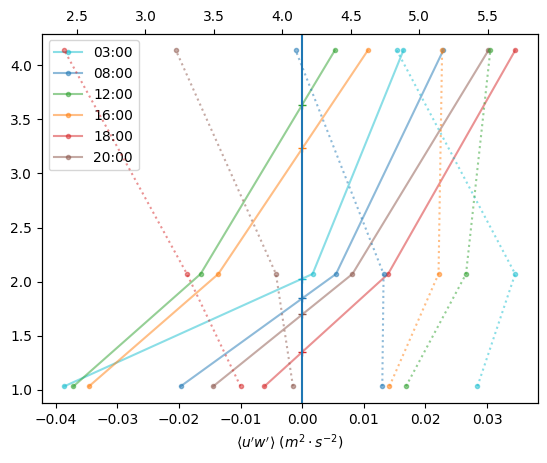

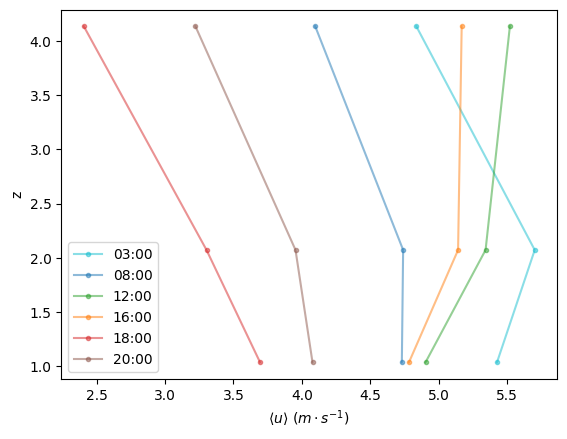

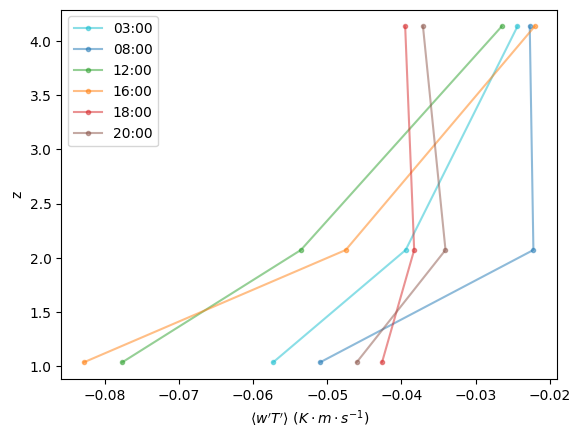

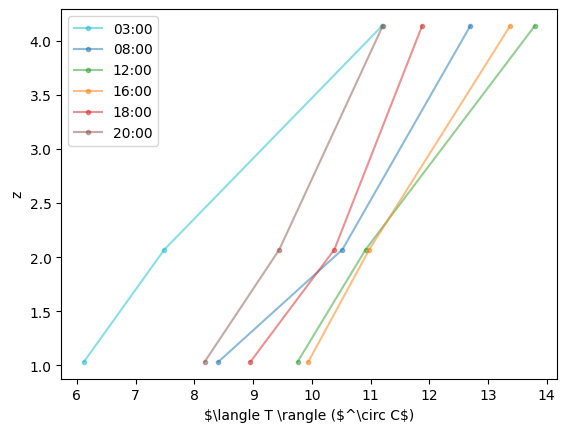

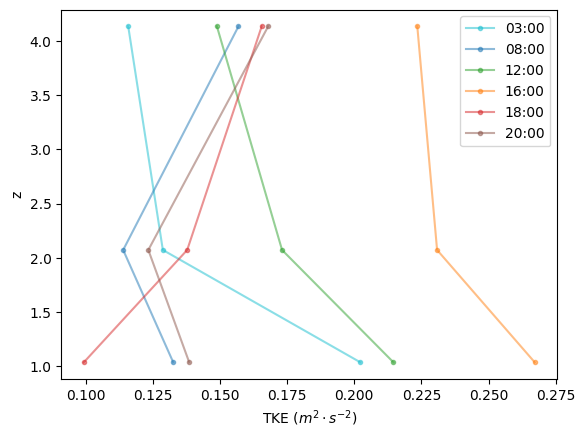

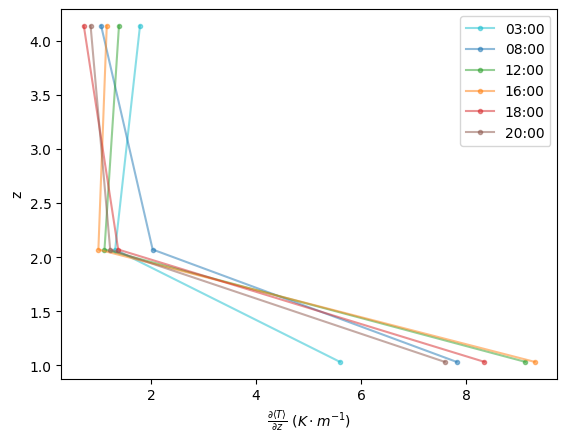

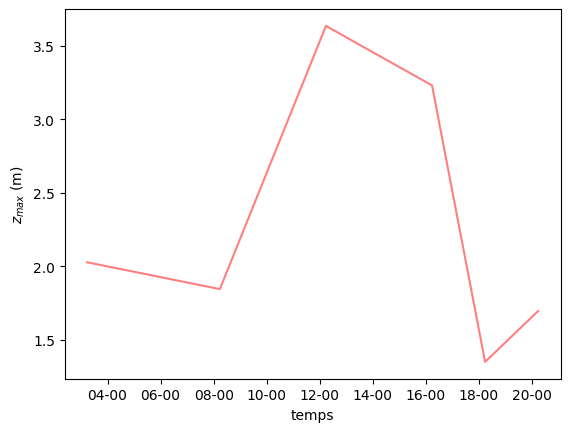

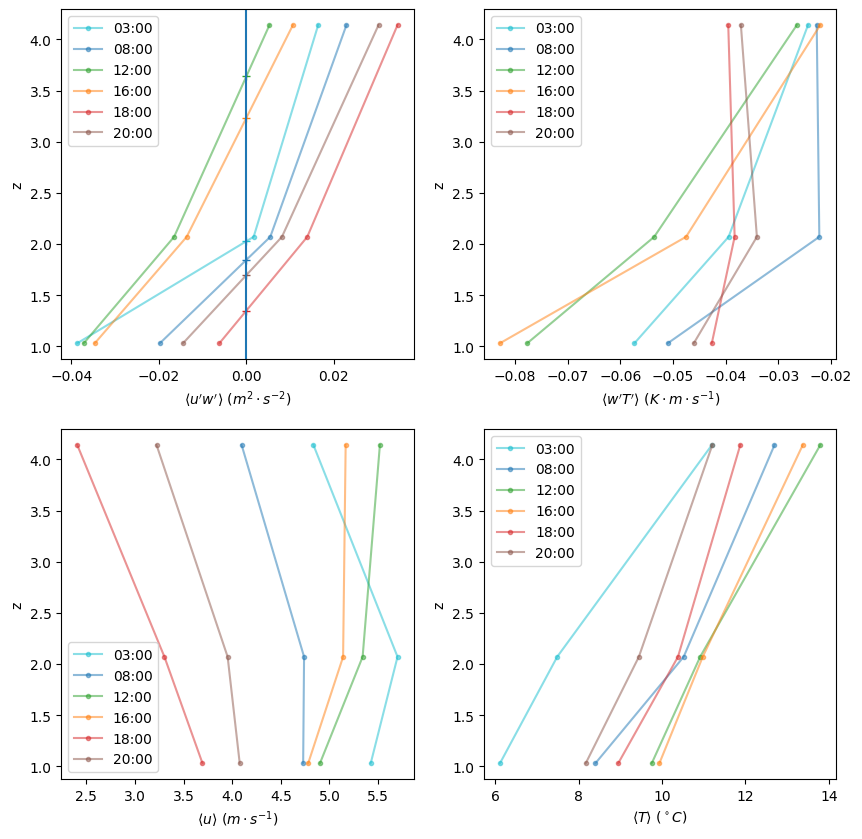

In [61]:
#tracé des profils à différentes horaires, sur la journée du 7 au 8 septembre
import scanf
jour="2023-09-07"
#liste_heures=["03:00","06:00","09:00","12:00","16:00","18:00","20:00","22:00"]
liste_heures=["03:00","08:00","12:00","16:00","18:00","20:00"]
liste_couleurs=['tab:cyan','tab:blue','tab:green','tab:orange','tab:red','tab:brown']
timestamps=np.array([jour+"T"+liste_heures[i]+":00" for i in range(0,len(liste_heures))]).astype('datetime64')
print(timestamps)
T2_1_K_trunc = T2_1_K.sel(temps = timestamps,method='nearest')
T2_2_K_trunc = T2_2_K.sel(temps = timestamps,method='nearest')
T2_3_K_trunc = T2_3_K.sel(temps = timestamps,method='nearest')
Ds_z_max_trunc=Ds_z_max.sel(temps=timestamps,method='nearest')

grad_T_1s_trunc=grad_T_1s.sel(temps = timestamps, method='nearest')
grad_T_12_trunc=grad_T_12.sel(temps = timestamps, method='nearest')
grad_T_23_trunc=grad_T_23.sel(temps = timestamps, method='nearest')

def lin_interp_zmax(var):
    z1=T2_1_K_trunc['instrument_height']
    z2=T2_2_K_trunc['instrument_height']
    z3=T2_3_K_trunc['instrument_height']


def get_hour(date):
    format="%4d-%2d-%2dT%2d:%2d:%f"
    digits=scanf.scanf(format,str(date))
    num_to_str=lambda x: '0'+str(x) if x <10 else str(x)
    return num_to_str(digits[3])+":"+num_to_str(digits[4])

print(T2_1_K_trunc)

fig=plt.figure()
ax1=fig.add_subplot(111)
ax1_bis=ax1.twiny()
for i in range(0,T2_1_K_trunc.coords['temps'].size):
    ax1.plot([T2_1_K_trunc['wu_cov'].values[i],
              T2_2_K_trunc['wu_cov'].values[i],
              T2_3_K_trunc['wu_cov'].values[i]],
             [T2_1_K_trunc['instrument_height'].values[i],
              T2_2_K_trunc['instrument_height'].values[i],
              T2_3_K_trunc['instrument_height'].values[i]],alpha=0.5,label=liste_heures[i],color=liste_couleurs[i],
             marker='.')

    ax1.plot(0,Ds_z_max_trunc['z_max'].values[i],marker='+',color=liste_couleurs[i])
    U_i_1=T2_1_K_trunc['u_rot'].values[i]
    #U_i_2=np.sqrt(T2_2_K_trunc['u_mean'].values[i]**2+T2_2_K_trunc['v_mean'].values[i]**2)
    U_i_2=T2_2_K_trunc['u_rot'].values[i]
    #U_i_3=np.sqrt(T2_3_K_trunc['u_mean'].values[i]**2+T2_3_K_trunc['v_mean'].values[i]**2)
    U_i_3=T2_3_K_trunc['u_rot'].values[i]
    ax1_bis.plot([U_i_1,
              U_i_2,
              U_i_3],
             [T2_1_K_trunc['instrument_height'].values[i],
              T2_2_K_trunc['instrument_height'].values[i],
              T2_3_K_trunc['instrument_height'].values[i]],alpha=0.5,marker='.',label=liste_heures[i],
                 color=liste_couleurs[i],linestyle='dotted')

ax1.set_xlabel(r"$\langle u'w' \rangle$ ($m^2 \cdot s^{-2}$)")
#ax1_bis.set_xlabel("U")
#ax1.set_ylabel('z')
ax1.axvline(0)
ax1.legend()
plt.savefig(repertoire_figures+"profil_heure_uw.png")

fig=plt.figure()
for i in range(0,T2_1_K_trunc.coords['temps'].size):
    plt.plot([T2_1_K_trunc['u_rot'].values[i],
              T2_2_K_trunc['u_rot'].values[i],
              T2_3_K_trunc['u_rot'].values[i]],
             [T2_1_K_trunc['instrument_height'].values[i],
              T2_2_K_trunc['instrument_height'].values[i],
              T2_3_K_trunc['instrument_height'].values[i]],alpha=0.5,color=liste_couleurs[i],label=liste_heures[i],marker='.')
plt.xlabel(r'$\langle u \rangle$ ($m \cdot s^{-1}$)')
plt.ylabel('z')
plt.legend()
plt.savefig(repertoire_figures+"profil_heure_U.png")


fig=plt.figure()
for i in range(0,T2_1_K_trunc.coords['temps'].size):
    plt.plot([T2_1_K_trunc['wts_cov'].values[i],
              T2_2_K_trunc['wts_cov'].values[i],
              T2_3_K_trunc['wts_cov'].values[i]],
             [T2_1_K_trunc['instrument_height'].values[i],
              T2_2_K_trunc['instrument_height'].values[i],
              T2_3_K_trunc['instrument_height'].values[i]],alpha=0.5,color=liste_couleurs[i],label=liste_heures[i],marker='.')
plt.xlabel(r"$\langle w'T' \rangle$ ($K \cdot m \cdot s^{-1}$)")
plt.ylabel('z')
#plt.axvline(0)
plt.legend()
plt.savefig(repertoire_figures+"profil_heure_wT.png")




fig=plt.figure()
for i in range(0,T2_1_K_trunc.coords['temps'].size):
    plt.plot([T2_1_K_trunc['air_temperature'].values[i]-273.15,
              T2_2_K_trunc['air_temperature'].values[i]-273.15,
              T2_3_K_trunc['air_temperature'].values[i]-273.15],
             [T2_1_K_trunc['instrument_height'].values[i],
              T2_2_K_trunc['instrument_height'].values[i],
              T2_3_K_trunc['instrument_height'].values[i]],alpha=0.5,marker='.',label=liste_heures[i],
             color=liste_couleurs[i])
plt.xlabel(r'$\langle T \rangle ($^\circ C$)')
plt.ylabel('z')
plt.legend()
plt.savefig(repertoire_figures+"profil_heure_T.png")

fig=plt.figure()
for i in range(0,T2_1_K_trunc.coords['temps'].size):
    plt.plot([T2_1_K_trunc['TKE'].values[i],
              T2_2_K_trunc['TKE'].values[i],
              T2_3_K_trunc['TKE'].values[i]],
             [T2_1_K_trunc['instrument_height'].values[i],
              T2_2_K_trunc['instrument_height'].values[i],
              T2_3_K_trunc['instrument_height'].values[i]],alpha=0.5,marker='.',label=liste_heures[i],
             color=liste_couleurs[i])
plt.xlabel(r'TKE ($m^2\cdot s^{-2}$)')
plt.ylabel('z')
plt.legend()
plt.savefig(repertoire_figures+"profil_heure_TKE.png")

fig=plt.figure()
for i in range(0,T2_1_K_trunc.coords['temps'].size):
    plt.plot([grad_T_1s_trunc.values[i],
              grad_T_12_trunc.values[i],
              grad_T_23_trunc.values[i]],
             [T2_1_K_trunc['instrument_height'].values[i],
              T2_2_K_trunc['instrument_height'].values[i],
              T2_3_K_trunc['instrument_height'].values[i]],alpha=0.5,marker='.',label=liste_heures[i],
             color=liste_couleurs[i])
plt.xlabel(r'$\frac{\partial \langle T \rangle}{\partial z}$ ($K\cdot m^{-1}$)')
plt.ylabel('z')
plt.legend()
plt.savefig(repertoire_figures+'profil_dT_dz_heure.png')

date_format=mpl.dates.DateFormatter("%H-%M")
fig=plt.figure()
ax = fig.add_subplot(111)
ax.plot(T2_1_K_trunc.coords['temps'].values,Ds_z_max_trunc['z_max'].values,
        color='r',alpha=0.5)
ax.set_xlabel("temps")
ax.set_ylabel(r"$z_{max}$ (m)")
ax.xaxis.set_major_formatter(date_format)

fig=plt.figure(figsize=(10,10))
ax1=fig.add_subplot(221)
#ax1_bis=ax1.twiny()
for i in range(0,T2_1_K_trunc.coords['temps'].size):
    ax1.plot([T2_1_K_trunc['wu_cov'].values[i],
              T2_2_K_trunc['wu_cov'].values[i],
              T2_3_K_trunc['wu_cov'].values[i]],
             [T2_1_K_trunc['instrument_height'].values[i],
              T2_2_K_trunc['instrument_height'].values[i],
              T2_3_K_trunc['instrument_height'].values[i]],alpha=0.5,label=liste_heures[i],color=liste_couleurs[i],
             marker='.')
    ax1.plot(0,Ds_z_max_trunc['z_max'].values[i],marker='+',color=liste_couleurs[i])

ax1.set_xlabel(r"$\langle u'w' \rangle$ ($m^2 \cdot s^{-2}$)")
#ax1_bis.set_xlabel("U")
ax1.set_ylabel('z')
#ax1.set_xlabel(r"$\langle u'w' \rangle$ ($m^2 \cdot s^{-2}$)")
#ax1_bis.set_xlabel("U")
ax1.set_ylabel('z')
ax1.axvline(0)
ax1.legend()

ax2=fig.add_subplot(222)
for i in range(0,T2_1_K_trunc.coords['temps'].size):
    plt.plot([T2_1_K_trunc['wts_cov'].values[i],
              T2_2_K_trunc['wts_cov'].values[i],
              T2_3_K_trunc['wts_cov'].values[i]],
             [T2_1_K_trunc['instrument_height'].values[i],
              T2_2_K_trunc['instrument_height'].values[i],
              T2_3_K_trunc['instrument_height'].values[i]],alpha=0.5,color=liste_couleurs[i],label=liste_heures[i],marker='.')
plt.xlabel(r"$\langle w'T' \rangle$ ($K \cdot m \cdot s^{-1}$)")
plt.ylabel('z')
#plt.axvline(0)
plt.legend()
ax3=fig.add_subplot(223)
for i in range(0,T2_1_K_trunc.coords['temps'].size):
    plt.plot([T2_1_K_trunc['u_rot'].values[i],
              T2_2_K_trunc['u_rot'].values[i],
              T2_3_K_trunc['u_rot'].values[i]],
             [T2_1_K_trunc['instrument_height'].values[i],
              T2_2_K_trunc['instrument_height'].values[i],
              T2_3_K_trunc['instrument_height'].values[i]],alpha=0.5,color=liste_couleurs[i],label=liste_heures[i],marker='.')
plt.xlabel(r'$\langle u \rangle$ ($m \cdot s^{-1}$)')
plt.ylabel('z')
plt.legend()
"""
ax4=fig.add_subplot(224)
for i in range(0,T2_1_K_trunc.coords['temps'].size):
    plt.plot([T2_1_K_trunc['TKE'].values[i],
              T2_2_K_trunc['TKE'].values[i],
              T2_3_K_trunc['TKE'].values[i]],
             [T2_1_K_trunc['instrument_height'].values[i],
              T2_2_K_trunc['instrument_height'].values[i],
              T2_3_K_trunc['instrument_height'].values[i]],alpha=0.5,marker='.',label=liste_heures[i],
             color=liste_couleurs[i])
plt.xlabel(r'TKE ($m^2\cdot s^{-2}$)')
plt.ylabel('z')
plt.legend()
"""

#ax5=fig.add_subplot(325)
ax4=fig.add_subplot(224)
for i in range(0,T2_1_K_trunc.coords['temps'].size):
    plt.plot([T2_1_K_trunc['air_temperature'].values[i]-273.15,
              T2_2_K_trunc['air_temperature'].values[i]-273.15,
              T2_3_K_trunc['air_temperature'].values[i]-273.15],
             [T2_1_K_trunc['instrument_height'].values[i],
              T2_2_K_trunc['instrument_height'].values[i],
              T2_3_K_trunc['instrument_height'].values[i]],alpha=0.5,marker='.',label=liste_heures[i],
             color=liste_couleurs[i])
plt.xlabel(r'$\langle T \rangle$ ($^\circ C$)')
plt.ylabel('z')
plt.legend()
plt.savefig(repertoire_figures+"profils_heure_K.png")

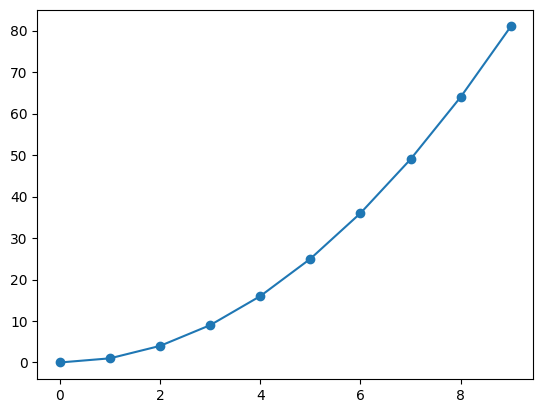

In [25]:
x=np.arange(0,10)
plt.plot(x,x**2,marker='o')

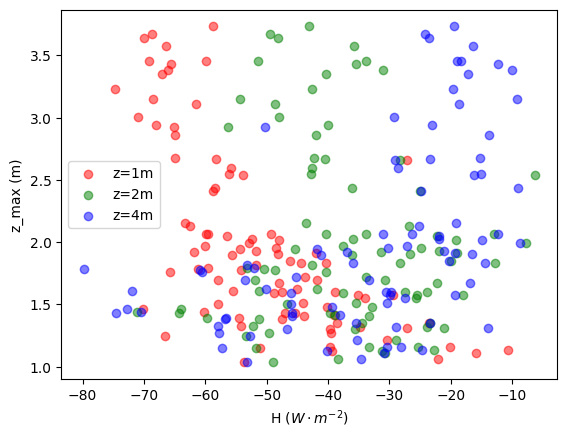

In [26]:
fig=plt.figure()
plt.scatter(T2_1_K['H'].values,Ds_z_max['z_max'].values,color='r',label='z=1m',alpha=0.5)
plt.scatter(T2_2_K['H'].values,Ds_z_max['z_max'].values,color='g',label='z=2m',alpha=0.5)
plt.scatter(T2_3_K['H'].values,Ds_z_max['z_max'].values,color='b',label='z=4m',alpha=0.5)
plt.ylabel(r"z_max (m)")
plt.xlabel(r"H ($W\cdot m^{-2}$)") 
plt.legend()

<xarray.Dataset>
Dimensions:                  (temps: 360, freq: 50)
Coordinates:
  * temps                    (temps) datetime64[ns] 2023-09-01T00:30:00 ... 2...
  * freq                     (freq) float64 0.0006104 nan nan ... 7.489 9.11
Data variables: (12/96)
    daytime                  (temps) int64 ...
    Tau                      (temps) float64 ...
    qc_Tau                   (temps) int64 ...
    H                        (temps) float64 ...
    qc_H                     (temps) int64 ...
    H_strg                   (temps) float64 ...
    ...                       ...
    f_C_wts_norm             (freq, temps) float64 ...
    f_Su                     (freq, temps) float64 ...
    f_Sv                     (freq, temps) float64 ...
    f_Sw                     (freq, temps) float64 ...
    f_Sts                    (freq, temps) float64 ...
    f_C_wts                  (freq, temps) float64 ...
nombre échantillons sélectionnés : 48 sur 360
dont <uw> < 0  partout : 23
dont <uw> 

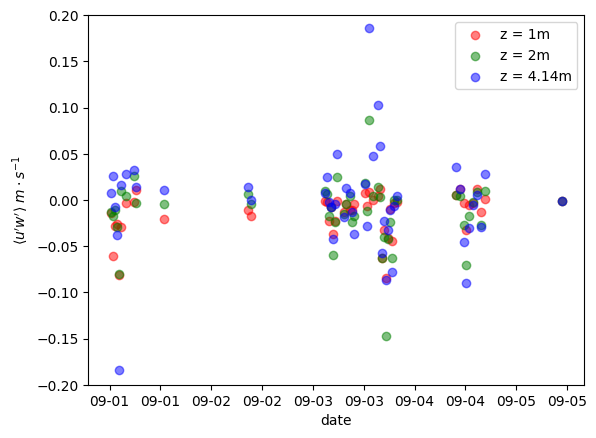

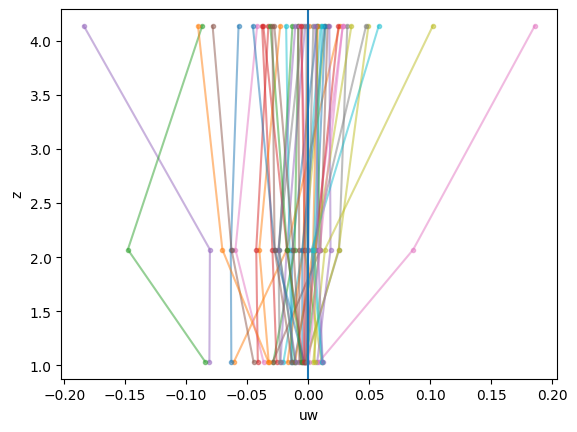

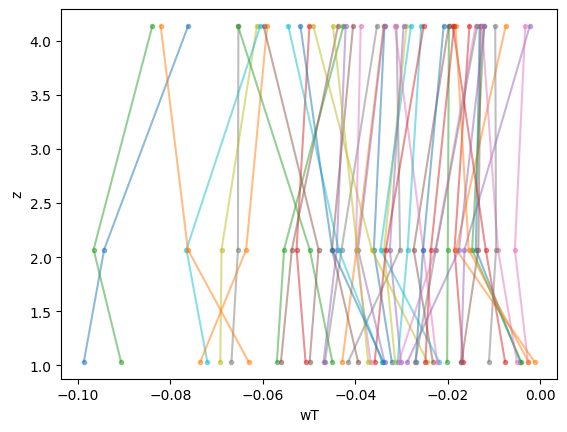

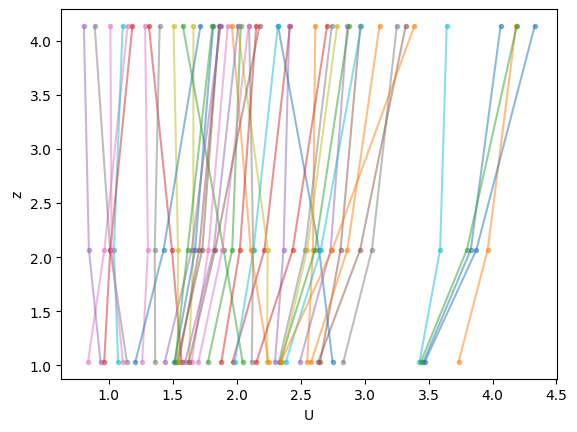

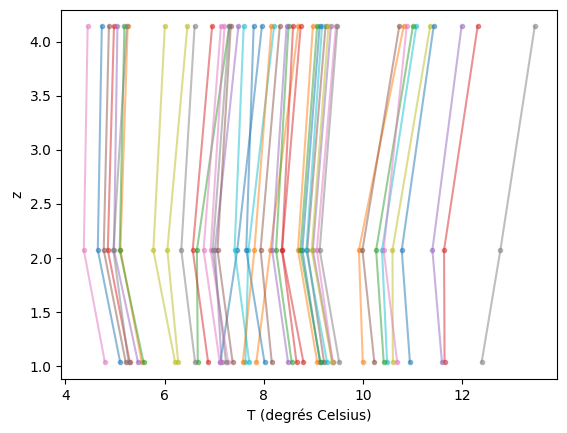

...

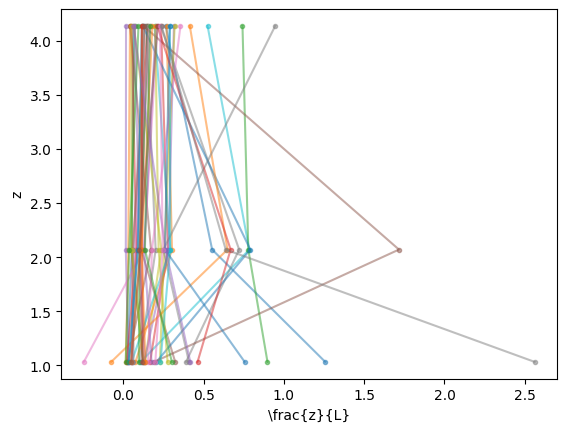

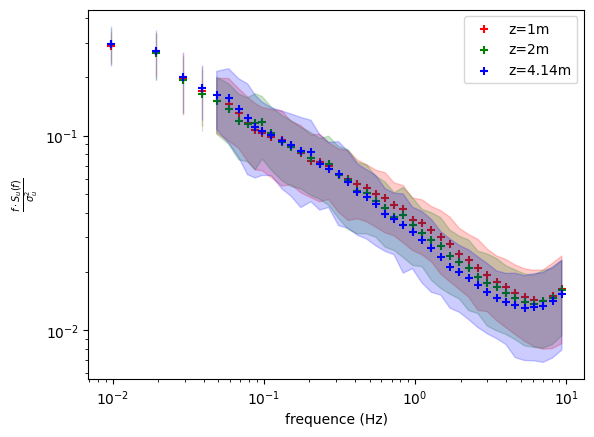

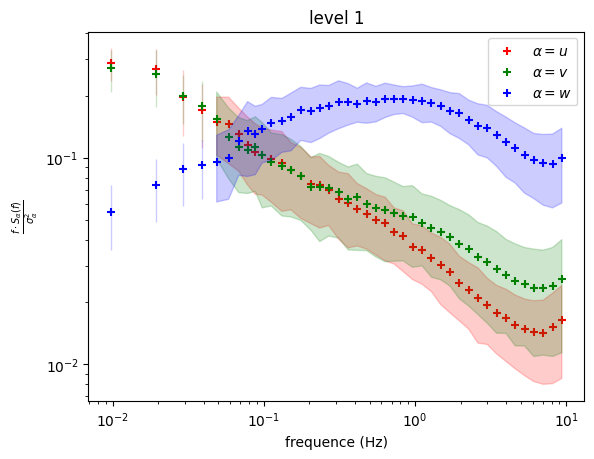

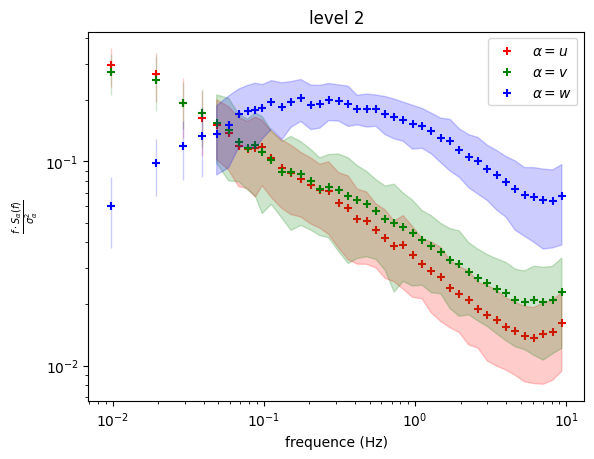

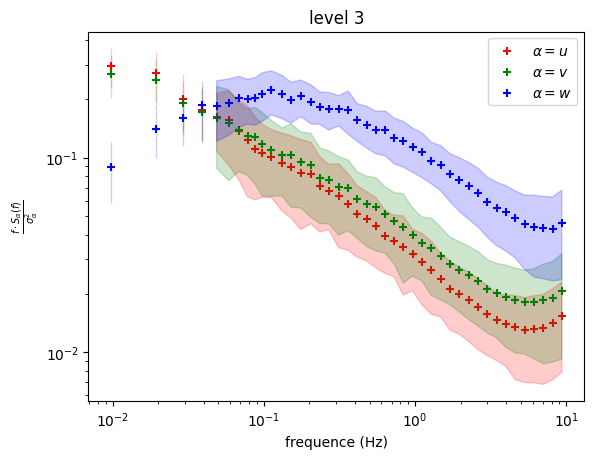

In [27]:
#periode perturbée
#on choisir une période où le vent ne souffle que dans la direction de la vallée
tmin_trunc=np.datetime64("2023-09-03 00:00:00")
tmax_trunc=np.datetime64("2023-09-04 00:00:00")

T2_1_2min_trunc_2=T2_1_2min.copy()#.sel(temps=slice(tmin_trunc,tmax_trunc))
T2_2_2min_trunc_2=T2_2_2min.copy()#.sel(temps=slice(tmin_trunc,tmax_trunc))
T2_3_2min_trunc_2=T2_3_2min.copy()#.sel(temps=slice(tmin_trunc,tmax_trunc))

T2_1_30min_trunc_2=T2_1_30min.copy()#.sel(temps=slice(tmin_trunc,tmax_trunc))
T2_2_30min_trunc_2=T2_2_30min.copy()#.sel(temps=slice(tmin_trunc,tmax_trunc))
T2_3_30min_trunc_2=T2_3_30min.copy()#.sel(temps=slice(tmin_trunc,tmax_trunc))
print(T2_1_30min_trunc_2)


T2_1_2min_moy_2=T2_1_2min_trunc_2.coarsen(temps=15,side='left',boundary='trim').mean()
T2_2_2min_moy_2=T2_2_2min_trunc_2.coarsen(temps=15,side='left',boundary='trim').mean()
T2_3_2min_moy_2=T2_3_2min_trunc_2.coarsen(temps=15,side='left',boundary='trim').mean()

flag_dir=(T2_1_2min_moy_2['wind_dir'] <= (200-30))|(T2_1_2min_moy_2['wind_dir']>= (200+30))
flag_uw_neg=(T2_1_2min_moy_2['wu_cov'] <= 0)&(T2_2_2min_moy_2['wu_cov'] <= 0)&(T2_3_2min_moy_2['wu_cov'] <= 0)


T2_1_2min_moy_sel=T2_1_2min_moy_2.where(flag_dir,drop=True)
T2_2_2min_moy_sel=T2_2_2min_moy_2.where(flag_dir,drop=True)
T2_3_2min_moy_sel=T2_3_2min_moy_2.where(flag_dir,drop=True)

print(f"nombre échantillons sélectionnés : {T2_1_2min_moy_sel.coords['temps'].size} sur {T2_1_2min_moy_2.coords['temps'].size}")
print(f"dont <uw> < 0  partout : {T2_1_2min_moy_sel.where(flag_dir & flag_uw_neg,drop=True).coords['temps'].size}")
print(f"dont <uw> > 0  partout : {T2_1_2min_moy_sel.where(flag_dir & ~flag_uw_neg,drop=True).coords['temps'].size}")


date_format=mpl.dates.DateFormatter("%m-%d")
fig=plt.figure()
ax=fig.add_subplot(111)

ax.scatter(T2_1_2min_moy_sel.coords['temps'].values,T2_1_2min_moy_sel['wu_cov'].values,
         color='r',label='z = 1m',alpha=0.5)
ax.scatter(T2_2_2min_moy_sel.coords['temps'].values,T2_2_2min_moy_sel['wu_cov'].values,
         color='g',label='z = 2m',alpha=0.5)
ax.scatter(T2_3_2min_moy_sel.coords['temps'].values,T2_3_2min_moy_sel['wu_cov'].values,
         color='b',label='z = 4.14m',alpha=0.5)
ax.xaxis.set_major_formatter(date_format)
ax.set_xlabel("date")
ax.set_ylabel(r"$\langle u'w' \rangle$ $m\cdot s^{-1}$")
ax.set_ylim(-0.2,0.2)
ax.legend()

fig=plt.figure()
for i in range(0,T2_1_2min_moy_sel.coords['temps'].size):
    plt.plot([T2_1_2min_moy_sel['wu_cov'].values[i],
              T2_2_2min_moy_sel['wu_cov'].values[i],
              T2_3_2min_moy_sel['wu_cov'].values[i]],
             [T2_1_2min_moy_sel['instrument_height'].values[i],
              T2_2_2min_moy_sel['instrument_height'].values[i],
              T2_3_2min_moy_sel['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('uw')
plt.ylabel('z')
plt.axvline(0)

fig=plt.figure()
for i in range(0,T2_1_2min_moy_sel.coords['temps'].size):
    plt.plot([T2_1_2min_moy_sel['wts_cov'].values[i],
              T2_2_2min_moy_sel['wts_cov'].values[i],
              T2_3_2min_moy_sel['wts_cov'].values[i]],
             [T2_1_2min_moy_sel['instrument_height'].values[i],
              T2_2_2min_moy_sel['instrument_height'].values[i],
              T2_3_2min_moy_sel['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('wT')
plt.ylabel('z')
#plt.axvline(0)


fig=plt.figure()
for i in range(0,T2_1_2min_moy_sel.coords['temps'].size):
    #U_i_1=np.sqrt(T2_1_K['u_mean'].values[i]**2+T2_1_K['v_mean'].values[i]**2)
    #U_i_2=np.sqrt(T2_2_K['u_mean'].values[i]**2+T2_2_K['v_mean'].values[i]**2)
    #U_i_3=np.sqrt(T2_3_K['u_mean'].values[i]**2+T2_3_K['v_mean'].values[i]**2)
    U_i_1=T2_1_2min_moy_sel['u_rot'].values[i]
    U_i_2=T2_2_2min_moy_sel['u_rot'].values[i]
    U_i_3=T2_3_2min_moy_sel['u_rot'].values[i]
    plt.plot([U_i_1,
              U_i_2,
              U_i_3],
             [T2_1_2min_moy_sel['instrument_height'].values[i],
              T2_2_2min_moy_sel['instrument_height'].values[i],
              T2_3_2min_moy_sel['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('U')
plt.ylabel('z')
fig=plt.figure()
for i in range(0,T2_1_2min_moy_sel.coords['temps'].size):
    plt.plot([T2_1_2min_moy_sel['air_temperature'].values[i]-273.15,
              T2_2_2min_moy_sel['air_temperature'].values[i]-273.15,
              T2_3_2min_moy_sel['air_temperature'].values[i]-273.15],
             [T2_1_2min_moy_sel['instrument_height'].values[i],
              T2_2_2min_moy_sel['instrument_height'].values[i],
              T2_3_2min_moy_sel['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('T (degrés Celsius)')
plt.ylabel('z')

fig=plt.figure()
for i in range(0,T2_1_2min_moy_sel.coords['temps'].size):
    plt.plot([T2_1_2min_moy_sel['TKE'].values[i],
              T2_2_2min_moy_sel['TKE'].values[i],
              T2_3_2min_moy_sel['TKE'].values[i]],
             [T2_1_2min_moy_sel['instrument_height'].values[i],
              T2_2_2min_moy_sel['instrument_height'].values[i],
              T2_3_2min_moy_sel['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel('tke')
plt.ylabel('z')
fig=plt.figure()
for i in range(0,T2_1_2min_moy_sel.coords['temps'].size):
    plt.plot([T2_1_2min_moy_sel['zL'].values[i],
              T2_2_2min_moy_sel['zL'].values[i],
              T2_3_2min_moy_sel['zL'].values[i]],
             [T2_1_2min_moy_sel['instrument_height'].values[i],
              T2_2_2min_moy_sel['instrument_height'].values[i],
              T2_3_2min_moy_sel['instrument_height'].values[i]],alpha=0.5,marker='.')
plt.xlabel(r'\frac{z}{L}')
plt.ylabel('z')

def plot_spectre(Da,**kwargs):
    "trace un spectre moyenné avec l'écart type. Plagié sur le notebook Stabilite_T2_TO5-V3"
    Da_moy=Da.mean('temps')
    Da_std=Da.std('temps')
    freq=Da_moy.coords['freq'].values
    #plt.plot(freq,Da_moy.values,**kwargs)
    plt.scatter(freq,Da_moy.values,marker='+',**kwargs)
    plt.fill_between(freq,
                     Da_moy.values-Da_std.values,
                     Da_moy.values+Da_std.values,alpha=0.2,color=kwargs['color'])

print(T2_3_2min_moy_sel.coords['temps'].values)
fig=plt.figure()
plot_spectre(T2_1_2min_moy_sel['f_Su_norm'],color='r',label='z=1m')
plot_spectre(T2_2_2min_moy_sel['f_Su_norm'],color='g',label='z=2m')
plot_spectre(T2_3_2min_moy_sel['f_Su_norm'],color='b',label='z=4.14m')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('frequence (Hz)')
plt.ylabel(r"$\frac{f\cdot S_u(f)}{\sigma_u^2}$")
plt.legend()

fig=plt.figure()
plt.title("level 1")
plot_spectre(T2_1_2min_moy_sel['f_Su_norm'],color='r',label=r'$\alpha=u$')
plot_spectre(T2_1_2min_moy_sel['f_Sv_norm'],color='g',label=r'$\alpha=v$')
plot_spectre(T2_1_2min_moy_sel['f_Sw_norm'],color='b',label=r'$\alpha=w$')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('frequence (Hz)')
plt.ylabel(r"$\frac{f\cdot S_\alpha(f)}{\sigma_\alpha^2}$")
plt.legend()

fig=plt.figure()
plt.title("level 2")
plot_spectre(T2_2_2min_moy_sel['f_Su_norm'],color='r',label=r'$\alpha=u$')
plot_spectre(T2_2_2min_moy_sel['f_Sv_norm'],color='g',label=r'$\alpha=v$')
plot_spectre(T2_2_2min_moy_sel['f_Sw_norm'],color='b',label=r'$\alpha=w$')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('frequence (Hz)')
plt.ylabel(r"$\frac{f\cdot S_\alpha(f)}{\sigma_\alpha^2}$")
plt.legend()

fig=plt.figure()
plt.title("level 3")
plot_spectre(T2_3_2min_moy_sel['f_Su_norm'],color='r',label=r'$\alpha=u$')
plot_spectre(T2_3_2min_moy_sel['f_Sv_norm'],color='g',label=r'$\alpha=v$')
plot_spectre(T2_3_2min_moy_sel['f_Sw_norm'],color='b',label=r'$\alpha=w$')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('frequence (Hz)')
plt.ylabel(r"$\frac{f\cdot S_\alpha(f)}{\sigma_\alpha^2}$")
plt.legend()

Text(0, 0.5, '$z$')

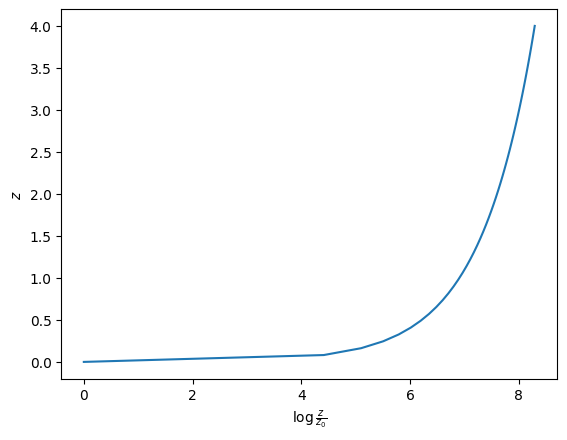

In [28]:
z0=0.001
z=np.linspace(z0,4)
plt.plot(np.log(z/z0),z)
plt.xlabel(r"$\log{\frac{z}{z_0}}$")
plt.ylabel(r"$z$")

In [29]:
print(Ds_z_max['z_max'].values)

[2.67819041 2.85788327 2.94224504 3.15273271 2.15629077 2.06105714
 1.79441225 1.97018392 1.37873709 1.43750101 2.40831851 3.45611946
 2.92326395 1.89788403 1.94977086 2.01426662 1.903529   1.6681702
 1.31704827 1.40672404 1.48236508 1.12241371 1.03405762 1.24161322
 1.152268   1.50157321 1.3023839  1.32276299 1.15754499 1.30636299
 1.15568341 1.1353775  1.06058389 1.41211226 2.04847398 2.06326773
 2.1326117  1.91993532 1.78095973 1.75693379 1.60627794 1.46269788
 1.43365504 1.5919838  1.42759768 1.38768399 1.69873757 1.81726942
 1.77886066 2.02658456 2.43154294 3.73262405 2.59627198 1.94087226
 2.54254728 3.10658686 2.6707479  1.92836962 1.90933957 1.8439238
 1.59776494 1.597902   1.82849623 1.99242953 2.0640391  2.53551216
 3.43006679 3.63695267 3.57238145 3.34632811 3.38191499 3.45206183
 3.66721839 3.23165638 3.00364128 2.65546442 1.50918311 1.34789045
 1.34805796 1.57130819 1.5478457  1.69492579 1.57230291 1.21446082
 1.10501837 1.26688562 1.62033885 1.8293121  1.71820726]


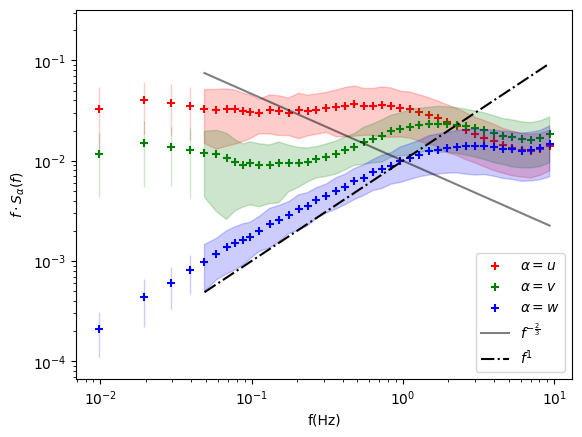

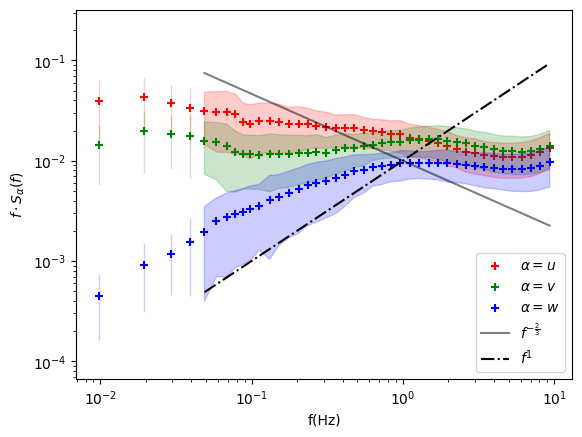

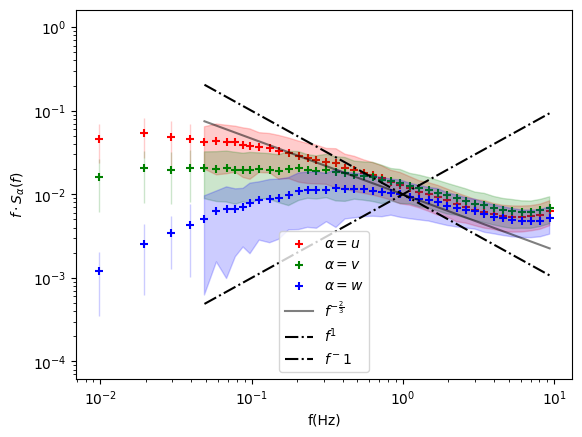

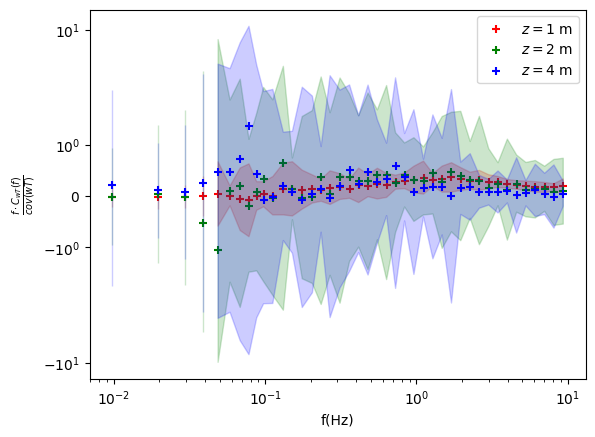

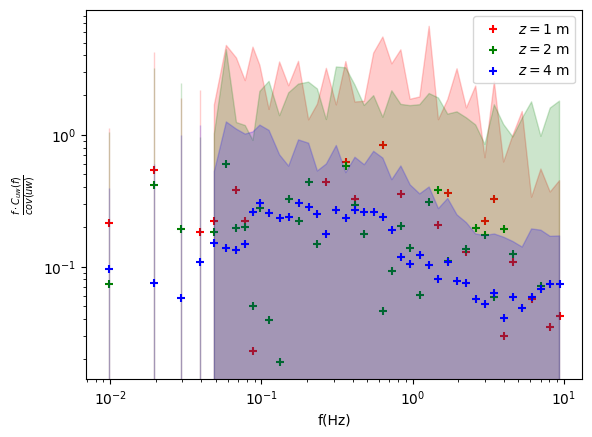

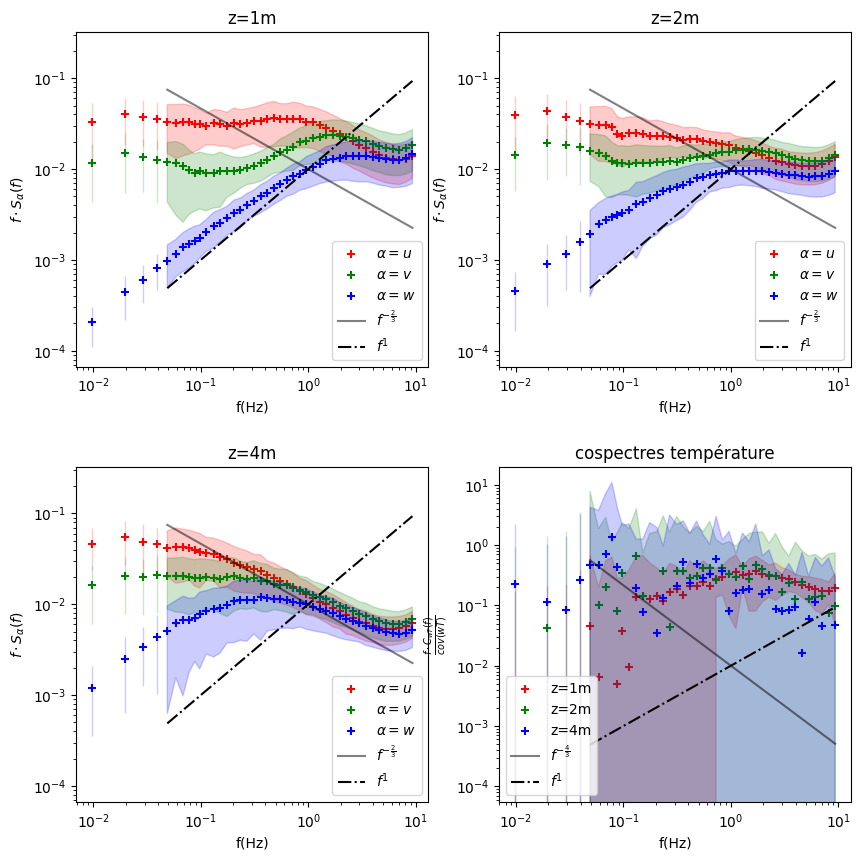

In [30]:
#pour ignorer les warnings (Numpy n'aime pas lorsqu'il y a des NaN !)
import warnings
warnings.filterwarnings('ignore')

#visualisation des spectres en régime purement catabatique
#on prend des spectres calculés sur 30 minutes
tmin_K=np.datetime64("2023-09-07 15:00:00")
tmax_K=np.datetime64("2023-09-07 18:00:00")
"""
spectre_T2_1=spectres_1_30min.sel(temps=slice(tmin_K,tmax_K))
spectre_T2_2=spectres_2_30min.sel(temps=slice(tmin_K,tmax_K))
spectre_T2_3=spectres_3_30min.sel(temps=slice(tmin_K,tmax_K))
"""
#print(Ds_z_max.where(Ds_z_max['z_max'] <= 2))
flag_z_max=lambda x:((Ds_z_max['z_max'] <= x) & ~np.isnan(Ds_z_max['z_max']))
#flag_z_max=lambda x:Ds_z_max.where(Ds_z_max['z_max'] <= x,other=False)
#print(f"flag_z_max(2) {flag_z_max(2)}")
#print(f"valeurs {flag_z_max(2)['z_max'].values}")
#print(f"flag_z_max['z_max'].values.size {flag_z_max(2)['z_max'].values.size}")
#print(f"T2_1_K.coords['temps'].values.size {T2_1_K.coords['temps'].values.size}")
spectre_1_moy=T2_1_K.mean('temps')
spectre_1_std=T2_1_K.std('temps')
"""
def plot_spectre(Da,**kwargs):
    "trace un spectre moyenné avec l'écart type. Plagié sur le notebook Stabilite_T2_TO5-V3"
    Da_moy=Da.mean('temps')
    Da_std=Da.std('temps')
    freq=Da_moy.coords['freq'].values
    #plt.plot(freq,Da_moy.values,**kwargs)
    plt.scatter(freq,Da_moy.values,marker='+',**kwargs)
    plt.fill_between(freq,
                     Da_moy.values-Da_std.values,
                     Da_moy.values+Da_std.values,alpha=0.2,color=kwargs['color'])
"""
def plot_spectre(Da,axis=None,scatter=True, xscale='log',yscale='log',**kwargs):
    "trace un spectre moyenné avec l'écart type. Plagié sur le notebook Stabilite_T2_TO5-V3"
    Da_moy=Da.mean('temps')
    Da_std=Da.std('temps')
    freq=Da_moy.coords['freq'].values
    if scatter:
        plt.scatter(freq,Da_moy.values,marker='+',**kwargs)
    else:
        plt.plot(freq,Da_moy.values,marker='+',**kwargs)
    plt.fill_between(freq,
                     Da_moy.values-Da_std.values,
                     Da_moy.values+Da_std.values,alpha=0.2,color=kwargs['color'])
    plt.xscale(xscale)
    plt.yscale(yscale)

spectre_2_moy=T2_2_K.mean('temps')
spectre_2_std=T2_2_K.std('temps')

spectre_3_moy=T2_3_K.mean('temps')
spectre_3_std=T2_3_K.std('temps')

#On regarde les spectres selon que le max de vent soit situé
#entre 1 et 2m ou entre 2 et 4m !
#print(T2_1_K)
#print(Ds_z_max)

T2_1_K_12=T2_1_K.where(flag_z_max(2.0) , drop=True)
T2_2_K_12=T2_2_K.where(flag_z_max(2.0) , drop=True)
T2_3_K_12=T2_3_K.where(flag_z_max(2.0) , drop=True)

T2_1_K_24=T2_1_K.where(~flag_z_max(2.0) , drop=True)
T2_2_K_24=T2_2_K.where(~flag_z_max(2.0) , drop=True)
T2_3_K_24=T2_3_K.where(~flag_z_max(2.0) , drop=True)

#print(T2_1_K_12)
#print(T2_1_K_24)

T2_1_K_12_moy = T2_1_K_12.mean('temps')
T2_1_K_12_std = T2_1_K_12.std('temps')
T2_2_K_12_moy = T2_2_K_12.mean('temps')
T2_2_K_12_std = T2_2_K_12.std('temps')
T2_3_K_12_moy = T2_3_K_12.mean('temps')
T2_3_K_12_std = T2_3_K_12.std('temps')

T2_1_K_24_moy = T2_1_K_24.mean('temps')
T2_1_K_24_std = T2_1_K_24.std('temps')
T2_2_K_24_moy = T2_2_K_24.mean('temps')
T2_2_K_24_std = T2_2_K_24.std('temps')
T2_3_K_24_moy = T2_3_K_24.mean('temps')
T2_3_K_24_std = T2_3_K_24.std('temps')


freq=spectre_1_moy.coords['freq'].values

def scatter_spectre(Da,**kwargs):
    for i in range(0,Da.coords['temps'].size):
        plt.scatter(Da.coords['freq'].values, Da.isel(temps=i).values,**kwargs)

fig=plt.figure()
#plt.title("niveau 1")
plot_spectre(T2_1_K['f_Su'],color='r',label=r"$\alpha=u$")
#scatter_spectre(T2_1_K['f_Su'],color='r',alpha=0.02)

plot_spectre(T2_1_K['f_Sv'],color='g',label=r"$\alpha=v$")
#scatter_spectre(T2_1_K['f_Sv'],color='g',alpha=0.02)
plot_spectre(T2_1_K['f_Sw'],color='b',label=r"$\alpha=w$")
#scatter_spectre(T2_1_K['f_Sw'],color='b',alpha=0.02)

plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$f\cdot S_\alpha(f)$")
plt.legend()
plt.savefig(repertoire_figures+"level_1_Salpha_moy.png")


fig=plt.figure()
#plt.title("niveau 2")
plot_spectre(T2_2_K['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_2_K['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_2_K['f_Sw'],color='b',label=r"$\alpha=w$")

plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$f\cdot S_\alpha(f)$")
plt.legend()
plt.savefig(repertoire_figures+"level_2_Salpha_moy.png")

fig=plt.figure()
#plt.title("niveau 3")
plot_spectre(T2_3_K['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_3_K['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_3_K['f_Sw'],color='b',label=r"$\alpha=w$")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
plt.plot(freq,0.01*freq**-1,color='k',linestyle='-.',label=r"$f^-1$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$f\cdot S_\alpha(f)$")
plt.legend()
plt.savefig(repertoire_figures+"level_3_Salpha_moy.png")


fig=plt.figure()
plot_spectre(T2_1_K['f_C_wts_norm'],color='r',label=r"$z=1$ m")
plot_spectre(T2_2_K['f_C_wts_norm'],color='g',label=r"$z=2$ m")
plot_spectre(T2_3_K['f_C_wts_norm'],color='b',label=r"$z=4$ m")
plt.xscale('log')
plt.yscale('symlog')
plt.xlabel('f(Hz)')
plt.ylabel(r"$\frac{f\cdot C_{wT}(f)}{cov(wT)}$")
plt.legend()
plt.savefig(repertoire_figures+"level_all_CwT_moy.png")
#print(T2_1_K_12)
#print(T2_1_K_24)

fig=plt.figure()
plot_spectre(T2_1_K['f_C_wu_norm'],color='r',label=r"$z=1$ m")
plot_spectre(T2_2_K['f_C_wu_norm'],color='g',label=r"$z=2$ m")
plot_spectre(T2_3_K['f_C_wu_norm'],color='b',label=r"$z=4$ m")
plt.xscale('log')
#plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$\frac{f\cdot C_{uw}(f)}{cov(uw)}$")
plt.legend()

#print(spectre_1_moy_12)
#print(spectre_1_moy_24)
fig=plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0.3)
ax=fig.add_subplot(221)
ax.set_title("z=1m")
plot_spectre(T2_1_K['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_1_K['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_1_K['f_Sw'],color='b',label=r"$\alpha=w$")
#plot_spectre(T2_1_K['f_Sts'],color='c',label=r"$\alpha=Ts$")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
ax.set_xlabel('f(Hz)')
ax.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax.legend()
ax2=fig.add_subplot(222)
ax2.set_title("z=2m")
plot_spectre(T2_2_K['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_2_K['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_2_K['f_Sw'],color='b',label=r"$\alpha=w$")
#plot_spectre(T2_2_K['f_Sts'],color='c',label=r"$\alpha=Ts$")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
ax2.set_xlabel('f(Hz)')
ax2.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax2.legend()
ax3=fig.add_subplot(223)
ax3.set_title("z=4m")
plot_spectre(T2_3_K['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_3_K['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_3_K['f_Sw'],color='b',label=r"$\alpha=w$")
#plot_spectre(T2_3_K['f_Sts'],color='c',label=r"$\alpha=Ts$")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
ax3.set_xlabel('f(Hz)')
ax3.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax3.legend()
#ax4=fig.add_subplot(224)
#ax4.set_title(r"spectres température") 
#plot_spectre(T2_1_K['f_Sts'],color='r',label='z=1m')
#plot_spectre(T2_2_K['f_Sts'],color='g',label='z=2m')
#plot_spectre(T2_3_K['f_Sts'],color='b',label='z=4m')
#plt.plot(freq,0.01*freq**(-4.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{4}{3}}$")
#plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
#ax4.set_xlabel('f(Hz)')
#ax4.set_ylabel(r"$f\cdot S_{T}(f)$")
#ax4.legend()
ax4=fig.add_subplot(224)
ax4.set_title(r"cospectres température") 
plot_spectre(T2_1_K['f_C_wts_norm'],color='r',label='z=1m')
plot_spectre(T2_2_K['f_C_wts_norm'],color='g',label='z=2m')
plot_spectre(T2_3_K['f_C_wts_norm'],color='b',label='z=4m')
plt.plot(freq,0.01*freq**(-4.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{4}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
ax4.set_xlabel('f(Hz)')
ax4.set_ylabel(r"$\frac{f\cdot C_{wT}(f)}{cov(wT)}$")
ax4.legend()
#plt.savefig(repertoire_figures+"grid_spectra_all.png")

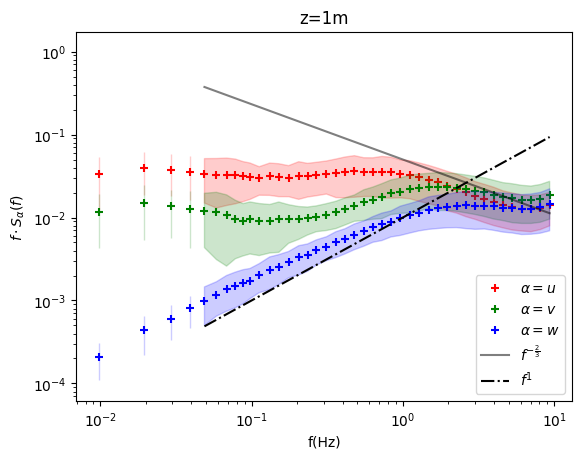

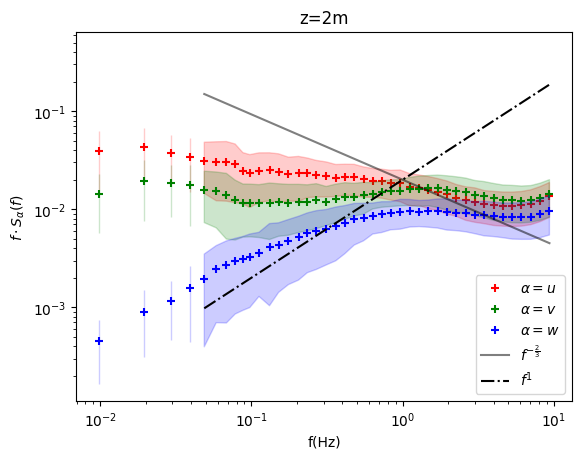

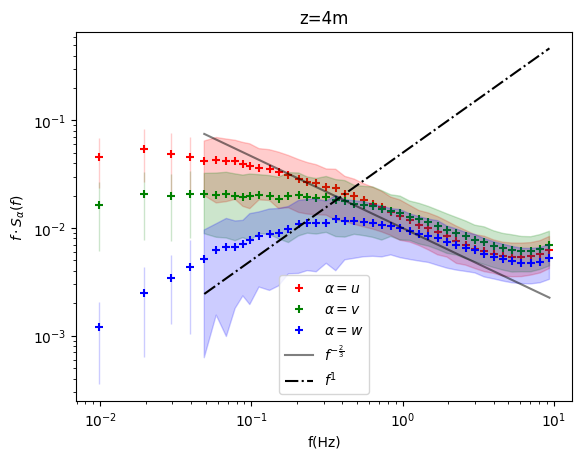

In [68]:
fig=plt.figure()
ax=fig.add_subplot(111)
ax.set_title("z=1m")
plot_spectre(T2_1_K['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_1_K['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_1_K['f_Sw'],color='b',label=r"$\alpha=w$")
#plot_spectre(T2_1_K['f_Sts'],color='c',label=r"$\alpha=Ts$")
plt.plot(freq,0.05*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
ax.set_xlabel('f(Hz)')
ax.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax.legend()
plt.savefig(repertoire_figures+r"T2_1_spectres.png")

fig=plt.figure()
ax=fig.add_subplot(111)
ax.set_title("z=2m")
plot_spectre(T2_2_K['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_2_K['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_2_K['f_Sw'],color='b',label=r"$\alpha=w$")
#plot_spectre(T2_1_K['f_Sts'],color='c',label=r"$\alpha=Ts$")
plt.plot(freq,0.02*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.02*freq,color='k',linestyle='-.',label=r"$f^1$")
ax.set_xlabel('f(Hz)')
ax.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax.legend()
plt.savefig(repertoire_figures+r"T2_2_spectres.png")

fig=plt.figure()
ax=fig.add_subplot(111)
ax.set_title("z=4m")
plot_spectre(T2_3_K['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_3_K['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_3_K['f_Sw'],color='b',label=r"$\alpha=w$")
#plot_spectre(T2_1_K['f_Sts'],color='c',label=r"$\alpha=Ts$")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.05*freq,color='k',linestyle='-.',label=r"$f^1$")
ax.set_xlabel('f(Hz)')
ax.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax.legend()
plt.savefig(repertoire_figures+r"T2_3_spectres.png")

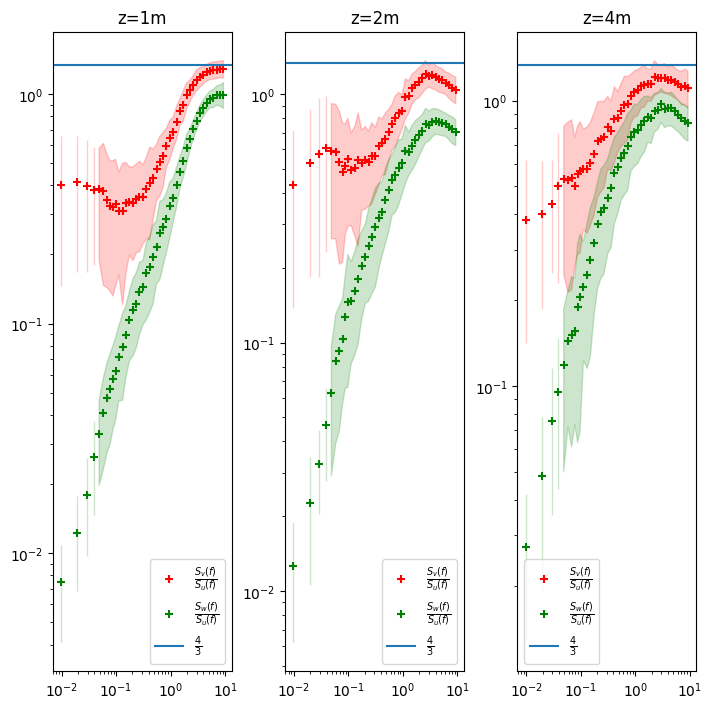

In [31]:

fig=plt.figure(figsize=(8.3,8.3))
fig.subplots_adjust(wspace=0.3)
ax1=fig.add_subplot(131)
plt.title("z=1m")
plot_spectre(T2_1_K['f_Sv']/T2_1_K['f_Su'], color='r', label=r"$\frac{S_v(f)}{S_u(f)}$")
plot_spectre(T2_1_K['f_Sw']/T2_1_K['f_Su'], color='g', label=r"$\frac{S_w(f)}{S_u(f)}$")
plt.axhline(4/3, label=r"$\frac{4}{3}$")
plt.xscale('log')
plt.yscale('log')
plt.legend()
ax2=fig.add_subplot(132)
plt.title("z=2m")
plot_spectre(T2_2_K['f_Sv']/T2_2_K['f_Su'], color='r', label=r"$\frac{S_v(f)}{S_u(f)}$")
plot_spectre(T2_2_K['f_Sw']/T2_2_K['f_Su'], color='g', label=r"$\frac{S_w(f)}{S_u(f)}$")
plt.axhline(4/3, label=r"$\frac{4}{3}$")
plt.xscale('log')
plt.yscale('log')
plt.legend()
ax3=fig.add_subplot(133)
plt.title("z=4m")
plot_spectre(T2_3_K['f_Sv']/T2_3_K['f_Su'], color='r', label=r"$\frac{S_v(f)}{S_u(f)}$")
plot_spectre(T2_3_K['f_Sw']/T2_3_K['f_Su'], color='g', label=r"$\frac{S_w(f)}{S_u(f)}$")
plt.axhline(4/3, label=r"$\frac{4}{3}$")
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.savefig(repertoire_figures+"rapport_spectres.png")

In [32]:
def Kansas_spectra(f,S_alpha,A=0.164,freq_min=1.0,freq_max=10.0):
    flag_freq=(f>= freq_min)&(f<=freq_max)
    plage_spectre=S_alpha[flag_freq]
    plage_freq=f[flag_freq]
    S_inertiel=lambda x, a:a*x**(-2.0/3.0)
    x_fit=scipy.optimize.curve_fit(S_inertiel,plage_freq,plage_spectre,nan_policy='omit')[0]
    f_0=x_fit**(3.0/2.0)
    f_norm=f/f_0
    S_alpha_ref=A*f_norm/(1.0+A*(f_norm**(5.0/3.0)))
    return S_alpha_ref

def plot_Kansas_spectra(Da,color=None,label=None,linestyle='-.',**kwargs):
    f=Da.coords['freq'].values
    spectra=Kansas_spectra(f,Da.values,**kwargs)
    plt.plot(f,spectra,color=color,label=label,linestyle=linestyle)

def plot_Kansas_cospectra(Da,color=None,label=None,linestyle='-.',**kwargs):
    f=Da.coords['freq'].values
    spectra=Kansas_cospectra(f,Da.values,**kwargs)
    plt.plot(f,spectra,color=color,label=label,linestyle=linestyle)


def Kansas_cospectra(f,C_alpha,B=0.88,C=1.5,freq_min=1.0,freq_max=10.0):
    flag_freq=(f>= freq_min)&(f<=freq_max)
    plage_spectre=C_alpha[flag_freq]
    plage_freq=f[flag_freq]
    C_inertiel=lambda x, a: a*x**(-2.1)
    x_fit=scipy.optimize.curve_fit(C_inertiel,plage_freq,plage_spectre,nan_policy='omit')[0]
    f_0=x_fit**(3.0/2.0)
    f_norm=f/f_0
    C_alpha_fit=B*f_norm/(1.0+C*(f_norm**2.1))
    return C_alpha_fit

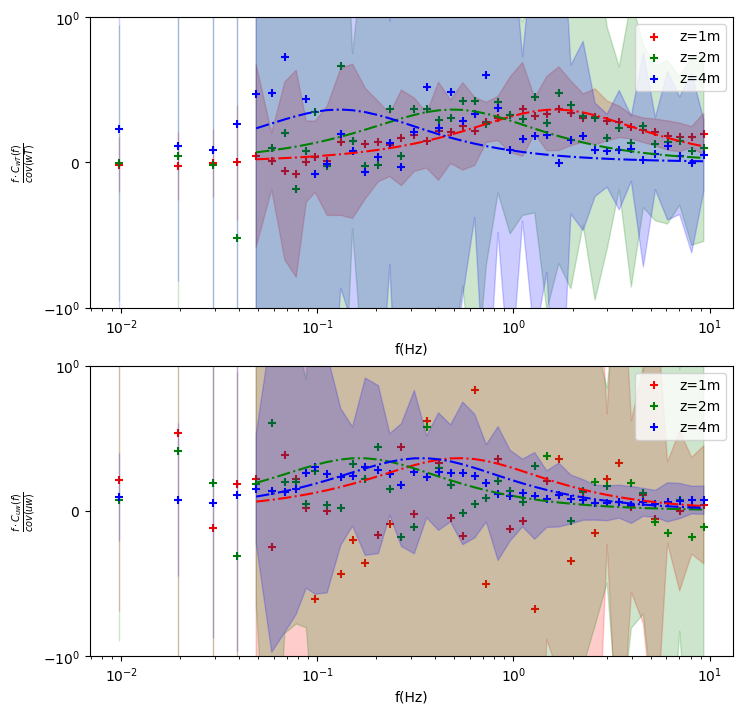

In [33]:
fig=plt.figure(figsize=(8.3,8.3))
fig.subplots_adjust(wspace=0.3)
ax1=fig.add_subplot(211)
plot_spectre(T2_1_K['f_C_wts_norm'],yscale='symlog',color='r', label="z=1m")
plot_spectre(T2_2_K['f_C_wts_norm'],yscale='symlog',color='g', label="z=2m")
plot_spectre(T2_3_K['f_C_wts_norm'],yscale='symlog',color='b', label="z=4m")

plot_Kansas_cospectra(T2_1_K['f_C_wts_norm'].mean('temps'),freq_min=1.5,color='r')
plot_Kansas_cospectra(T2_2_K['f_C_wts_norm'].mean('temps'),color='g')
plot_Kansas_cospectra(T2_3_K['f_C_wts_norm'].mean('temps'),color='b')

plt.ylim(-1,1)
plt.xlabel('f(Hz)')
plt.ylabel(r"$\frac{f\cdot C_{wT}(f)}{cov(wT)}$")
plt.legend()
ax2=plt.subplot(212)
plot_spectre(T2_1_K['f_C_wu_norm'],yscale='symlog',color='r', label="z=1m")
plot_spectre(T2_2_K['f_C_wu_norm'],yscale='symlog',color='g', label="z=2m")
plot_spectre(T2_3_K['f_C_wu_norm'],yscale='symlog',color='b', label="z=4m")

plot_Kansas_cospectra(T2_1_K['f_C_wu_norm'].mean('temps'),freq_min=2,color='r')
plot_Kansas_cospectra(T2_2_K['f_C_wu_norm'].mean('temps'),color='g')
plot_Kansas_cospectra(T2_3_K['f_C_wu_norm'].mean('temps'),freq_min=2,color='b')

plt.legend()
plt.ylim(-1,1)
plt.xlabel('f(Hz)')
plt.ylabel(r"$\frac{f\cdot C_{uw}(f)}{cov(uw)}$")

plt.savefig(repertoire_figures+r"cospectra_T2_all.png")

Text(0.5, 0, '$l_{injection}$ (m)')

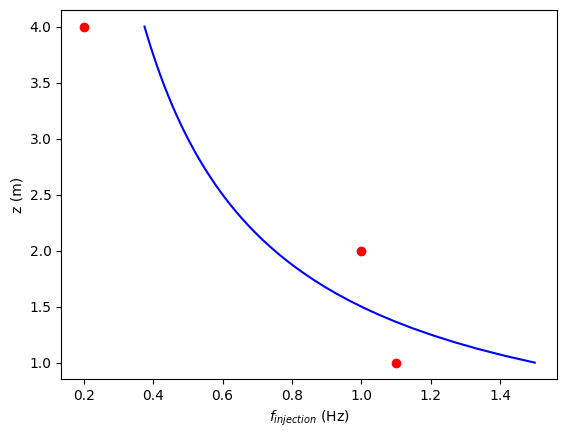

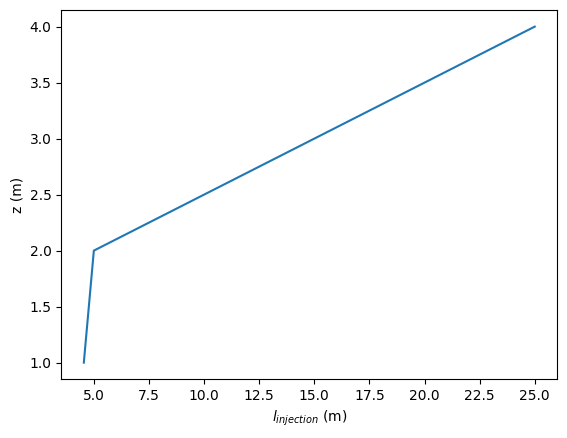

In [34]:
fig=plt.figure()
f_i=np.array([1.1,1.0, 0.2])
u_m=5.0#m/s
z_i=u_m/f_i
z=np.array([1,2,4])
z_theo=np.linspace(1,4)
courbe_theo=0.3*u_m/z_theo
plt.scatter([1.1,1.0, 0.2], z,color='r')
plt.plot(courbe_theo,z_theo,color='b')
plt.ylabel("z (m)")
plt.xlabel(r"$f_{injection}$ (Hz)")
fig=plt.figure()
plt.plot(z_i, [1,2,4])
plt.ylabel("z (m)")
plt.xlabel(r"$l_{injection}$ (m)")

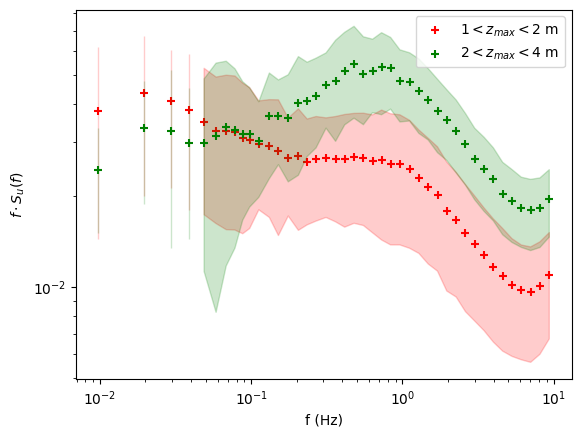

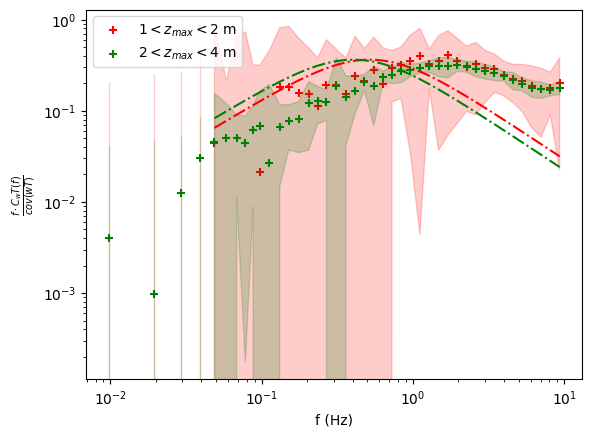

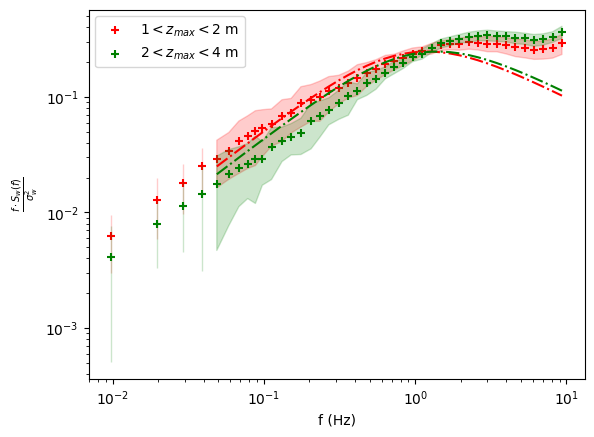

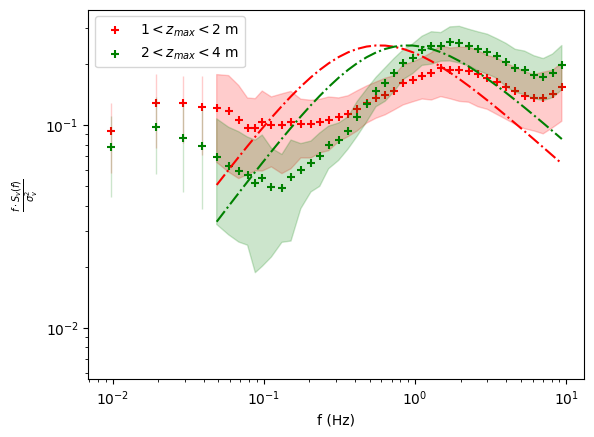

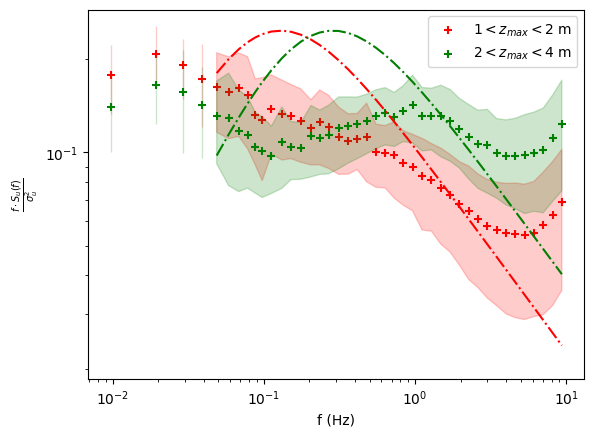

...

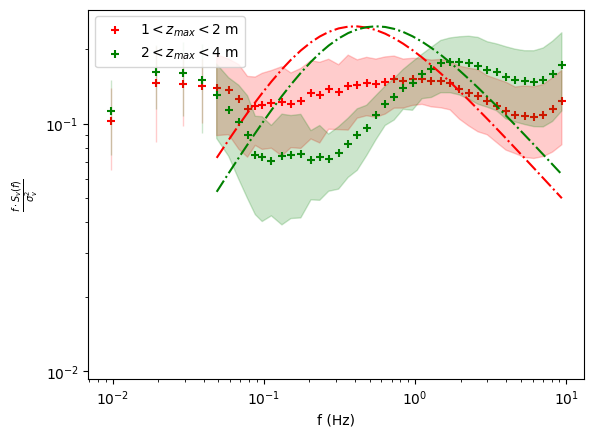

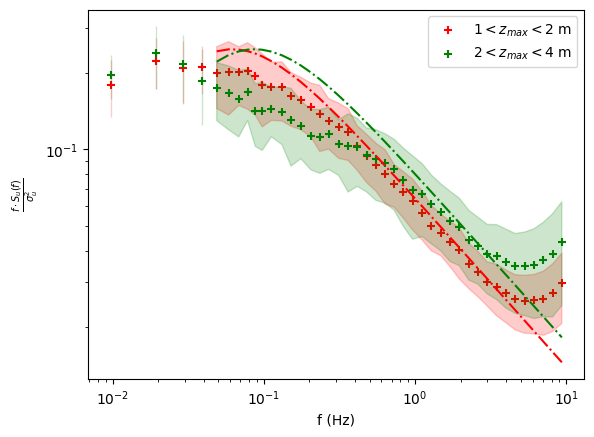

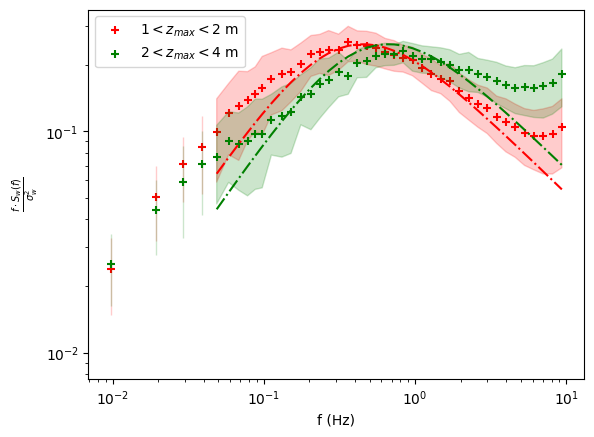

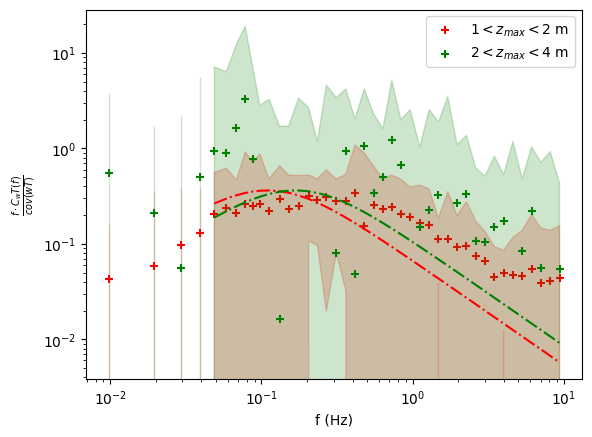

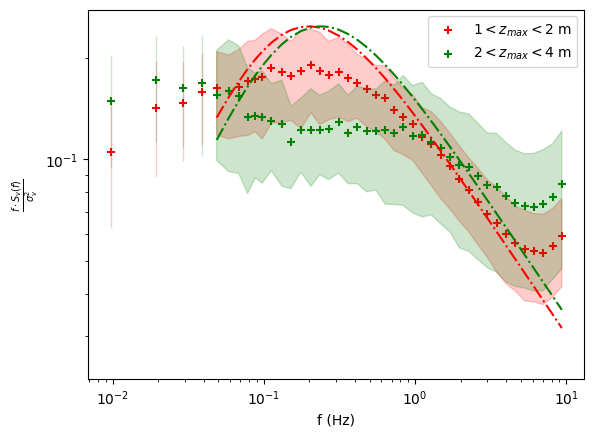

In [35]:
#Tracé des spectres selon la position du maximum de vent : entre 1 et 2 m, entre 2 et 4 m
fig=plt.figure()
#plt.title(r"niveau 1 : spectre u")
plot_spectre(T2_1_K_12['f_Su'],color='r', label=r"$1 < z_{max} < 2$ m")
#plot_Kansas_spectra(T2_1_K_12_moy['f_Su_norm'],color='r')

plot_spectre(T2_1_K_24['f_Su'],color='g', label=r"$2 < z_{max} < 4$ m")
#plot_Kansas_spectra(T2_1_K_24_moy['f_Su_norm'],color='g')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
#plt.ylabel(r"$\frac{f\cdot S_u(f)}{\sigma_u^2}$")
plt.ylabel(r"$f\cdot S_u(f)$")
plt.legend()
plt.savefig(repertoire_figures+"level_1_Su_Kansas.png")


fig=plt.figure()
#plt.title(r"niveau 1 : cospectre wT")
plot_spectre(T2_1_K_12['f_C_wts_norm'],color='r', label=r"$1 < z_{max} < 2$ m")
plot_Kansas_cospectra(T2_1_K_12_moy['f_C_wts_norm'],color='r')

plot_spectre(T2_1_K_24['f_C_wts_norm'],color='g', label=r"$2 < z_{max} < 4$ m")
plot_Kansas_cospectra(T2_1_K_24_moy['f_C_wts_norm'],color='g')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot C_wT(f)}{cov(wT)}$")
plt.legend()
plt.savefig(repertoire_figures+"level_1_CwT_Kansas.png")


fig=plt.figure()
#plt.title(r"niveau 1 : spectre w")
plot_spectre(T2_1_K_12['f_Sw_norm'],color='r', label=r"$1 < z_{max} < 2$ m")
plot_Kansas_spectra(T2_1_K_12_moy['f_Sw_norm'],color='r')

plot_spectre(T2_1_K_24['f_Sw_norm'],color='g', label=r"$2 < z_{max} < 4$ m")
plot_Kansas_spectra(T2_1_K_24_moy['f_Sw_norm'],color='g')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_w(f)}{\sigma_w^2}$")
plt.legend()
plt.savefig(repertoire_figures+"level_1_w_Kansas.png")

fig=plt.figure()
#plt.title(r"niveau 1 : spectre v")
plot_spectre(T2_1_K_12['f_Sv_norm'],color='r', label=r"$1 < z_{max} < 2$ m")
plot_Kansas_spectra(T2_1_K_12_moy['f_Sv_norm'],color='r')

plot_spectre(T2_1_K_24['f_Sv_norm'],color='g', label=r"$2 < z_{max} < 4$ m")
plot_Kansas_spectra(T2_1_K_24_moy['f_Sv_norm'],color='g')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_v(f)}{\sigma_v^2}$")
plt.legend()
plt.savefig(repertoire_figures+"level_1_v_Kansas.png")



fig=plt.figure()
#plt.title(r"$\frac{f\cdot S_{u}(f)}{\sigma_u^2}$ niveau 2")
plot_spectre(T2_2_K_12['f_Su_norm'],color='r', label=r"$1 < z_{max} < 2$ m")
plot_Kansas_spectra(T2_2_K_12_moy['f_Su_norm'],color='r',freq_min=1.0,freq_max=5.0)

plot_spectre(T2_2_K_24['f_Su_norm'],color='g', label=r"$2 < z_{max} < 4$ m")
plot_Kansas_spectra(T2_2_K_24_moy['f_Su_norm'],color='g',freq_min=1.0,freq_max=5.0)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_u(f)}{\sigma_u^2}$")
plt.legend()
plt.savefig(repertoire_figures+"level_2_Su_Kansas.png")


fig=plt.figure()
#plt.title(r"niveau 2 : spectre w")
plot_spectre(T2_2_K_12['f_Sw_norm'],color='r', label=r"$1 < z_{max} < 2$ m")
plot_Kansas_spectra(T2_2_K_12_moy['f_Sw_norm'],color='r')

plot_spectre(T2_2_K_24['f_Sw_norm'],color='g', label=r"$2 < z_{max} < 4$ m")
plot_Kansas_spectra(T2_2_K_24_moy['f_Sw_norm'],color='g')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_w(f)}{\sigma_w^2}$")
plt.legend()
plt.savefig(repertoire_figures+"level_2_Sw_Kansas.png")

fig=plt.figure()
#plt.title(r"niveau 2 : cospectre wT")
plot_spectre(T2_2_K_12['f_C_wts_norm'],color='r', label=r"$1 < z_{max} < 2$ m")
plot_Kansas_cospectra(T2_2_K_12_moy['f_C_wts_norm'],color='r')

plot_spectre(T2_2_K_24['f_C_wts_norm'],color='g', label=r"$2 < z_{max} < 4$ m$2 < z_{max} < 4$ m")
plot_Kansas_cospectra(T2_2_K_24_moy['f_C_wts_norm'],color='g')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot C_{wT}(f)}{cov(wT)}$")
plt.legend()
plt.savefig(repertoire_figures+"level_2_CwT_Kansas.png")

fig=plt.figure()
#plt.title(r"niveau 1 : spectre v")
plot_spectre(T2_2_K_12['f_Sv_norm'],color='r', label=r"$1 < z_{max} < 2$ m")
plot_Kansas_spectra(T2_2_K_12_moy['f_Sv_norm'],color='r')

plot_spectre(T2_2_K_24['f_Sv_norm'],color='g', label=r"$2 < z_{max} < 4$ m")
plot_Kansas_spectra(T2_2_K_24_moy['f_Sv_norm'],color='g')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_v(f)}{\sigma_v^2}$")
plt.legend()
plt.savefig(repertoire_figures+"level_2_v_Kansas.png")


fig=plt.figure()
#plt.title(r"$\frac{f\cdot S_{u}(f)}{\sigma_u^2}$ niveau 3")
plot_spectre(T2_3_K_12['f_Su_norm'],color='r', label=r"$1 < z_{max} < 2$ m")
plot_Kansas_spectra(T2_3_K_12_moy['f_Su_norm'],color='r')

plot_spectre(T2_3_K_24['f_Su_norm'],color='g', label=r"$2 < z_{max} < 4$ m")
plot_Kansas_spectra(T2_3_K_24_moy['f_Su_norm'],color='g')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_u(f)}{\sigma_u^2}$")
plt.legend()
plt.savefig(repertoire_figures+"level_3_Su_Kansas.png")

fig=plt.figure()
#plt.title(r"niveau 3 : spectre w")
plot_spectre(T2_3_K_12['f_Sw_norm'],color='r', label=r"$1 < z_{max} < 2$ m")
plot_Kansas_spectra(T2_3_K_12_moy['f_Sw_norm'],color='r')

plot_spectre(T2_3_K_24['f_Sw_norm'],color='g', label=r"$2 < z_{max} < 4$ m")
plot_Kansas_spectra(T2_3_K_24_moy['f_Sw_norm'],color='g')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_w(f)}{\sigma_w^2}$")
plt.legend()
plt.savefig(repertoire_figures+"level_3_Sw_Kansas.png")

fig=plt.figure()
#plt.title(r"niveau 3 : cospectre wT")
plot_spectre(T2_3_K_12['f_C_wts_norm'],color='r', label=r"$1 < z_{max} < 2$ m")
plot_Kansas_cospectra(T2_3_K_12_moy['f_C_wts_norm'],color='r')

plot_spectre(T2_3_K_24['f_C_wts_norm'],color='g', label=r"$2 < z_{max} < 4$ m")
plot_Kansas_cospectra(T2_3_K_24_moy['f_C_wts_norm'],color='g')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot C_wT(f)}{cov(wT)}$")
plt.legend()
plt.savefig(repertoire_figures+"level_3_CwT_Kansas.png")

fig=plt.figure()
#plt.title(r"niveau 1 : spectre v")
plot_spectre(T2_3_K_12['f_Sv_norm'],color='r', label=r"$1 < z_{max} < 2$ m")
plot_Kansas_spectra(T2_3_K_12_moy['f_Sv_norm'],color='r')

plot_spectre(T2_3_K_24['f_Sv_norm'],color='g', label=r"$2 < z_{max} < 4$ m")
plot_Kansas_spectra(T2_3_K_24_moy['f_Sv_norm'],color='g')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_v(f)}{\sigma_v^2}$")
plt.legend()
plt.savefig(repertoire_figures+"level_3_v_Kansas.png")


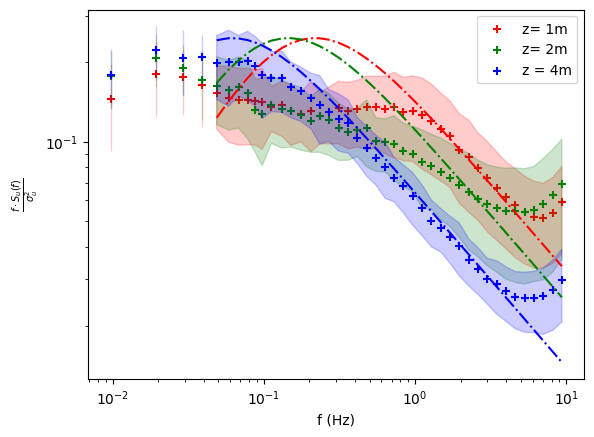

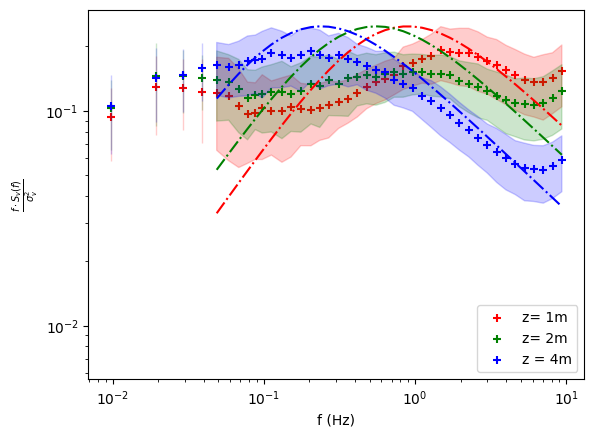

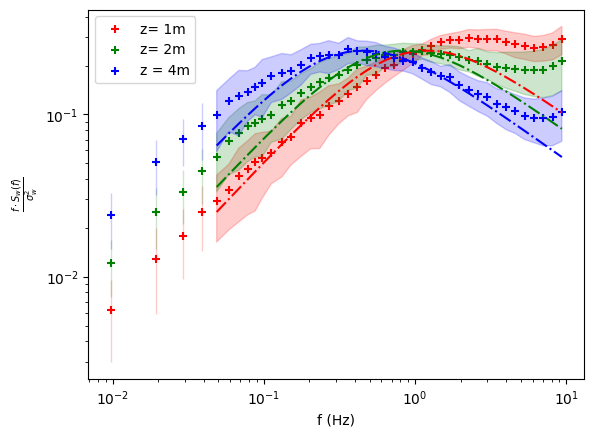

In [36]:
fig=plt.figure()
#plt.title(r"$\frac{f\cdot S_u(f)}{\sigma_u^2}$ pour $z_{max} < 2m$")
plot_spectre(T2_1_K_12['f_Su_norm'],color='r', label=r"z= 1m")
plot_Kansas_spectra(T2_1_K_12_moy['f_Su_norm'],color='r')

plot_spectre(T2_2_K_12['f_Su_norm'],color='g', label=r"z= 2m")
plot_Kansas_spectra(T2_2_K_12_moy['f_Su_norm'],color='g')

plot_spectre(T2_3_K_12['f_Su_norm'],color='b', label=r"z = 4m")
plot_Kansas_spectra(T2_3_K_12_moy['f_Su_norm'],color='b')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_u(f)}{\sigma_u^2}$")
plt.legend()
plt.savefig(repertoire_figures+"level12_all_Su_Kansas.png")

fig=plt.figure()
#plt.title(r"$\frac{f\cdot S_v(f)}{\sigma_v^2}$ pour $z_{max} > 2m$")
plot_spectre(T2_1_K_12['f_Sv_norm'],color='r', label=r"z= 1m")
plot_Kansas_spectra(T2_1_K_24_moy['f_Sv_norm'],color='r')

plot_spectre(T2_2_K_12['f_Sv_norm'],color='g', label=r"z= 2m")
plot_Kansas_spectra(T2_2_K_24_moy['f_Sv_norm'],color='g')

plot_spectre(T2_3_K_12['f_Sv_norm'],color='b', label=r"z = 4m")
plot_Kansas_spectra(T2_3_K_24_moy['f_Sv_norm'],color='b')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_v(f)}{\sigma_v^2}$")
plt.legend()
plt.savefig(repertoire_figures+"level12_all_Sv_Kansas.png")

fig=plt.figure()
#plt.title(r"$\frac{f\cdot S_w(f)}{\sigma_w^2}$ pour $z_{max} < 2m$")
plot_spectre(T2_1_K_12['f_Sw_norm'],color='r', label=r"z= 1m")
plot_Kansas_spectra(T2_1_K_12_moy['f_Sw_norm'],color='r')

plot_spectre(T2_2_K_12['f_Sw_norm'],color='g', label=r"z= 2m")
plot_Kansas_spectra(T2_2_K_12_moy['f_Sw_norm'],color='g')

plot_spectre(T2_3_K_12['f_Sw_norm'],color='b', label=r"z = 4m")
plot_Kansas_spectra(T2_3_K_12_moy['f_Sw_norm'],color='b')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_w(f)}{\sigma_w^2}$")
plt.legend()
plt.savefig(repertoire_figures+"level12_all_Sw_Kansas.png")


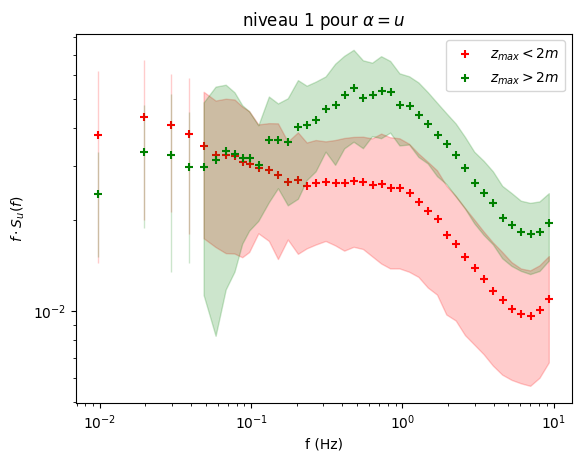

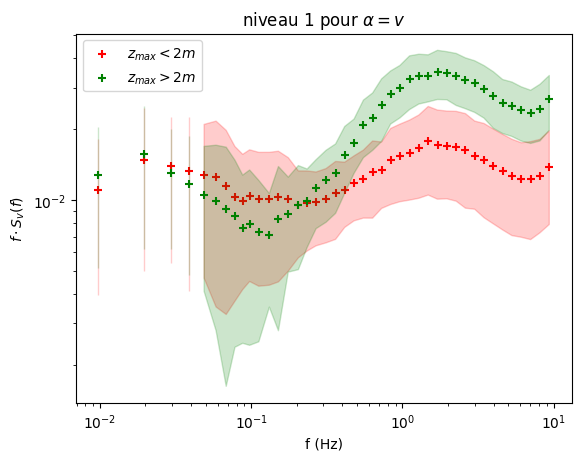

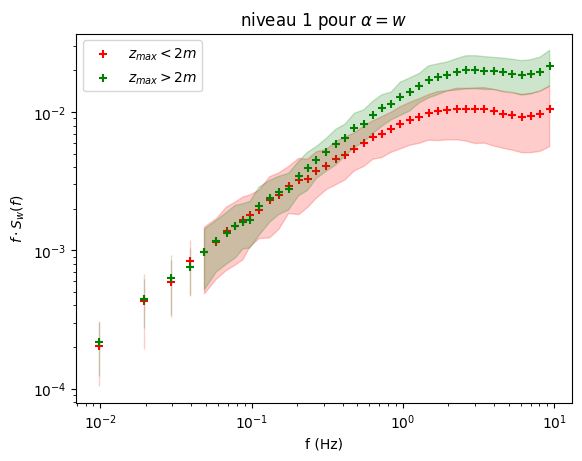

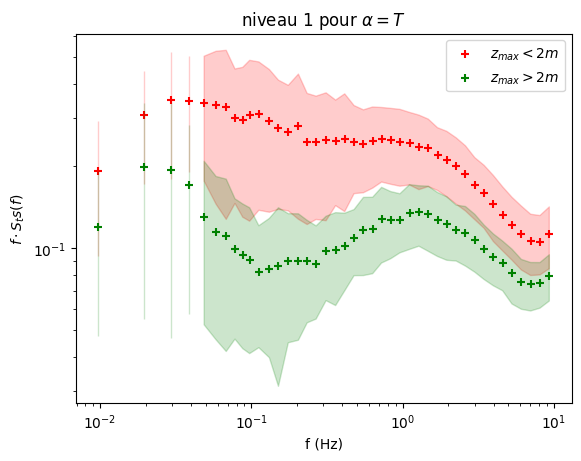

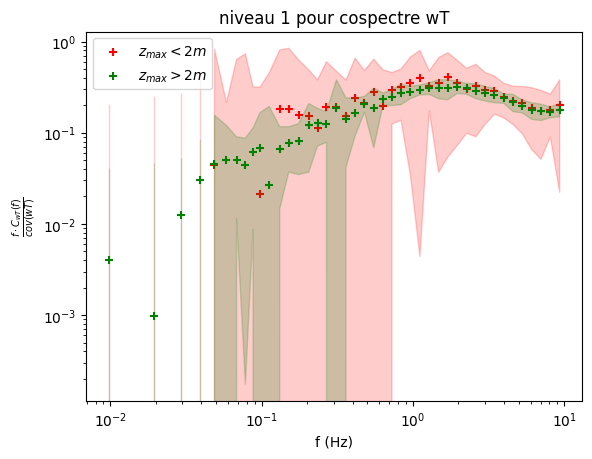

...

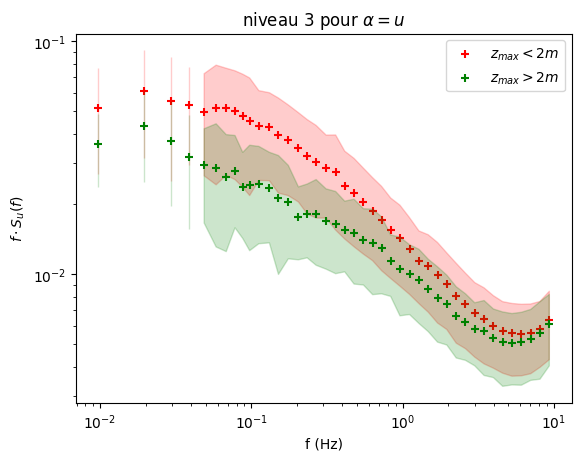

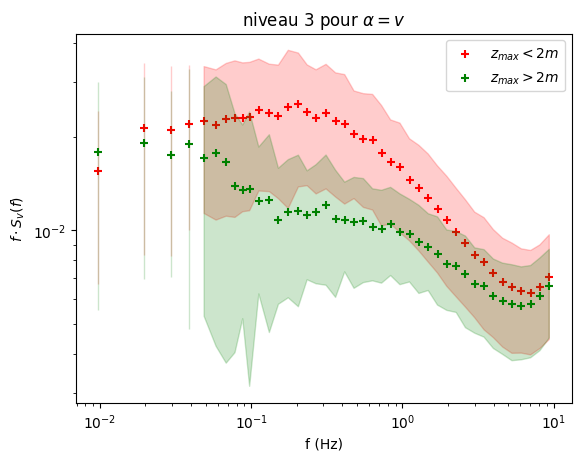

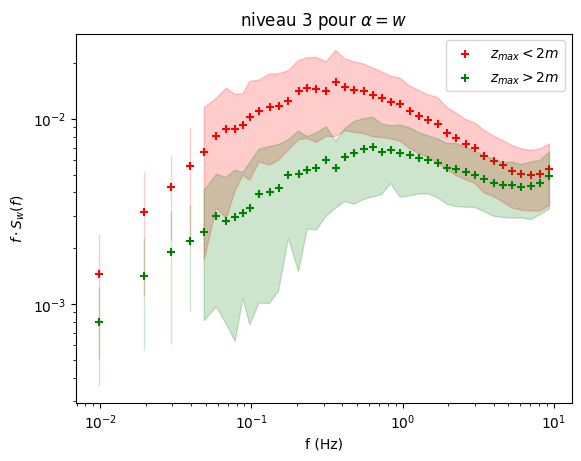

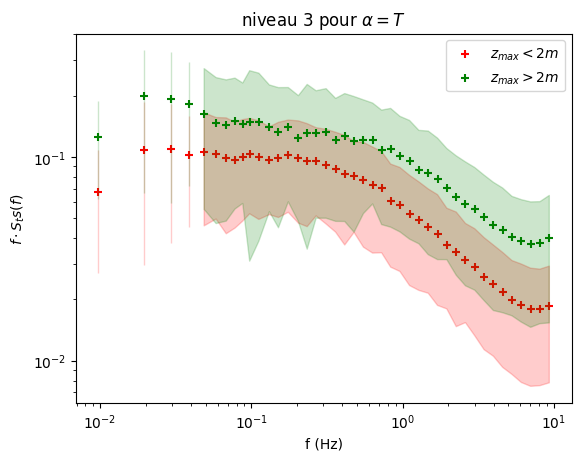

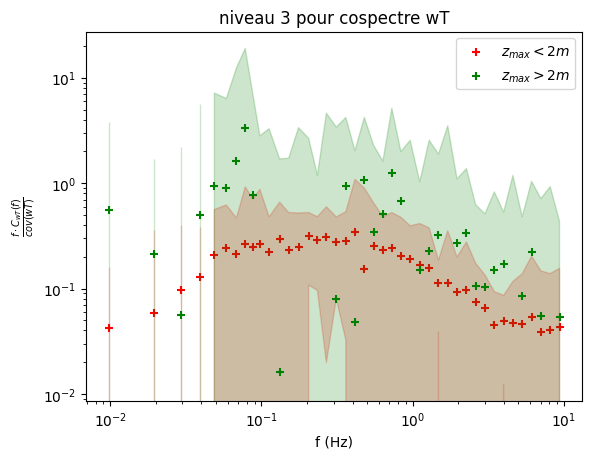

In [37]:
fig=plt.figure()
plt.title(r"niveau 1 pour $\alpha=u$")
plot_spectre(T2_1_K_12['f_Su'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_1_K_24['f_Su'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot S_u(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 1 pour $\alpha=v$")
plot_spectre(T2_1_K_12['f_Sv'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_1_K_24['f_Sv'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot S_v(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 1 pour $\alpha=w$")
plot_spectre(T2_1_K_12['f_Sw'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_1_K_24['f_Sw'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot S_w(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 1 pour $\alpha=T$")
plot_spectre(T2_1_K_12['f_Sts'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_1_K_24['f_Sts'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot S_ts(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 1 pour cospectre wT")
plot_spectre(T2_1_K_12['f_C_wts_norm'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_1_K_24['f_C_wts_norm'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot C_{wT}(f)}{cov(wT)}$")
plt.legend()



fig=plt.figure()
plt.title(r"niveau 2 pour $\alpha=u$")
plot_spectre(T2_2_K_12['f_Su'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_2_K_24['f_Su'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot S_u(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 2 pour $\alpha=v$")
plot_spectre(T2_2_K_12['f_Sv'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_2_K_24['f_Sv'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot S_v(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 2 pour $\alpha=w$")
plot_spectre(T2_2_K_12['f_Sw'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_2_K_24['f_Sw'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot S_w(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 2 pour $\alpha=T$")
plot_spectre(T2_2_K_12['f_Sts'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_2_K_24['f_Sts'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot S_ts(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 2 pour cospectre wT")
plot_spectre(T2_2_K_12['f_C_wts_norm'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_2_K_24['f_C_wts_norm'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot C_{wT}(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 3 pour $\alpha=u$")
plot_spectre(T2_3_K_12['f_Su'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_3_K_24['f_Su'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot S_u(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 3 pour $\alpha=v$")
plot_spectre(T2_3_K_12['f_Sv'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_3_K_24['f_Sv'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot S_v(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 3 pour $\alpha=w$")
plot_spectre(T2_3_K_12['f_Sw'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_3_K_24['f_Sw'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot S_w(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 3 pour $\alpha=T$")
plot_spectre(T2_3_K_12['f_Sts'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_3_K_24['f_Sts'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$f\cdot S_ts(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 3 pour cospectre wT")
plot_spectre(T2_3_K_12['f_C_wts_norm'],color='r', label=r"$z_{max} < 2m$")
plot_spectre(T2_3_K_24['f_C_wts_norm'],color='g', label=r"$z_{max} > 2m$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot C_{wT}(f)}{cov(wT)}$")
plt.legend()


In [ ]:
fig=plt.figure()
ax=fig.add_subplot(111)
ax.set_title(r"z=1m, $1 <= z_{max} < 2$ m")
plot_spectre(T2_1_K_12['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_1_K_12['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_1_K_12['f_Sw'],color='b',label=r"$\alpha=w$")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
ax.set_xlabel('f(Hz)')
ax.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax.legend()



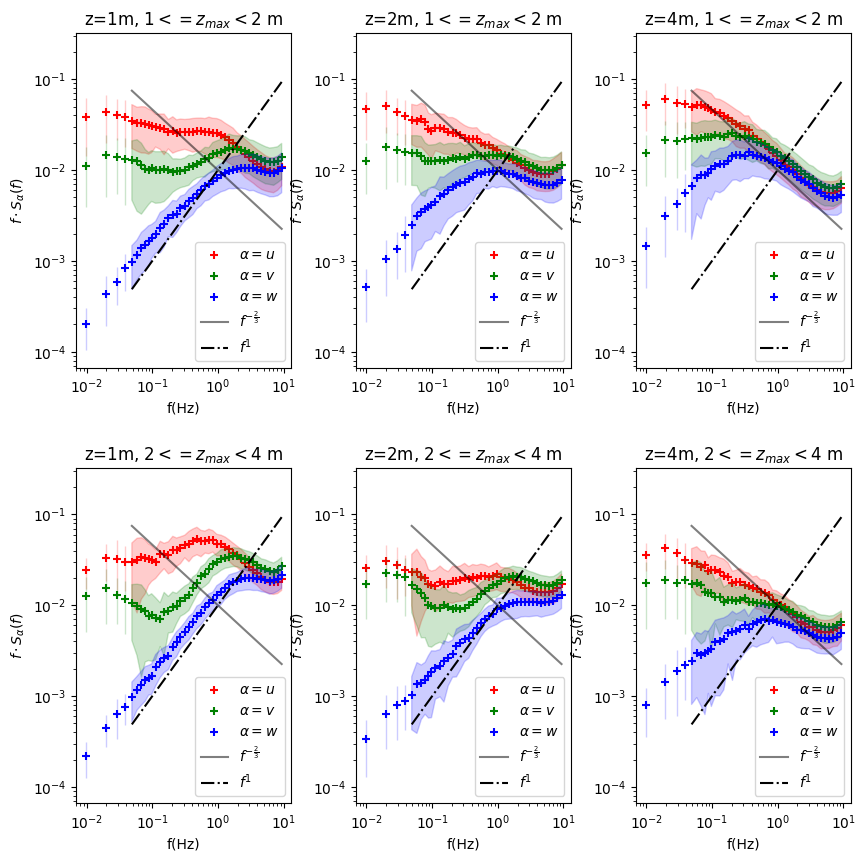

In [38]:
fig=plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0.3,wspace=0.3)
ax=fig.add_subplot(231)
ax.set_title(r"z=1m, $1 <= z_{max} < 2$ m")
plot_spectre(T2_1_K_12['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_1_K_12['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_1_K_12['f_Sw'],color='b',label=r"$\alpha=w$")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
ax.set_xlabel('f(Hz)')
ax.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax.legend()

ax2=fig.add_subplot(234)
ax2.set_title(r"z=1m, $2 <= z_{max} < 4$ m")
plot_spectre(T2_1_K_24['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_1_K_24['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_1_K_24['f_Sw'],color='b',label=r"$\alpha=w$")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
ax2.set_xlabel('f(Hz)')
ax2.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax2.legend()

ax3=fig.add_subplot(232)
ax3.set_title(r"z=2m, $1 <= z_{max} < 2$ m")
plot_spectre(T2_2_K_12['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_2_K_12['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_2_K_12['f_Sw'],color='b',label=r"$\alpha=w$")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
ax3.set_xlabel('f(Hz)')
ax3.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax3.legend()

ax4=fig.add_subplot(235)
ax4.set_title(r"z=2m, $2 <= z_{max} < 4$ m") 
plot_spectre(T2_2_K_24['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_2_K_24['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_2_K_24['f_Sw'],color='b',label=r"$\alpha=w$")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
ax4.set_xlabel('f(Hz)')
ax4.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax4.legend()

ax5=fig.add_subplot(233)
ax5.set_title(r"z=4m, $1 <= z_{max} < 2$ m") 
plot_spectre(T2_3_K_12['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_3_K_12['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_3_K_12['f_Sw'],color='b',label=r"$\alpha=w$")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
ax5.set_xlabel('f(Hz)')
ax5.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax5.legend()

ax6=fig.add_subplot(236)
ax6.set_title(r"z=4m, $2 <= z_{max} < 4$ m") 
plot_spectre(T2_3_K_24['f_Su'],color='r',label=r"$\alpha=u$")
plot_spectre(T2_3_K_24['f_Sv'],color='g',label=r"$\alpha=v$")
plot_spectre(T2_3_K_24['f_Sw'],color='b',label=r"$\alpha=w$")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$")
plt.plot(freq,0.01*freq,color='k',linestyle='-.',label=r"$f^1$")
ax6.set_xlabel('f(Hz)')
ax6.set_ylabel(r"$f\cdot S_\alpha(f)$")
ax6.legend()

<z_max>=1.997048941706586 m
std(z_max) = 0.7304083746966393


Text(0.5, 0, '$z_{max}$ (m)')

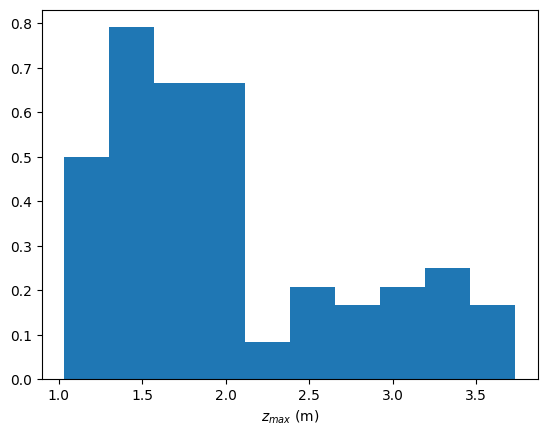

In [39]:
print(f"<z_max>={Ds_z_max.mean('temps')['z_max'].values} m")
print(f"std(z_max) = {Ds_z_max.std('temps')['z_max'].values}")
fig=plt.figure()
plt.hist(Ds_z_max['z_max'].values, density=True)
plt.xlabel(r"$z_{max}$ (m)")

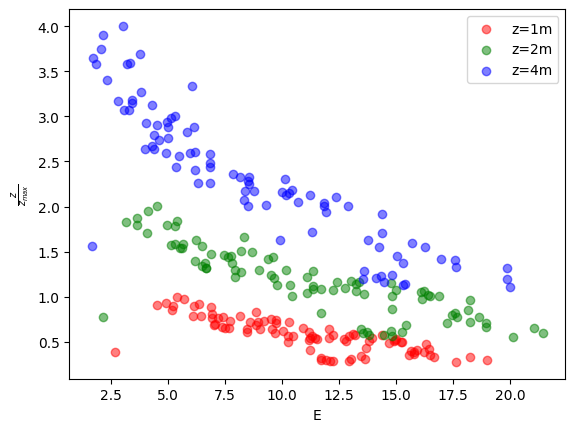

In [40]:
def E_tot(Ds):
    g=9.81
    N2=(g/Ds['ts_mean'])*(Ds['ts_mean']-273.15)/Ds['instrument_height']
    E=0.5*(Ds['u_rot']**2+Ds['u_var']+Ds['v_var']+Ds['w_var']+(g/Ds['ts_mean'])**2*Ds['ts_var']/N2)
    return E
fig=plt.figure()
plt.scatter(E_tot(T2_1_K).values, T2_1_K['instrument_height'].values/Ds_z_max['z_max'].values, alpha=0.5, label='z=1m', color='r')
plt.scatter(E_tot(T2_2_K).values, T2_2_K['instrument_height'].values/Ds_z_max['z_max'].values, alpha=0.5, label='z=2m', color='g')
plt.scatter(E_tot(T2_3_K).values, T2_3_K['instrument_height'].values/Ds_z_max['z_max'].values, alpha=0.5, label='z=4m', color='b')
plt.xlabel('E')
plt.ylabel(r"$\frac{z}{z_{max}}$")
plt.legend()

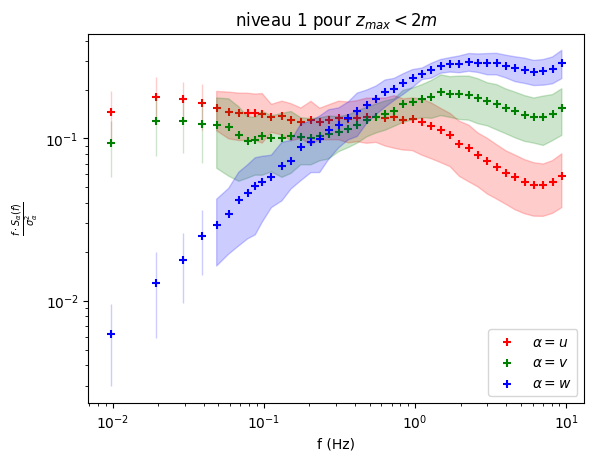

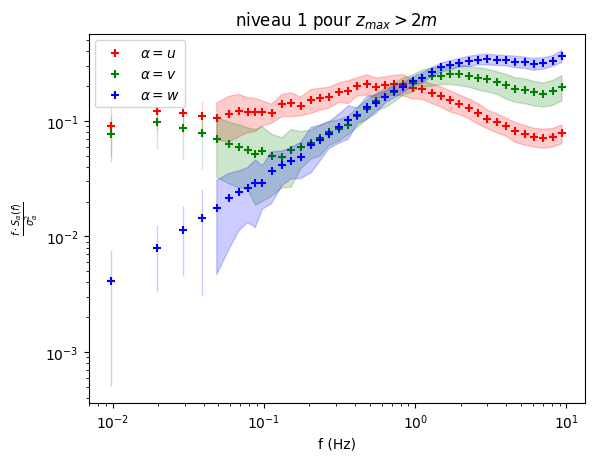

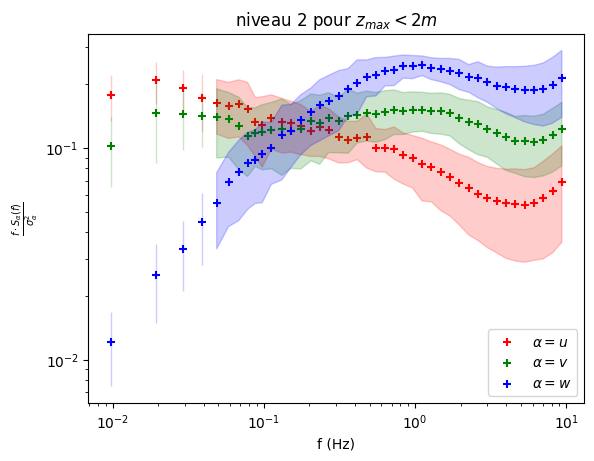

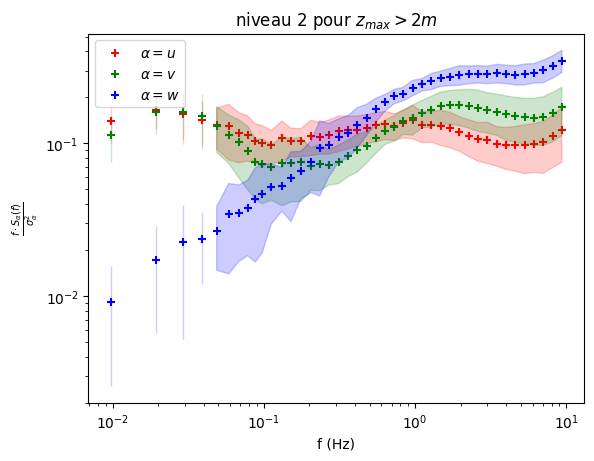

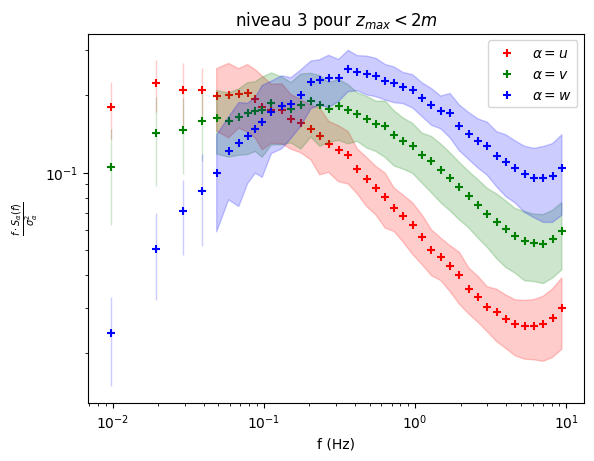

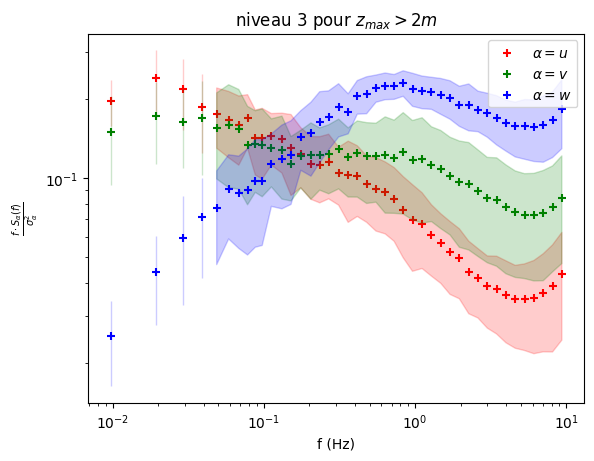

In [41]:
fig=plt.figure()
plt.title(r"niveau 1 pour $z_{max} < 2m$")
plot_spectre(T2_1_K_12['f_Su_norm'],color='r', label=r"$\alpha=u$")
plot_spectre(T2_1_K_12['f_Sv_norm'],color='g', label=r"$\alpha=v$")
plot_spectre(T2_1_K_12['f_Sw_norm'],color='b', label=r"$\alpha=w$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_\alpha(f)}{\sigma_\alpha^2}$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 1 pour $z_{max} > 2m$")
plot_spectre(T2_1_K_24['f_Su_norm'],color='r', label=r"$\alpha=u$")
plot_spectre(T2_1_K_24['f_Sv_norm'],color='g', label=r"$\alpha=v$")
plot_spectre(T2_1_K_24['f_Sw_norm'],color='b', label=r"$\alpha=w$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_\alpha(f)}{\sigma_\alpha^2}$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 2 pour $z_{max} < 2m$")
plot_spectre(T2_2_K_12['f_Su_norm'],color='r', label=r"$\alpha=u$")
plot_spectre(T2_2_K_12['f_Sv_norm'],color='g', label=r"$\alpha=v$")
plot_spectre(T2_2_K_12['f_Sw_norm'],color='b', label=r"$\alpha=w$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_\alpha(f)}{\sigma_\alpha^2}$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 2 pour $z_{max} > 2m$")
plot_spectre(T2_2_K_24['f_Su_norm'],color='r', label=r"$\alpha=u$")
plot_spectre(T2_2_K_24['f_Sv_norm'],color='g', label=r"$\alpha=v$")
plot_spectre(T2_2_K_24['f_Sw_norm'],color='b', label=r"$\alpha=w$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_\alpha(f)}{\sigma_\alpha^2}$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 3 pour $z_{max} < 2m$")
plot_spectre(T2_3_K_12['f_Su_norm'],color='r', label=r"$\alpha=u$")
plot_spectre(T2_3_K_12['f_Sv_norm'],color='g', label=r"$\alpha=v$")
plot_spectre(T2_3_K_12['f_Sw_norm'],color='b', label=r"$\alpha=w$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_\alpha(f)}{\sigma_\alpha^2}$")
plt.legend()

fig=plt.figure()
plt.title(r"niveau 3 pour $z_{max} > 2m$")
plot_spectre(T2_3_K_24['f_Su_norm'],color='r', label=r"$\alpha=u$")
plot_spectre(T2_3_K_24['f_Sv_norm'],color='g', label=r"$\alpha=v$")
plot_spectre(T2_3_K_24['f_Sw_norm'],color='b', label=r"$\alpha=w$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f (Hz)')
plt.ylabel(r"$\frac{f\cdot S_\alpha(f)}{\sigma_\alpha^2}$")
plt.legend()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


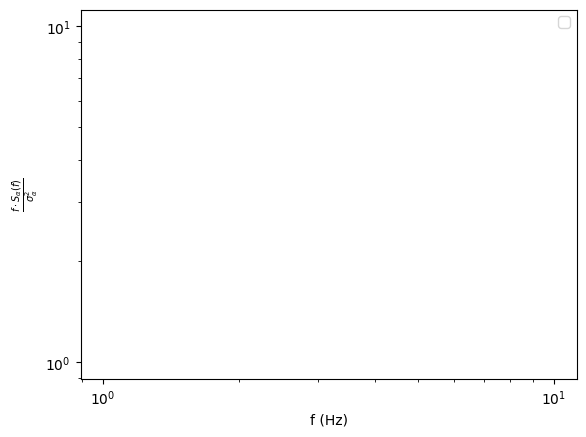

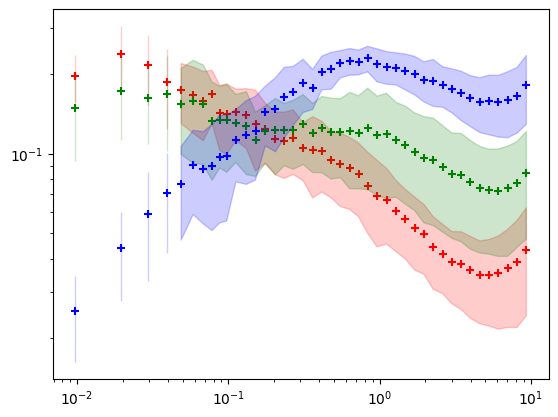

In [42]:
fig=plt.figure()
ax1=fig.add_subplot(111)
fig=plt.figure()
plot_spectre(T2_3_K_24['f_Su_norm'],axis=ax1,color='r', label=r"$\alpha=u$")
plot_spectre(T2_3_K_24['f_Sv_norm'],axis=ax1,color='g', label=r"$\alpha=v$")
plot_spectre(T2_3_K_24['f_Sw_norm'],axis=ax1,color='b', label=r"$\alpha=w$")
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel('f (Hz)')
ax1.set_ylabel(r"$\frac{f\cdot S_\alpha(f)}{\sigma_\alpha^2}$")
ax1.legend()


In [43]:
tmin_K=np.datetime64("2023-09-06 00:00:00")
tmax_K=np.datetime64("2023-09-08 00:00:00")
T2_1_K_inv,T2_2_K_inv,T2_3_K_inv=detection_catabatique(T2_1_2min_moy.sel(temps=slice(tmin_K,tmax_K)),
                                                       T2_2_2min_moy.sel(temps=slice(tmin_K,tmax_K)),
                                                       T2_3_2min_moy.sel(temps=slice(tmin_K,tmax_K)),mode='WDIR',drop=False)
print(T2_1_K_inv)
                                                                         

<xarray.Dataset>
Dimensions:                  (temps: 96, freq: 50)
Coordinates:
  * temps                    (temps) datetime64[ns] 2023-09-06T00:14:00 ... 2...
  * freq                     (freq) float64 nan 0.009766 nan ... 8.105 9.341
Data variables: (12/96)
    daytime                  (temps) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    Tau                      (temps) float64 -0.0471 -0.04498 ... -0.0193
    qc_Tau                   (temps) float64 0.0 0.0 0.0 ... 0.5333 0.0 0.1333
    H                        (temps) float64 -64.9 -65.02 ... -40.41 -43.69
    qc_H                     (temps) float64 0.0 0.0 0.0 ... 0.1333 0.1333
    H_strg                   (temps) float64 0.1248 0.2569 ... -0.1135 -0.2027
    ...                       ...
    f_C_wts_norm             (freq, temps) float64 nan nan ... -0.01983 0.1564
    f_Su                     (freq, temps) float64 nan nan ... 0.01227 0.0113
    f_Sv                     (freq, temps) float64 nan nan ... 0.01627 0.01469
   

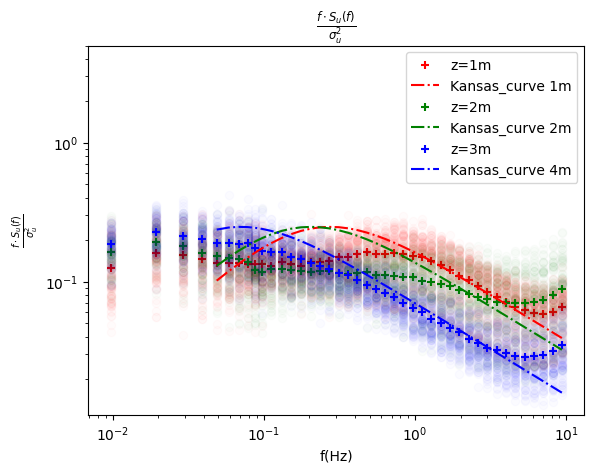

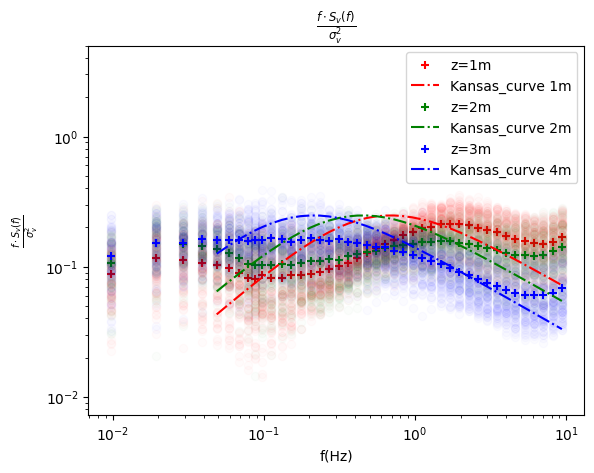

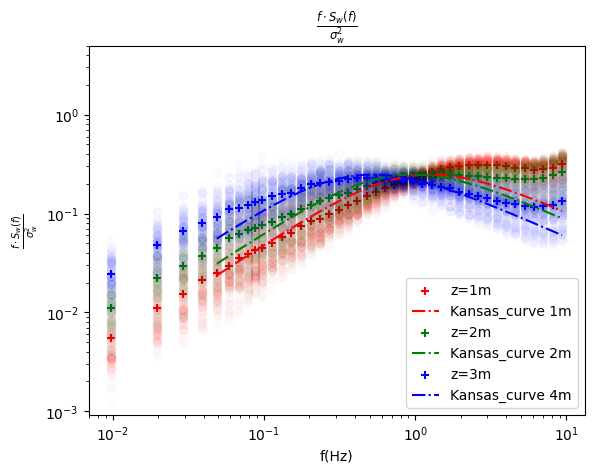

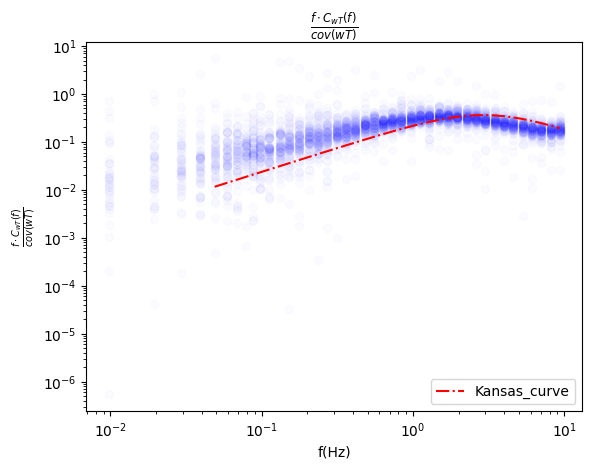

In [44]:
freq_1=spectre_1_moy.coords['freq'].values
freq_2=spectre_2_moy.coords['freq'].values
freq_3=spectre_3_moy.coords['freq'].values

fig=plt.figure()
plt.title(r"$\frac{f\cdot S_{u}(f)}{\sigma_u^2}$")
plt.scatter(freq_1,spectre_1_moy['f_Su_norm'].values,color='r',label=r"z=1m",marker='+')
plt.plot(freq_1,Kansas_spectra(freq,spectre_1_moy['f_Su_norm'].values),label='Kansas_curve 1m',color='r',linestyle='-.')
scatter_spectre(T2_1_K['f_Su_norm'],color='r',alpha=0.015)

plt.scatter(freq_2,spectre_2_moy['f_Su_norm'].values,color='g',label=r"z=2m",marker='+')
plt.plot(freq_2,Kansas_spectra(freq,spectre_2_moy['f_Su_norm'].values),label='Kansas_curve 2m',color='g',linestyle='-.')
scatter_spectre(T2_2_K['f_Su_norm'],color='g',alpha=0.015)

plt.scatter(freq_3,spectre_3_moy['f_Su_norm'].values,color='b',label=r"z=3m",marker='+')
plt.plot(freq_3,Kansas_spectra(freq,spectre_3_moy['f_Su_norm'].values),label='Kansas_curve 4m',color='b',linestyle='-.')
scatter_spectre(T2_3_K['f_Su_norm'],color='b',alpha=0.015)


plt.xscale('log')
plt.yscale('log')
plt.ylim(top=5)
plt.xlabel('f(Hz)')
plt.ylabel(r"$\frac{f\cdot S_u(f)}{\sigma_u^2}$")
plt.legend()

fig=plt.figure()
plt.title(r"$\frac{f\cdot S_{v}(f)}{\sigma_v^2}$")
plt.scatter(freq_1,spectre_1_moy['f_Sv_norm'].values,color='r',label=r"z=1m",marker='+')
plt.plot(freq_1,Kansas_spectra(freq,spectre_1_moy['f_Sv_norm'].values),label='Kansas_curve 1m',color='r',linestyle='-.')
scatter_spectre(T2_1_K['f_Sv_norm'],color='r',alpha=0.015)

plt.scatter(freq_2,spectre_2_moy['f_Sv_norm'].values,color='g',label=r"z=2m",marker='+')
plt.plot(freq_2,Kansas_spectra(freq,spectre_2_moy['f_Sv_norm'].values),label='Kansas_curve 2m',color='g',linestyle='-.')
scatter_spectre(T2_2_K['f_Sv_norm'],color='g',alpha=0.015)

plt.scatter(freq_3,spectre_3_moy['f_Sv_norm'].values,color='b',label=r"z=3m",marker='+')
plt.plot(freq_3,Kansas_spectra(freq,spectre_3_moy['f_Sv_norm'].values),label='Kansas_curve 4m',color='b',linestyle='-.')
scatter_spectre(T2_3_K['f_Sv_norm'],color='b',alpha=0.015)


plt.xscale('log')
plt.yscale('log')
plt.ylim(top=5)
plt.xlabel('f(Hz)')
plt.ylabel(r"$\frac{f\cdot S_v(f)}{\sigma_v^2}$")
plt.legend()

fig=plt.figure()
plt.title(r"$\frac{f\cdot S_{w}(f)}{\sigma_w^2}$")
plt.scatter(freq_1,spectre_1_moy['f_Sw_norm'].values,color='r',label=r"z=1m",marker='+')
plt.plot(freq_1,Kansas_spectra(freq,spectre_1_moy['f_Sw_norm'].values),label='Kansas_curve 1m',color='r',linestyle='-.')
scatter_spectre(T2_1_K['f_Sw_norm'],color='r',alpha=0.015)

plt.scatter(freq_2,spectre_2_moy['f_Sw_norm'].values,color='g',label=r"z=2m",marker='+')
plt.plot(freq_2,Kansas_spectra(freq,spectre_2_moy['f_Sw_norm'].values),label='Kansas_curve 2m',color='g',linestyle='-.')
scatter_spectre(T2_2_K['f_Sw_norm'],color='g',alpha=0.015)

plt.scatter(freq_3,spectre_3_moy['f_Sw_norm'].values,color='b',label=r"z=3m",marker='+')
plt.plot(freq_3,Kansas_spectra(freq,spectre_3_moy['f_Sw_norm'].values),label='Kansas_curve 4m',color='b',linestyle='-.')
scatter_spectre(T2_3_K['f_Sw_norm'],color='b',alpha=0.015)


plt.xscale('log')
plt.yscale('log')
plt.ylim(top=5)
plt.xlabel('f(Hz)')
plt.ylabel(r"$\frac{f\cdot S_w(f)}{\sigma_w^2}$")
plt.legend()

fig=plt.figure()
plt.title(r"$\frac{f\cdot C_{wT}(f)}{cov(wT)}$")
scatter_spectre(T2_1_K['f_C_wts_norm'],color='b',alpha=0.015)
plt.plot(freq,Kansas_cospectra(freq,spectre_1_moy['f_C_wts_norm'].values,freq_min=2.0,freq_max=5.0),
         label='Kansas_curve',color='r',linestyle='-.')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$\frac{f\cdot C_{wT}(f)}{cov(wT)}$")
plt.legend()


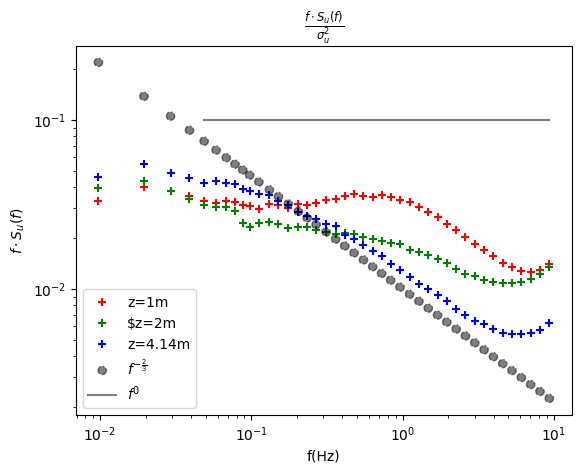

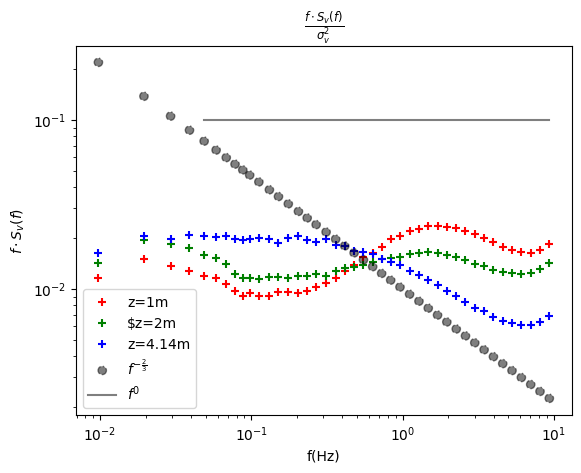

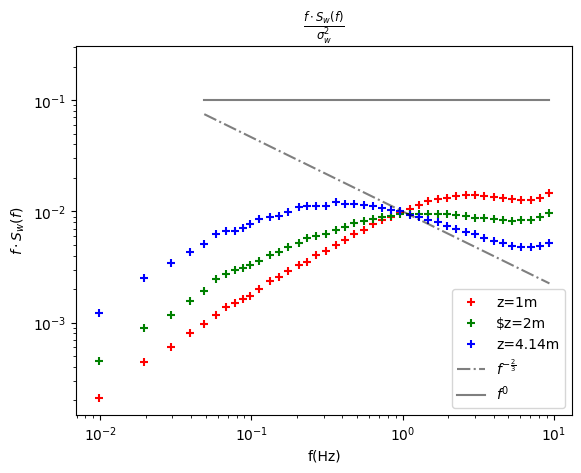

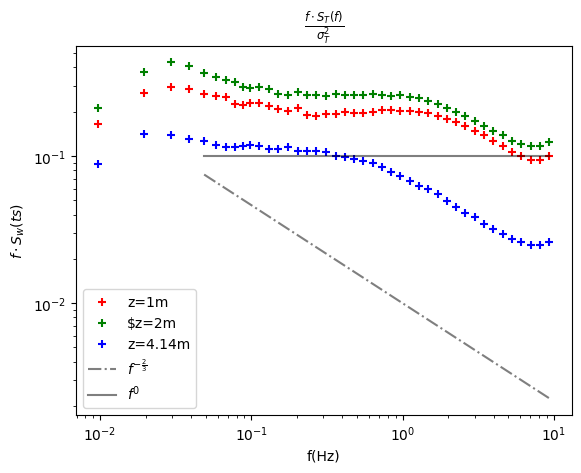

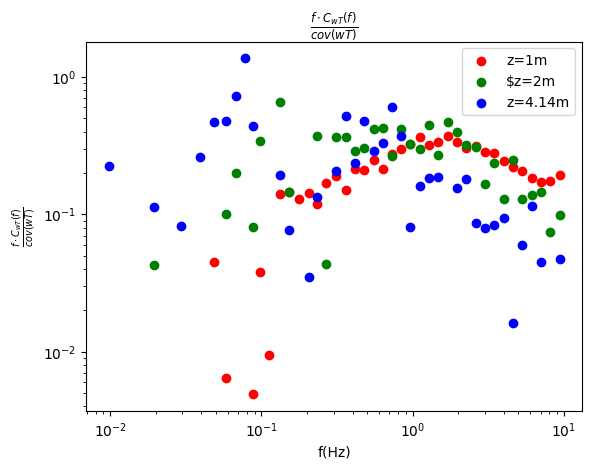

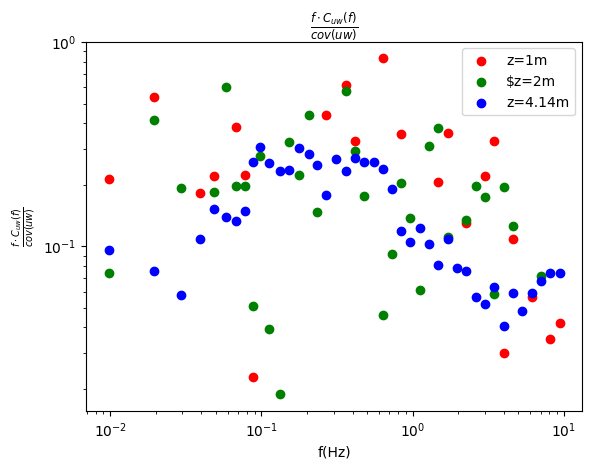

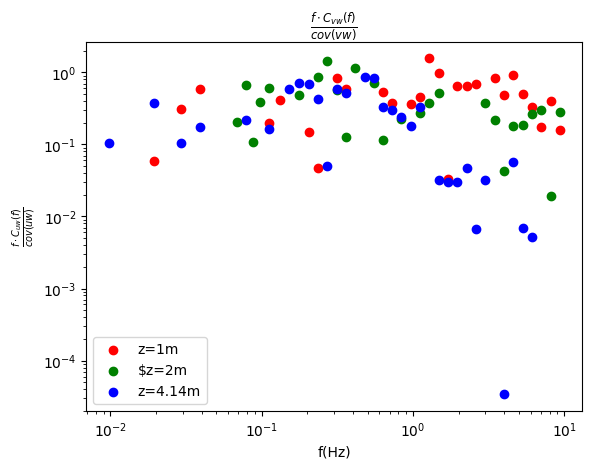

In [45]:
fig=plt.figure()
plt.title(r"$\frac{f\cdot S_{u}(f)}{\sigma_u^2}$")
plt.scatter(freq,spectre_1_moy['f_Su'].values,color='r',marker='+',label=r"z=1m")
plt.scatter(freq,spectre_2_moy['f_Su'].values,color='g',marker='+',label=r"$z=2m")
plt.scatter(freq,spectre_3_moy['f_Su'].values,color='b',marker='+',label=r"z=4.14m")
plt.scatter(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$",linestyle='-.')
plt.plot(freq,1.0e-1*np.ones(freq.size),color='k',alpha=0.5,label=r"$f^0$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$f\cdot S_u(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"$\frac{f\cdot S_{v}(f)}{\sigma_v^2}$")
plt.scatter(freq,spectre_1_moy['f_Sv'].values,color='r',marker='+',label=r"z=1m")
plt.scatter(freq,spectre_2_moy['f_Sv'].values,color='g',marker='+',label=r"$z=2m")
plt.scatter(freq,spectre_3_moy['f_Sv'].values,color='b',marker='+',label=r"z=4.14m")
plt.scatter(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$",linestyle='-.')
plt.plot(freq,1.0e-1*np.ones(freq.size),color='k',alpha=0.5,label=r"$f^0$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$f\cdot S_v(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"$\frac{f\cdot S_{w}(f)}{\sigma_w^2}$")
plt.scatter(freq,spectre_1_moy['f_Sw'].values,color='r',marker='+',label=r"z=1m")
plt.scatter(freq,spectre_2_moy['f_Sw'].values,color='g',marker='+',label=r"$z=2m")
plt.scatter(freq,spectre_3_moy['f_Sw'].values,color='b',marker='+',label=r"z=4.14m")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$",linestyle='-.')
plt.plot(freq,1.0e-1*np.ones(freq.size),color='k',alpha=0.5,label=r"$f^0$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$f\cdot S_w(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"$\frac{f\cdot S_{T}(f)}{\sigma_T^2}$")
plt.scatter(freq,spectre_1_moy['f_Sts'].values,color='r',marker='+',label=r"z=1m")
plt.scatter(freq,spectre_2_moy['f_Sts'].values,color='g',marker='+',label=r"$z=2m")
plt.scatter(freq,spectre_3_moy['f_Sts'].values,color='b',marker='+',label=r"z=4.14m")
plt.plot(freq,0.01*freq**(-2.0/3.0),color='k',alpha=0.5,label=r"$f^{-\frac{2}{3}}$",linestyle='-.')
plt.plot(freq,1.0e-1*np.ones(freq.size),color='k',alpha=0.5,label=r"$f^0$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$f\cdot S_w(ts)$")
plt.legend()

fig=plt.figure()
plt.title(r"$\frac{f\cdot C_{wT}(f)}{cov(wT)}$")
plt.scatter(freq,spectre_1_moy['f_C_wts_norm'].values,color='r',label=r"z=1m")
plt.scatter(freq,spectre_2_moy['f_C_wts_norm'].values,color='g',label=r"$z=2m")
plt.scatter(freq,spectre_3_moy['f_C_wts_norm'].values,color='b',label=r"z=4.14m")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$\frac{f\cdot C_{wT}(f)}{cov(wT)}$")
plt.legend()

fig=plt.figure()
plt.title(r"$\frac{f\cdot C_{uw}(f)}{cov(uw)}$")
plt.scatter(freq,spectre_1_moy['f_C_wu_norm'].values,color='r',label=r"z=1m")
plt.scatter(freq,spectre_2_moy['f_C_wu_norm'].values,color='g',label=r"$z=2m")
plt.scatter(freq,spectre_3_moy['f_C_wu_norm'].values,color='b',label=r"z=4.14m")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$\frac{f\cdot C_{uw}(f)}{cov(uw)}$")
plt.legend()

fig=plt.figure()
plt.title(r"$\frac{f\cdot C_{vw}(f)}{cov(vw)}$")
plt.scatter(freq,spectre_1_moy['f_C_wv_norm'].values,color='r',label=r"z=1m")
plt.scatter(freq,spectre_2_moy['f_C_wv_norm'].values,color='g',label=r"$z=2m")
plt.scatter(freq,spectre_3_moy['f_C_wv_norm'].values,color='b',label=r"z=4.14m")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$\frac{f\cdot C_{uw}(f)}{cov(uw)}$")
plt.legend()

In [46]:
print(spectre_3_moy.data_vars)

Data variables:
    daytime                     float64 0.5281
    Tau                         float64 0.02622
    qc_Tau                      float64 0.3326
    H                           float64 -33.28
    qc_H                        float64 0.4052
    H_strg                      float64 0.02189
    co2_def_timelag             float64 9.0
    h2o_def_timelag             float64 9.0
    ch4_def_timelag             float64 9.0
    none_def_timelag            float64 9.0
    sonic_temperature           float64 285.5
    air_temperature             float64 285.5
    air_pressure                float64 7.288e+04
    air_density                 float64 0.8894
    air_heat_capacity           float64 1.005e+03
    air_molar_volume            float64 0.03257
    es                          float64 1.433e+03
    u_unrot                     float64 0.959
    v_unrot                     float64 3.725
    w_unrot                     float64 -0.7324
    u_rot                       float64 3.942
 

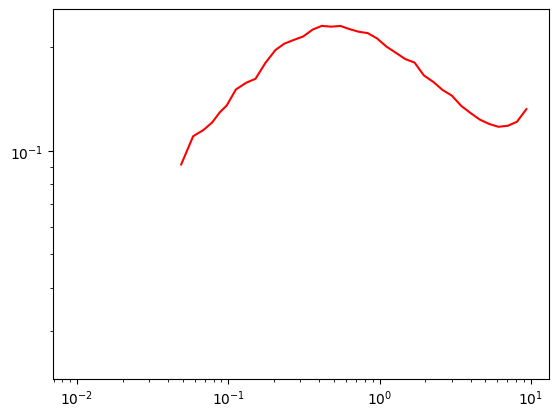

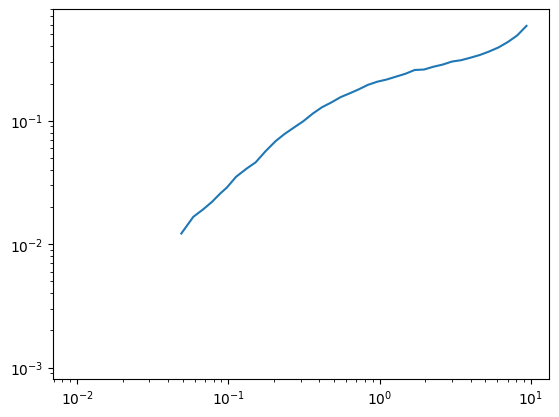

In [47]:
spectre=spectre_3_moy['f_Sw_norm'].values
freq=spectre_1_moy.coords['freq'].values
x=spectre*(freq**(2.0/3.0))
fig=plt.figure()
plt.plot(freq,spectre,color='r')
plt.xscale('log')
plt.yscale('log')
fig=plt.figure()
plt.plot(freq,x)
plt.yscale('log')
plt.xscale('log')

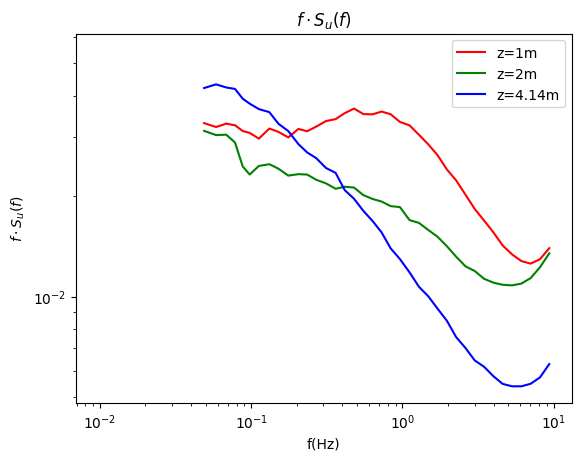

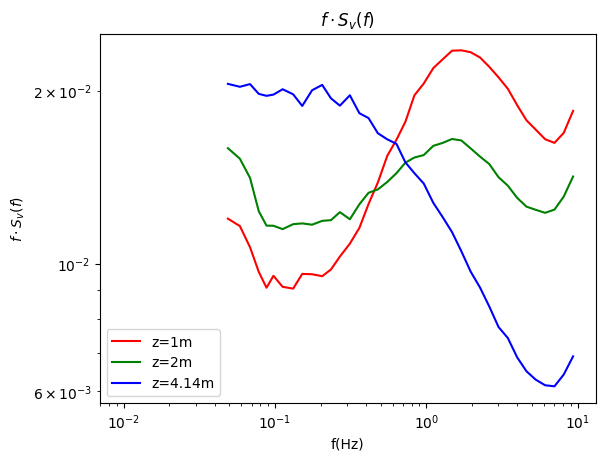

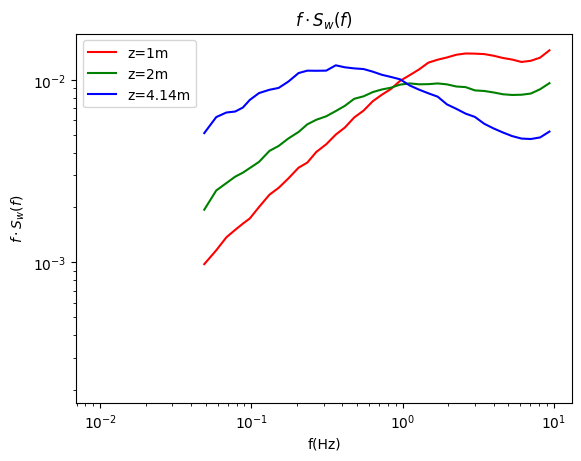

In [48]:
fig=plt.figure()
plt.title(r"$f\cdot S_{u}(f)$")
plt.plot(freq,spectre_1_moy['f_Su'].values,color='r',label=r"z=1m")
plt.plot(freq,spectre_2_moy['f_Su'].values,color='g',label=r"z=2m")
plt.plot(freq,spectre_3_moy['f_Su'].values,color='b',label=r"z=4.14m")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$f\cdot S_u(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"$f\cdot S_{v}(f)$")
plt.plot(freq,spectre_1_moy['f_Sv'].values,color='r',label=r"z=1m")
plt.plot(freq,spectre_2_moy['f_Sv'].values,color='g',label=r"z=2m")
plt.plot(freq,spectre_3_moy['f_Sv'].values,color='b',label=r"z=4.14m")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$f\cdot S_v(f)$")
plt.legend()

fig=plt.figure()
plt.title(r"$f\cdot S_{w}(f)$")
plt.plot(freq,spectre_1_moy['f_Sw'].values,color='r',label=r"z=1m")
plt.plot(freq,spectre_2_moy['f_Sw'].values,color='g',label=r"z=2m")
plt.plot(freq,spectre_3_moy['f_Sw'].values,color='b',label=r"z=4.14m")
plt.xscale('log')
plt.yscale('log')
plt.xlabel('f(Hz)')
plt.ylabel(r"$f\cdot S_w(f)$")
plt.legend()

In [49]:
x=np.arange(10)
y=np.arange(3,13)
print(f"x :{x}")
print(f"y : {y}")
print(f"x[x >5] {x[x>5]}")
print(f"y[x >5] {y[x>5]}")

x :[0 1 2 3 4 5 6 7 8 9]
y : [ 3  4  5  6  7  8  9 10 11 12]
x[x >5] [6 7 8 9]
y[x >5] [ 9 10 11 12]


In [50]:
T2_1_30min_new=xr.combine_by_coords([T2_1_30min, spectres_1_30min])
print(T2_1_30min_new)
#print(T2_1_30min_new.data_vars)
print(T2_1_30min_new['f_Su'])

<xarray.Dataset>
Dimensions:                  (temps: 360, freq: 50)
Coordinates:
  * temps                    (temps) datetime64[ns] 2023-09-01T00:30:00 ... 2...
  * freq                     (freq) float64 0.0006104 nan nan ... 7.489 9.11
Data variables: (12/96)
    daytime                  (temps) int64 ...
    Tau                      (temps) float64 ...
    qc_Tau                   (temps) int64 ...
    H                        (temps) float64 ...
    qc_H                     (temps) int64 ...
    H_strg                   (temps) float64 ...
    ...                       ...
    f_C_wts_norm             (freq, temps) float64 -0.04818 -0.09394 ... 0.1877
    f_Su                     (freq, temps) float64 0.04543 0.2335 ... 0.006865
    f_Sv                     (freq, temps) float64 0.575 0.6942 ... 0.007705
    f_Sw                     (freq, temps) float64 0.003323 0.0114 ... 0.005545
    f_Sts                    (freq, temps) float64 0.004414 0.00273 ... 0.09926
    f_C_wts       

In [51]:
import pandas as pd
nom_fichier=r"C:\Users\evanl\Documents\Stage IGE\T2_TO5_EddyPro\output-1-30min-new\eddypro_T2_1_30min_qc_details_2024-07-12T105159_adv.csv"
Df_qc_1=pd.read_csv(nom_fichier,
                    header=1,
                    usecols=lambda x: x not in ['filename','DOY'],
                    skiprows=lambda x: x in [2])
datetime=pd.to_datetime(Df_qc_1['date'].values+' '+Df_qc_1['time'].values)

print(Df_qc_1)

           date   time  dev(u)  dev(w)  dev(ts)  dev(w/u)  dev(w/ts)  \
0    2023-09-01  00:30      24       4       21        23         19   
1    2023-09-01  01:00      12      14       14        24         14   
2    2023-09-01  01:30      27       3       10        22          3   
3    2023-09-01  02:00      38       7        8        19          0   
4    2023-09-01  02:30      33       3       11        10          4   
..          ...    ...     ...     ...      ...       ...        ...   
355  2023-09-08  10:00       9       0        3         0          0   
356  2023-09-08  10:30      19       0        4         2          0   
357  2023-09-08  11:00      16       0        4         5          3   
358  2023-09-08  11:30      67       0       29        47        156   
359  2023-09-08  12:00      75       2       13        38         46   

     flag(w/u)  flag(w/ts)  dev(u).1  dev(w).1  dev(ts).1  flag(u)  flag(w)  \
0            2           2        38        37          

niveau 1 : 253 echantillons valides sur 360 (soit 70.0 %)
253


(0.0, 100.0)

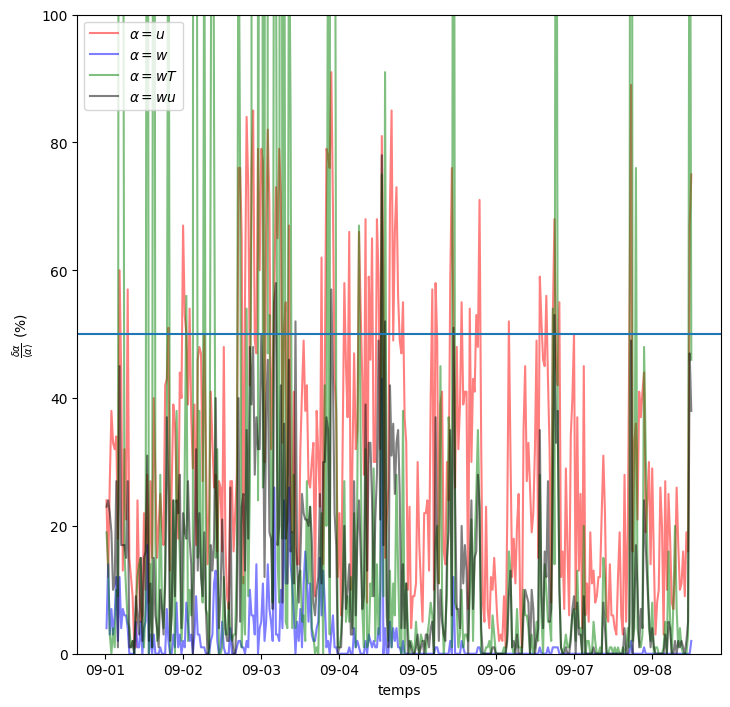

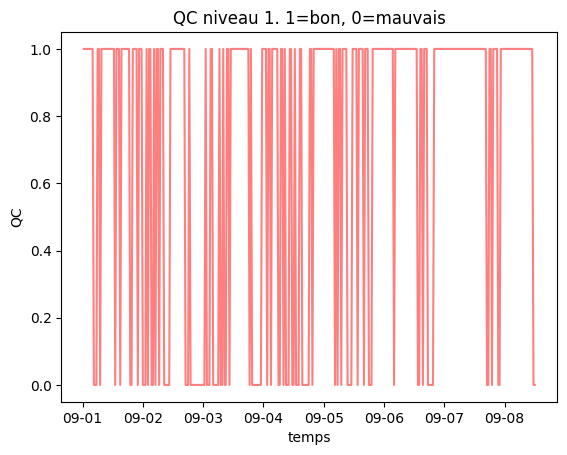

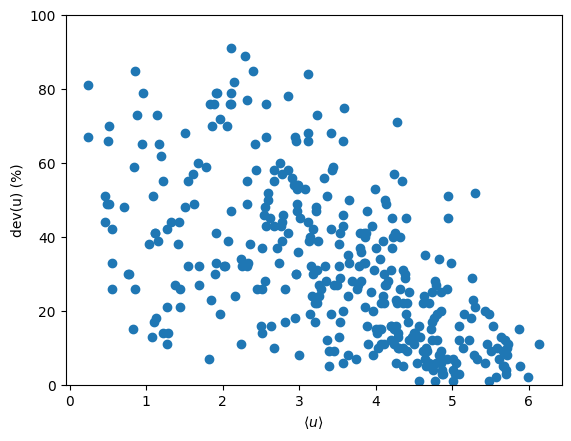

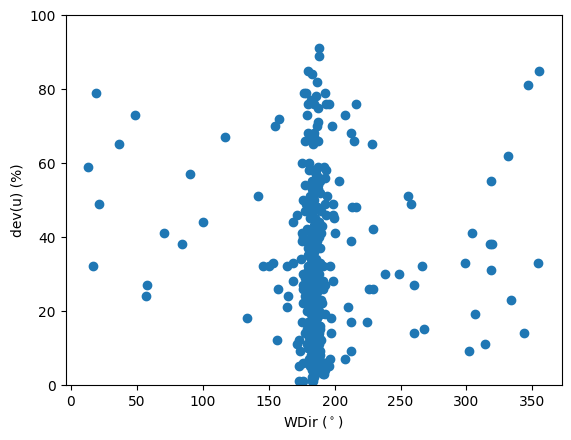

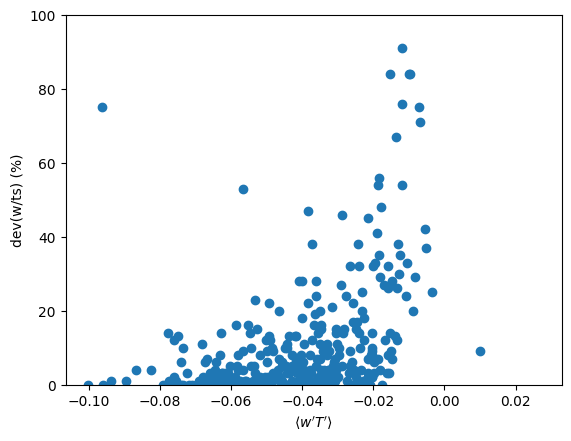

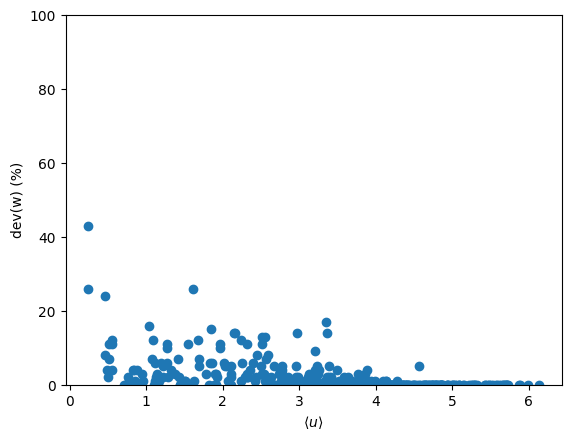

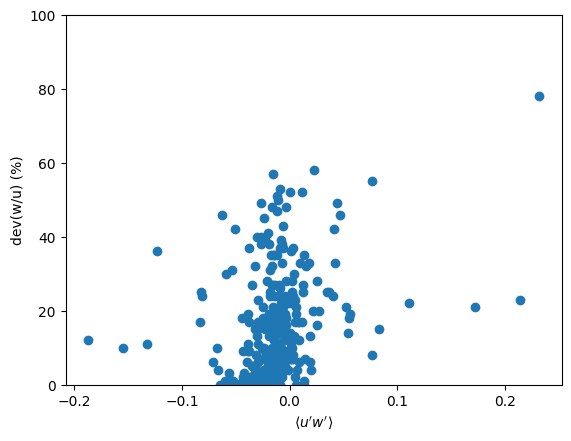

In [52]:
fig=plt.figure(figsize=(8.3,8.3))
date_format=mpl.dates.DateFormatter("%m-%d")
ax = fig.add_subplot(111)
ax.plot(datetime,Df_qc_1['dev(u)'].values,color='r',label=r'$\alpha=u$',alpha=0.5)
ax.plot(datetime,Df_qc_1['dev(w)'].values,color='b',label=r'$\alpha=w$',alpha=0.5)
ax.plot(datetime,Df_qc_1['dev(w/ts)'].values,color='g',label=r'$\alpha=wT$',alpha=0.5)
ax.plot(datetime,Df_qc_1['dev(w/u)'].values,color='k',label=r'$\alpha=wu$',alpha=0.5)
ax.axhline(50)
ax.set_ylim(0,100)
ax.set_xlabel("temps")
ax.set_ylabel(r"$\frac{\delta \alpha}{\langle \alpha \rangle}$ (%)")
ax.xaxis.set_major_formatter(date_format)
ax.legend()

seuil_std=50
seuil_cov=30

qc_tot=((Df_qc_1['dev(u)'].values <= seuil_std) &
        (Df_qc_1['dev(w)'].values <=seuil_std) &
        (Df_qc_1['dev(w/ts)'].values <=seuil_cov) &
        (Df_qc_1['dev(w/u)'].values <=seuil_cov))
print(f"niveau 1 : {np.sum(qc_tot)} echantillons valides sur {qc_tot.size} (soit {100.0*np.round(np.sum(qc_tot)/qc_tot.size,2)} %)")
fig=plt.figure()
ax = fig.add_subplot(111)
ax.set_title("QC niveau 1. 1=bon, 0=mauvais")
ax.plot(datetime,qc_tot,color='r',alpha=0.5)
ax.set_xlabel("temps")
ax.set_ylabel(r"QC")
ax.xaxis.set_major_formatter(date_format)
print(np.sum(qc_tot))

fig=plt.figure()
plt.scatter(T2_1_30min['u_rot'].values,Df_qc_1['dev(u)'].values)
plt.xlabel(r"$\langle u \rangle$")
plt.ylabel(r"dev(u) (%)")
plt.ylim(0,100)

fig=plt.figure()
plt.scatter(T2_1_30min['wind_dir'].values,Df_qc_1['dev(u)'].values)
plt.xlabel(r"WDir ($^\circ$)")
plt.ylabel(r"dev(u) (%)")
plt.ylim(0,100)



fig=plt.figure()
plt.scatter(T2_1_30min['wts_cov'].values,Df_qc_1['dev(w/ts)'].values)
plt.xlabel(r"$\langle w'T' \rangle$")
plt.ylabel(r"dev(w/ts) (%)")
plt.ylim(0,100)

fig=plt.figure()
plt.scatter(T2_1_30min['u_rot'].values,Df_qc_1['dev(w)'].values)
plt.xlabel(r"$\langle u \rangle$")
plt.ylabel(r"dev(w) (%)")
plt.ylim(0,100)

fig=plt.figure()
plt.scatter(T2_1_30min['wu_cov'].values,Df_qc_1['dev(w/u)'].values)
plt.xlabel(r"$\langle u'w' \rangle$")
plt.ylabel(r"dev(w/u) (%)")
plt.ylim(0,100)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


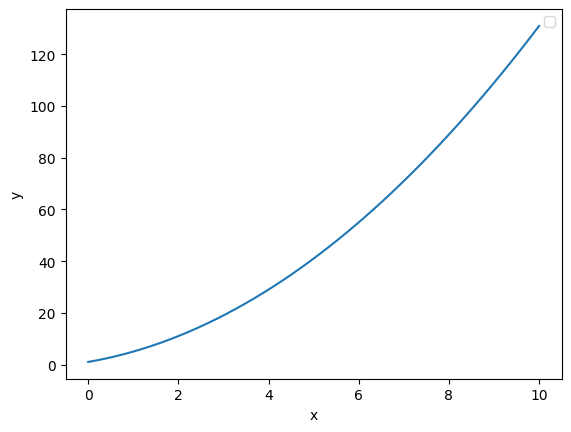

In [53]:
y=np.linspace(0,10)
color='r'
label='toto'
fig=plt.figure()
plt.plot(y,y**2+3*y+1,color=None,label=None)
plt.xlabel('x')
plt.ylabel('y')
plt.legend()

(1000, 100)
(1000,)
(1000,)


Text(0, 0.5, '$\\langle a \\rangle_{bloc}$')

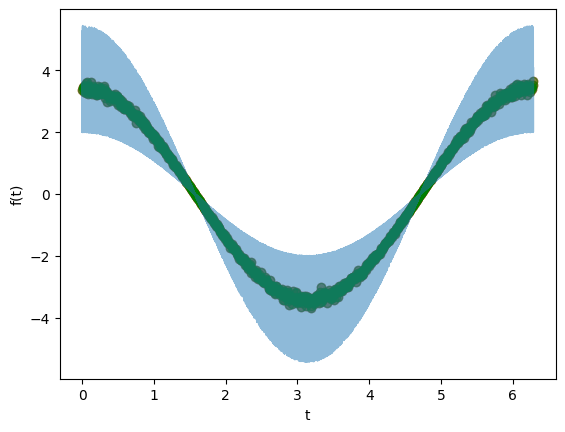

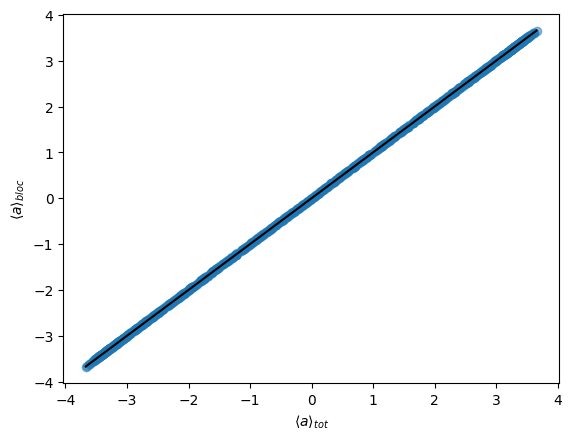

In [54]:
Ny=1000
Nx=100
t=np.linspace(0,2.0*np.pi,Ny*Nx)
t_avg=np.linspace(0,2.0*np.pi,Ny)
f=1
f_t=2.0*np.exp(np.random.rand(Nx*Ny))*np.cos(f*t)
a_rand=f_t.reshape(Ny,Nx)
a_moy_tot=np.mean(a_rand,axis=1)
a_moy_bloc=np.array([np.mean(a_rand[i]) for i in range(a_rand.shape[0])])
print(a_rand.shape)
print(a_moy_tot.shape)
print(a_moy_bloc.shape)

fig=plt.figure()
plt.plot(t,f_t,alpha=0.5)
plt.scatter(t_avg,a_moy_tot,color='r',alpha=0.5)
plt.scatter(t_avg,a_moy_bloc,color='g',alpha=0.5)
plt.xlabel('t')
plt.ylabel('f(t)')

fig=plt.figure()
plt.scatter(a_moy_tot,a_moy_bloc,alpha=0.5)
Bulk.slope_1(a_moy_tot, color='k')
plt.xlabel(r'$\langle a \rangle_{tot}$')
plt.ylabel(r'$\langle a \rangle_{bloc}$')

In [55]:
d=100#m
u=5.0#m/s
rho=0.9#kg/m^3
mu=1.85e-5#Pa.s
nu=mu/rho
Re=u*d/nu
eta=d*Re**-0.75
print(f"nu = {nu} m^2/s")
print(f"<U> = {u} m/s")
print(f"Re = {Re:e}")
print(f"d = {d} m")
print(f"eta = {eta:e} m")

nu = 2.0555555555555555e-05 m^2/s
<U> = 5.0 m/s
Re = 2.432432e+07
d = 100 m
eta = 2.887150e-04 m


In [56]:
print(f" {0.0003:e}")

 3.000000e-04


[0 1 2 3 4 5 6 7 8 9]
[ 0  1  4  9 16 25 36 49 64 81]
(array([4, 5, 6, 7]), array([16, 25, 36, 49]))
[1.11328 1.11328 1.28418 1.28418 1.11328 1.28418 1.11328 1.11328 1.11328
 1.11328 1.11328 1.11328 1.11328 1.11328 1.11328 1.28418 1.11328 1.11328
 1.11328 1.28418 1.11328 1.11328 1.11328 1.11328 1.11328 1.11328 1.11328
 1.11328 1.11328 1.28418 1.11328 1.11328 1.11328 1.28418 1.11328 1.11328
 1.28418 1.11328 1.11328 1.47949 1.47949 1.11328 1.28418 1.11328 1.11328
 1.11328 1.28418 1.11328 1.28418 1.11328 1.28418 1.11328 1.28418 1.11328
 1.11328 1.11328 1.11328 1.11328 1.47949 1.28418 1.11328 1.11328 1.28418
 1.11328 1.11328 1.11328 1.11328 1.11328 1.11328 1.28418 1.11328 1.11328
 1.11328 1.11328 1.11328 1.28418 1.11328 1.11328 1.11328 1.28418 1.28418
 1.28418 1.11328 1.28418 1.28418 1.28418 1.11328 1.11328 1.28418]


Text(0.5, 0, 'z (m)')

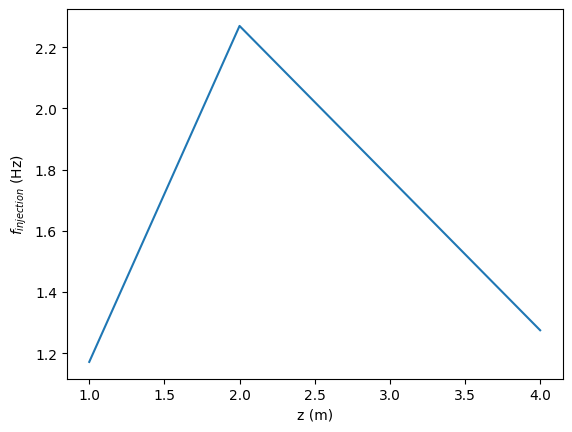

In [57]:
def plage_valeur(x,y,xmin,xmax):
    #print(x[(x >= xmin) & (x <= xmax)])
    #print(y)
    #print(y[(x >= xmin) & (x <= xmax)])
    return x[(x >= xmin) & (x <= xmax)],y[(x >= xmin) & (x <= xmax)]
t=np.arange(10)
t1=t**2
print(t)
print(t1)
print(plage_valeur(t,t1,4,7))


def freq_injection(freq, spectre, f_min=1.0, f_max=10.0):
    plage_f,plage_spectre=plage_valeur(freq, spectre,f_min,f_max)
    max_spectre=np.argmax(plage_spectre)
    #print(plage_f)
    #print(plage_spectre)
    #print(max_spectre)
    return plage_f[max_spectre]

f_i_u_1=np.array([freq_injection(T2_1_K.coords['freq'].values, T2_1_K['f_Su'].isel(temps=i).values) for i in range(0,T2_1_K.coords['temps'].size)])
f_i_u_2=np.array([freq_injection(T2_2_K.coords['freq'].values, T2_2_K['f_Su'].isel(temps=i).values) for i in range(0,T2_2_K.coords['temps'].size)])
f_i_u_3=np.array([freq_injection(T2_3_K.coords['freq'].values, T2_3_K['f_Su'].isel(temps=i).values) for i in range(0,T2_3_K.coords['temps'].size)])

f_i_u_1_moy=np.mean(f_i_u_1)
f_i_u_2_moy=np.mean(f_i_u_2)
f_i_u_3_moy=np.mean(f_i_u_3)


print(f_i_u_1)
fig=plt.figure()
plt.plot([1,2,4],[f_i_u_1_moy,
                     f_i_u_2_moy,
                     f_i_u_3_moy])
plt.ylabel(r"$f_{injection}$ (Hz)")
plt.xlabel(r"z (m)")

In [58]:
print(T2_1_K['f_Su'])

<xarray.DataArray 'f_Su' (freq: 50, temps: 89)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [0.01234871, 0.02295275, 0.02556741, ..., 0.03313192, 0.02789788,
        0.01696202],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [0.02144872, 0.02185058, 0.02202924, ..., 0.009078  , 0.01023485,
        0.00992033],
       [0.02087754, 0.02127188, 0.02344446, ..., 0.0092199 , 0.01138228,
        0.00972342],
       [0.02405896, 0.02383446, 0.02452492, ..., 0.01037976, 0.01226979,
        0.01129847]])
Coordinates:
  * temps    (temps) datetime64[ns] 2023-09-06T00:14:00 ... 2023-09-07T23:44:00
  * freq     (freq) float64 nan 0.009766 nan nan nan ... 6.104 7.036 8.105 9.341


In [59]:
a=np.array([np.NaN for i in range(0,10)])
print(a[a <=0])

[]


Text(0.5, 0, 'label 2')

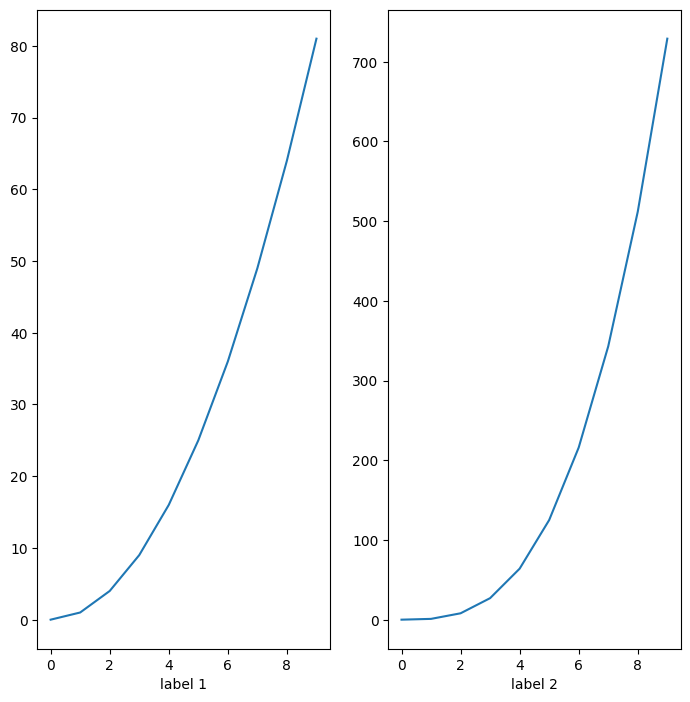

In [60]:
%matplotlib inline
def plot(x,y, axis=None,**kwargs):
    if isinstance(axis,mpl.axes.Axes):
        axis.plot(x,y,**kwargs)
    else:
        plt.errorbar(x,y,**kwargs)
x=np.arange(10)
fig=plt.figure(figsize=(8.3,8.3))
ax=fig.add_subplot(121)
plt.plot(x,x**2)
plt.xlabel('label 1')
ax2=fig.add_subplot(122)
plt.plot(x,x**3)
plt.xlabel('label 2')